In [ ]:
# #-- Descomprimimos el dataset
# !rm -r mnist
#!unzip mnist.zip

In [ ]:
#--- Buscamos las direcciones de cada archivo de imagen
from glob import glob

train_files = glob('./mnist/train/*/*.png')
valid_files = glob('./mnist/valid/*/*.png')
test_files = glob('./mnist/test/*/*.png')

train_files[0]

'./mnist/train/1/6783.png'

In [ ]:
#--- Ordenamos los datos de forma aleatoria para evitar sesgos
import numpy as np

np.random.shuffle(train_files)
np.random.shuffle(valid_files)
np.random.shuffle(test_files)

len(train_files), len(valid_files), len(test_files)

(6000, 2000, 992)

In [ ]:
#--- Cargamos los datos de entrenamiento en listas
from PIL import Image

N_train = len(train_files)
X_train = []
Y_train = []

for i, train_file in enumerate(train_files):
  Y_train.append( int(train_file.split('/')[3]) )
  X_train.append(np.array(Image.open(train_file)))

In [ ]:
#--- Cargamos los datos de vaidación en listas

from PIL import Image

N_valid = len(valid_files)
X_valid = []
Y_valid = []

for i, valid_file in enumerate(valid_files):
  Y_valid.append( int(valid_file.split('/')[3]) )
  X_valid.append( np.array(Image.open(valid_file)) )

In [ ]:
#--- Cargamos los datos de testeo en listas
N_test = len(test_files)
X_test = []
Y_test = []

for i, test_file in enumerate(test_files):
  Y_test.append( int(test_file.split('/')[3]) )
  X_test.append( np.array(Image.open(test_file)) )

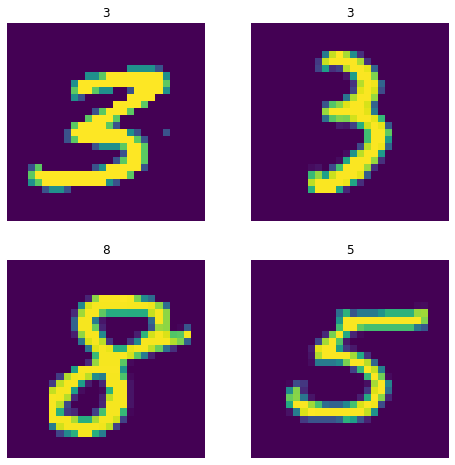

In [ ]:
#-- Visualizamos los datos
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(8,8))
for i in range(4):
  plt.subplot(2,2,i+1)
  plt.imshow(X_test[i*15])
  plt.title(Y_test[i*15])
  plt.axis(False)
plt.show()

In [ ]:
#--- Convetimos las listas con los datos a tensores de torch
import torch
from torch.autograd import Variable


X_train = Variable(torch.from_numpy(np.array(X_train))).float()
Y_train = Variable(torch.from_numpy(np.array(Y_train))).long()

X_valid = Variable(torch.from_numpy(np.array(X_valid))).float()
Y_valid = Variable(torch.from_numpy(np.array(Y_valid))).long()

X_test = Variable(torch.from_numpy(np.array(X_test))).float()
Y_test = Variable(torch.from_numpy(np.array(Y_test))).long()

X_train.data.size()

torch.Size([6000, 28, 28])

In [ ]:
from sklearn.metrics import confusion_matrix

def CM(Y_true, Y_pred, classes):
  fig = plt.figure(figsize=(10, 10))
  cm = confusion_matrix(Y_true, Y_pred)
  lclasses = np.arange(0,classes)
  cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
  cmap=plt.cm.Blues
  ax = fig.add_subplot(1,1,1)
  im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
  ax.figure.colorbar(im, ax=ax, pad=0.01, shrink=0.86)
  ax.set(xticks=np.arange(cm.shape[1]), yticks=np.arange(cm.shape[0]),xticklabels=lclasses, yticklabels=lclasses)
  ax.set_xlabel("Predicted",size=20)
  ax.set_ylabel("True",size=20)
  ax.set_ylim(classes-0.5, -0.5)

  plt.setp(ax.get_xticklabels(), size=12)
  plt.setp(ax.get_yticklabels(), size=12)

  fmt = '.2f'
  thresh = cm.max()/2.
  for i in range(cm.shape[0]):
      for j in range(cm.shape[1]):
          ax.text(j, i, format(cm[i, j], fmt),ha="center", va="center",size=15 , color="white" if cm[i, j] > thresh else "black")

  plt.show()

# Metaparametros

* **n_layers** = Número de capas
* **n_neurons** = Número de neuronas
* **n_epoch** = Número de épocas
* **lr** = Tasa de aprendizaje - learning rate
* **weight_decay** = peso de decaímiento
* **batch_size** = Tamaño del subconjunto

In [ ]:
from sklearn.metrics import f1_score

def train_valid(model, n_epoch, optimizer, criterion):
  loss_train = []
  f1_train = []
  acc_train = []

  loss_valid = []
  f1_valid = []
  acc_valid = []

  for epoch in range(n_epoch):
    model.train()

    Xtr = X_train.view(X_train.size(0), -1)
    Y_pred = model(Xtr)

    loss = criterion(Y_pred,Y_train)
    loss_train.append(loss.item())

    Y_pred = torch.argmax(Y_pred, 1)
    f1_train.append( f1_score(Y_train,Y_pred, average='macro') )
    
    acc = sum(Y_train == Y_pred)/len(Y_pred)
    acc_train.append(acc)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    model.eval()
    Xvl = X_valid.view(X_valid.size(0), -1)
    Y_pred = model(Xvl)  
    loss = criterion(Y_pred,Y_valid)
    loss_valid.append(loss.item())

    Y_pred = torch.argmax(Y_pred, 1)
    f1_valid.append( f1_score(Y_valid, Y_pred, average='macro') )

    acc = sum(Y_valid == Y_pred)/len(Y_pred)
    acc_valid.append(acc)

  print( 'Valid Evaluation loss: {}. f1:{} acc: {} '.format(loss_valid[-1], f1_valid[-1], acc_valid[-1]) )
  CM(Y_valid, Y_pred, 10)

  return f1_valid[-1]

  0%|          | 0/243 [00:00<?, ?it/s]

ne: 50, hd:50, wd:0.001, lr: 0.001, bs:256 
Valid Evaluation loss: 0.9128482937812805. f1:0.7895528756393797 acc: 0.7929999828338623 


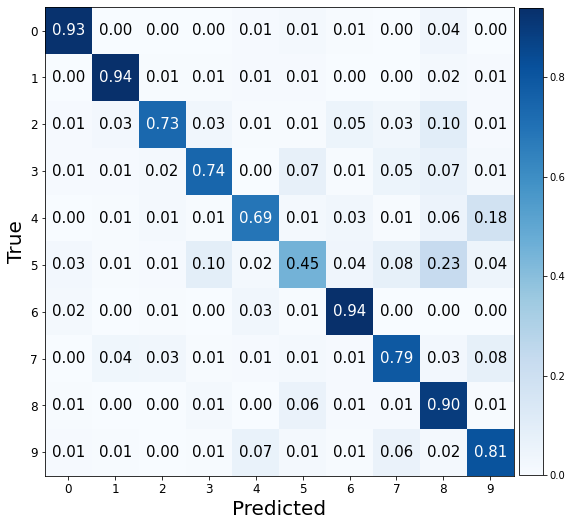

###################

ne: 50, hd:80, wd:0.001, lr: 0.001, bs:256 
Valid Evaluation loss: 0.8082605004310608. f1:0.8748836705006002 acc: 0.875 


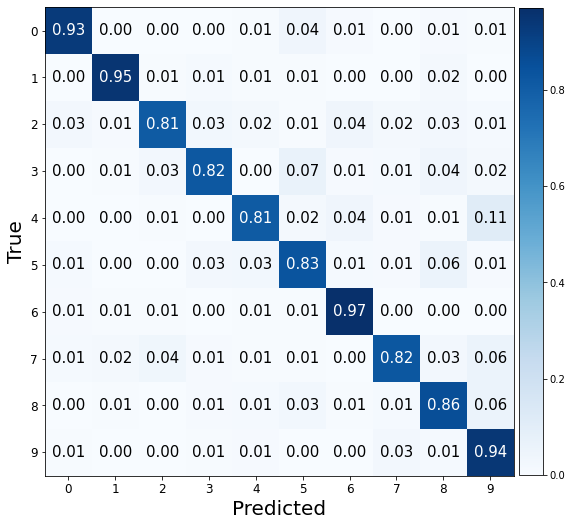

###################

ne: 50, hd:100, wd:0.001, lr: 0.001, bs:256 
Valid Evaluation loss: 0.8037425875663757. f1:0.8656373726774949 acc: 0.8659999966621399 


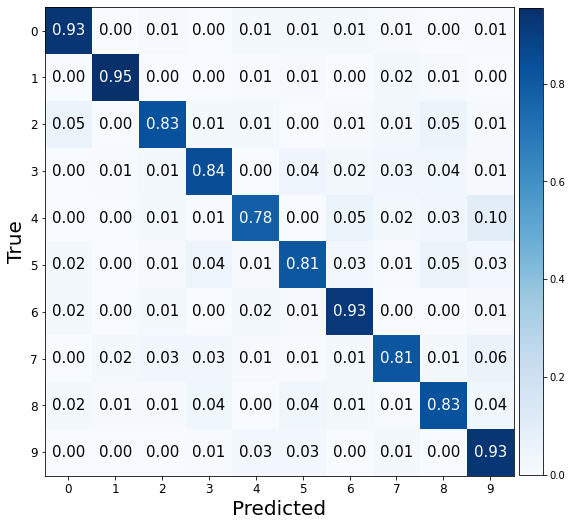

###################

ne: 50, hd:50, wd:0.01, lr: 0.001, bs:256 
Valid Evaluation loss: 0.6473215222358704. f1:0.8527648515837001 acc: 0.8535000085830688 


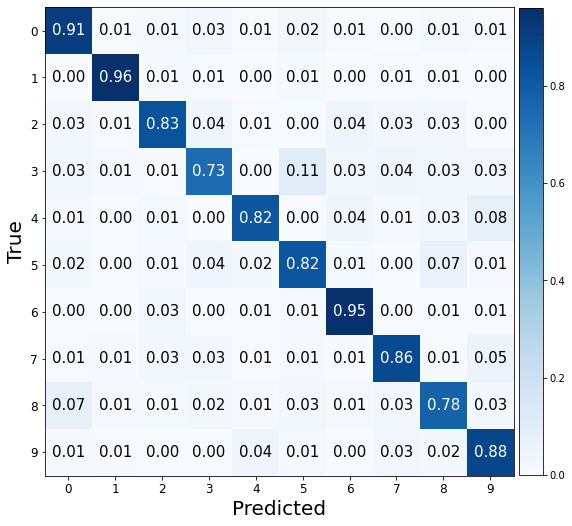

###################

ne: 50, hd:80, wd:0.01, lr: 0.001, bs:256 
Valid Evaluation loss: 0.8954943418502808. f1:0.8612730445335176 acc: 0.8610000014305115 


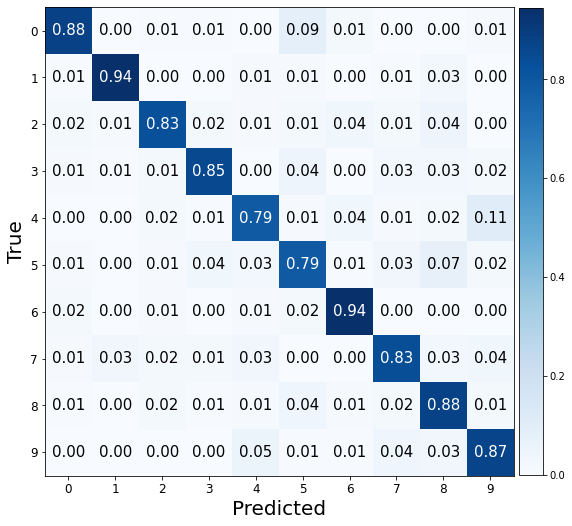

###################

ne: 50, hd:100, wd:0.01, lr: 0.001, bs:256 
Valid Evaluation loss: 0.8290042281150818. f1:0.8587199456065131 acc: 0.8585000038146973 


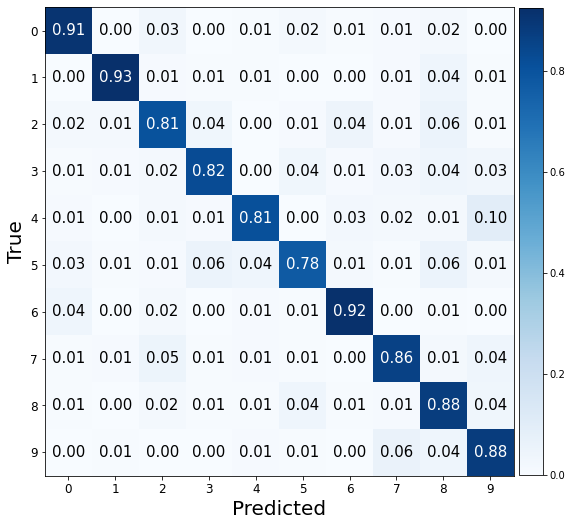

###################

ne: 50, hd:50, wd:0.1, lr: 0.001, bs:256 
Valid Evaluation loss: 0.8533318638801575. f1:0.7861717955359018 acc: 0.7875000238418579 


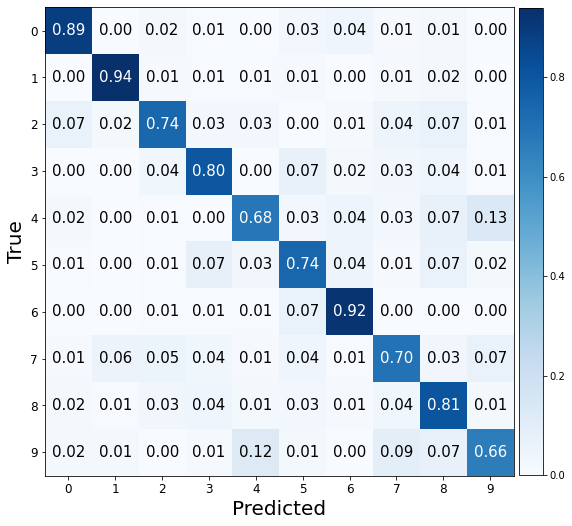

###################

ne: 50, hd:80, wd:0.1, lr: 0.001, bs:256 
Valid Evaluation loss: 0.7844347953796387. f1:0.8774708104110263 acc: 0.8774999976158142 


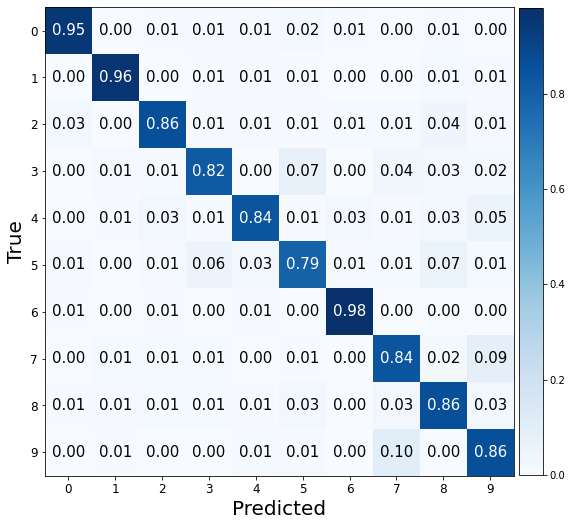

###################

ne: 50, hd:100, wd:0.1, lr: 0.001, bs:256 
Valid Evaluation loss: 0.8721221685409546. f1:0.8749686609312837 acc: 0.8744999766349792 


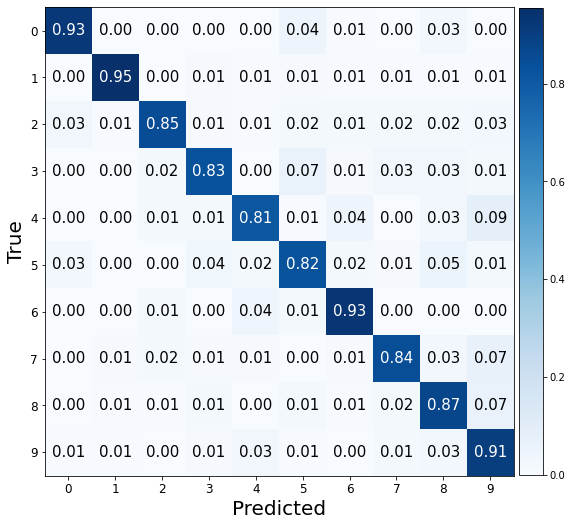

###################

ne: 50, hd:50, wd:0.001, lr: 0.01, bs:256 
Valid Evaluation loss: 1.6486032009124756. f1:0.44982112365787924 acc: 0.45399999618530273 


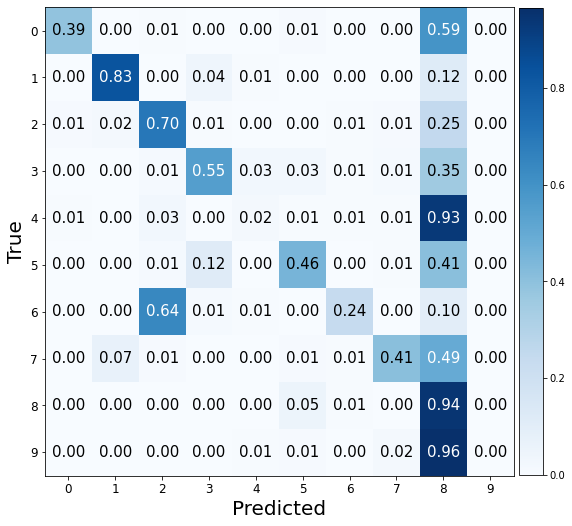

###################

ne: 50, hd:80, wd:0.001, lr: 0.01, bs:256 
Valid Evaluation loss: 1.5181156396865845. f1:0.48567010009766143 acc: 0.5 


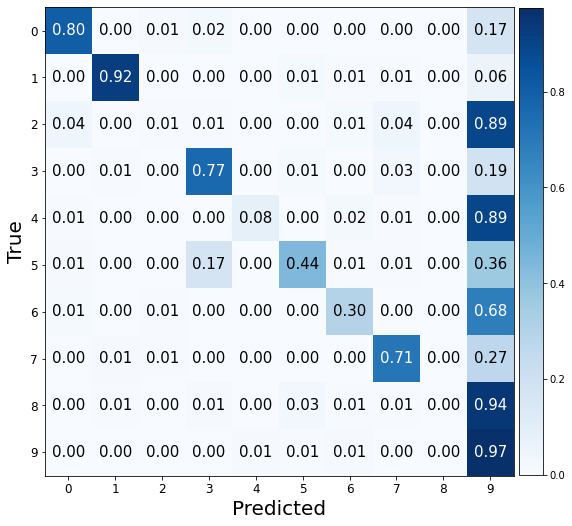

###################

ne: 50, hd:100, wd:0.001, lr: 0.01, bs:256 
Valid Evaluation loss: 1.3638333082199097. f1:0.5321753898342674 acc: 0.5339999794960022 


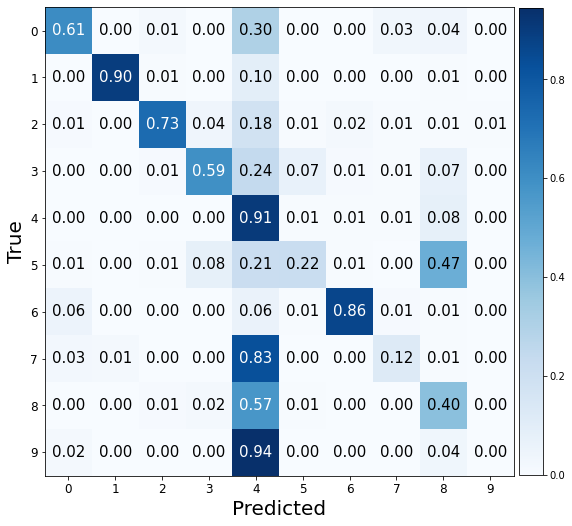

###################

ne: 50, hd:50, wd:0.01, lr: 0.01, bs:256 
Valid Evaluation loss: 1.775559902191162. f1:0.38808594207422054 acc: 0.4059999883174896 


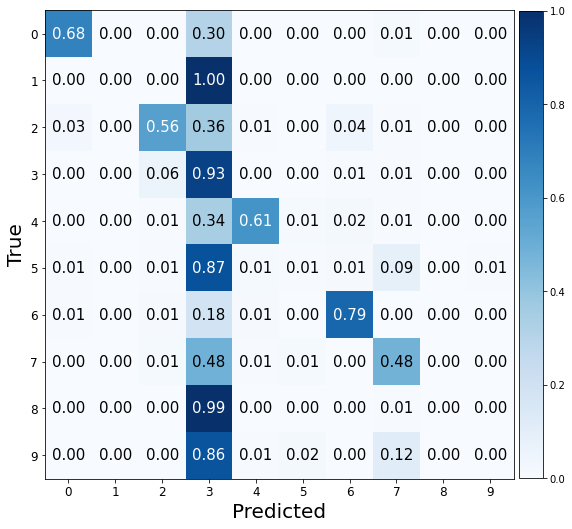

###################

ne: 50, hd:80, wd:0.01, lr: 0.01, bs:256 
Valid Evaluation loss: 1.33040452003479. f1:0.592020880192456 acc: 0.6085000038146973 


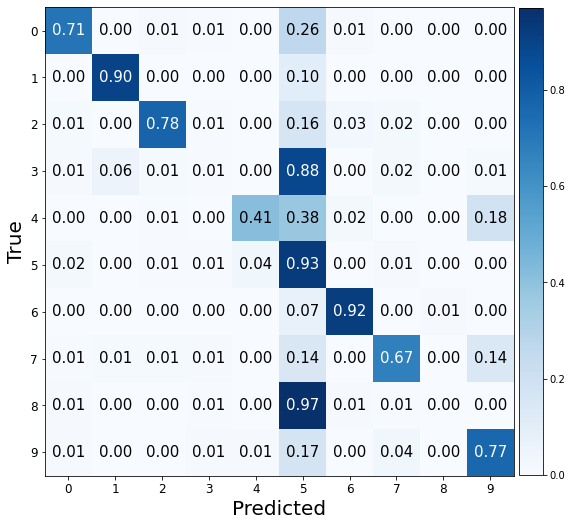

###################

ne: 50, hd:100, wd:0.01, lr: 0.01, bs:256 
Valid Evaluation loss: 1.3532016277313232. f1:0.6742434328537825 acc: 0.6535000205039978 


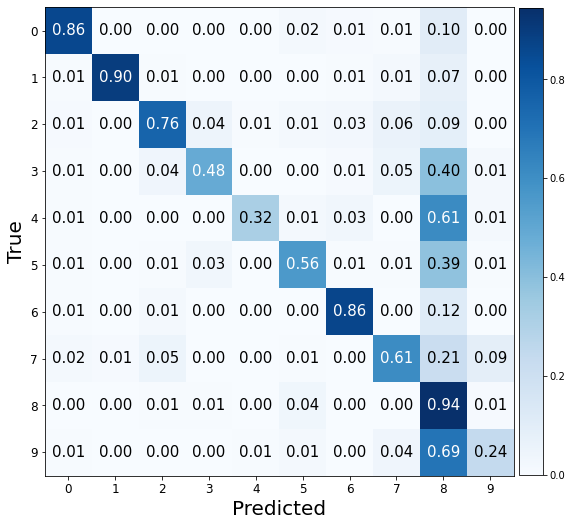

###################

ne: 50, hd:50, wd:0.1, lr: 0.01, bs:256 
Valid Evaluation loss: 1.5950424671173096. f1:0.4658277695386034 acc: 0.4894999861717224 


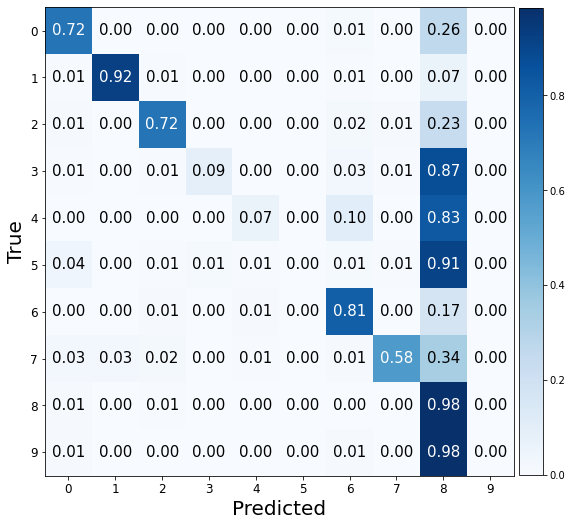

###################

ne: 50, hd:80, wd:0.1, lr: 0.01, bs:256 
Valid Evaluation loss: 1.437913179397583. f1:0.5146296512903337 acc: 0.5205000042915344 


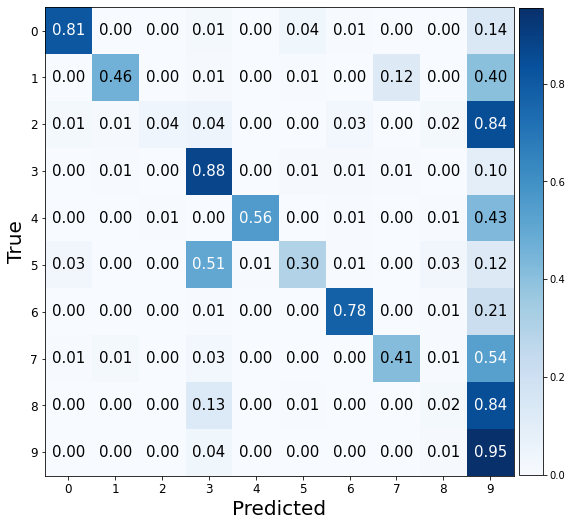

###################

ne: 50, hd:100, wd:0.1, lr: 0.01, bs:256 
Valid Evaluation loss: 0.8690381050109863. f1:0.7579086869133735 acc: 0.746999979019165 


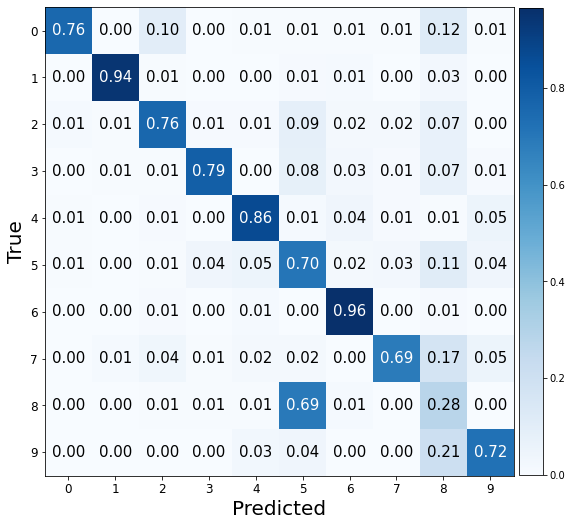

###################

ne: 50, hd:50, wd:0.001, lr: 0.1, bs:256 
Valid Evaluation loss: 2.2249844074249268. f1:0.11115583582677475 acc: 0.16200000047683716 


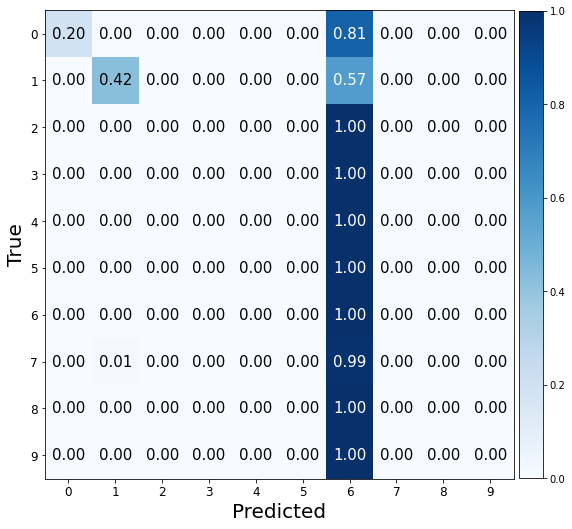

###################

ne: 50, hd:80, wd:0.001, lr: 0.1, bs:256 
Valid Evaluation loss: 2.2027218341827393. f1:0.07649377377668364 acc: 0.14000000059604645 


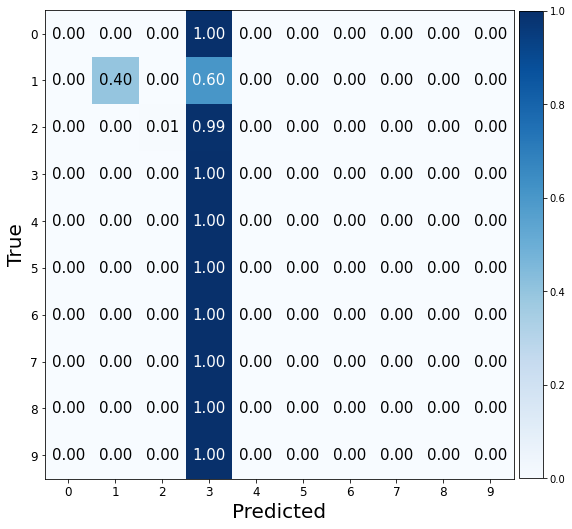

###################

ne: 50, hd:100, wd:0.001, lr: 0.1, bs:256 
Valid Evaluation loss: 3.303795576095581. f1:0.10357549456149981 acc: 0.15549999475479126 


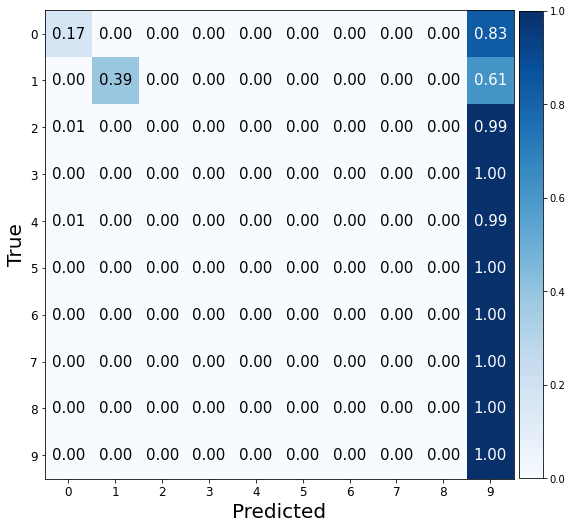

###################

ne: 50, hd:50, wd:0.01, lr: 0.1, bs:256 
Valid Evaluation loss: 2.572275400161743. f1:0.1212903307158669 acc: 0.17000000178813934 


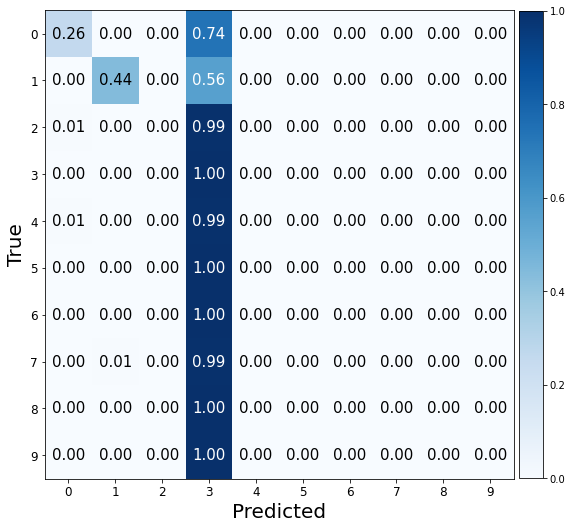

###################

ne: 50, hd:80, wd:0.01, lr: 0.1, bs:256 
Valid Evaluation loss: 2.1889469623565674. f1:0.1013495292746395 acc: 0.148499995470047 


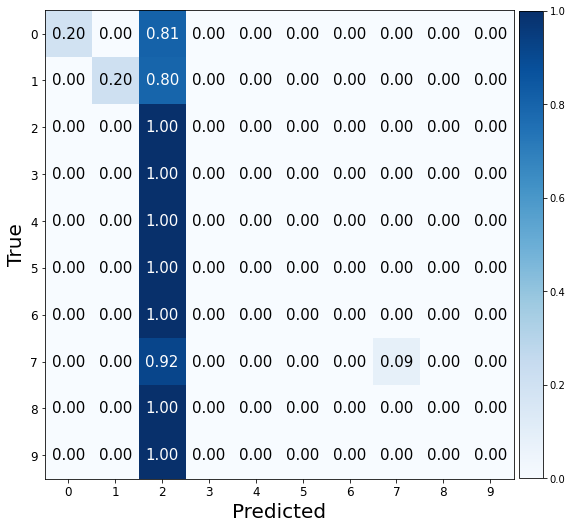

###################

ne: 50, hd:100, wd:0.01, lr: 0.1, bs:256 
Valid Evaluation loss: 2.5214791297912598. f1:0.07199835507425223 acc: 0.13349999487400055 


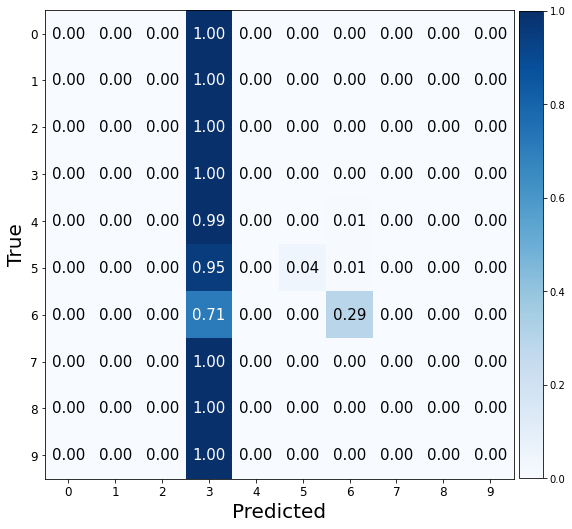

###################

ne: 50, hd:50, wd:0.1, lr: 0.1, bs:256 
Valid Evaluation loss: 2.1930370330810547. f1:0.0941102637284009 acc: 0.15700000524520874 


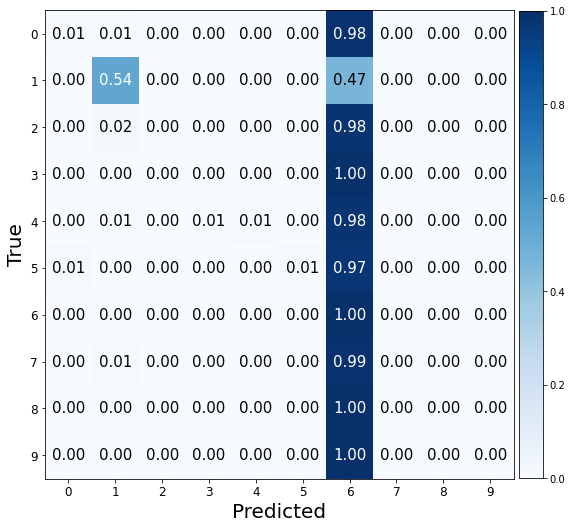

###################

ne: 50, hd:80, wd:0.1, lr: 0.1, bs:256 
Valid Evaluation loss: 2.258068799972534. f1:0.10332397516942575 acc: 0.1589999943971634 


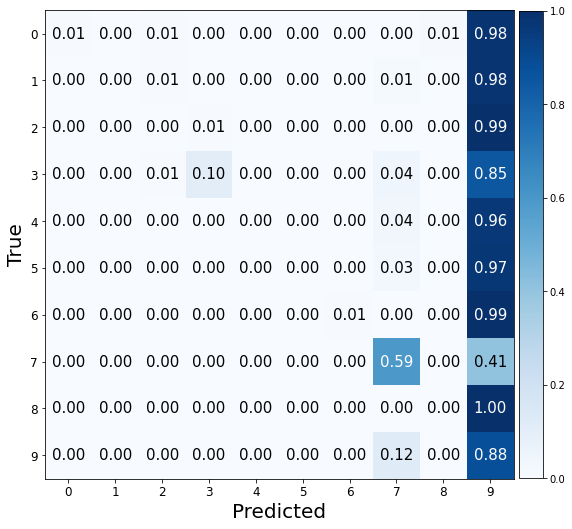

###################

ne: 50, hd:100, wd:0.1, lr: 0.1, bs:256 
Valid Evaluation loss: 2.4461658000946045. f1:0.03152572287577752 acc: 0.10649999976158142 


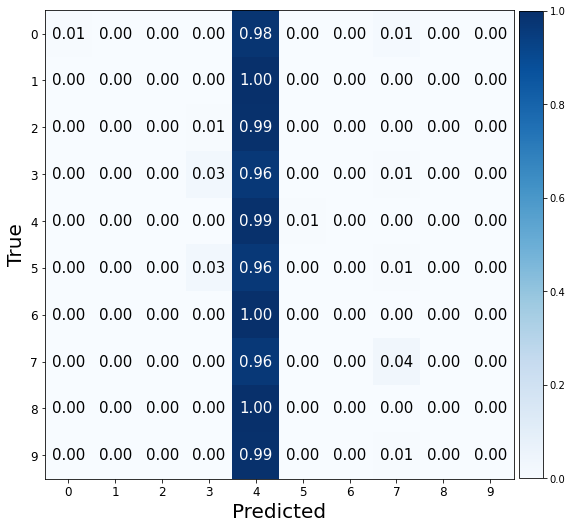

###################

ne: 50, hd:50, wd:0.001, lr: 0.001, bs:512 
Valid Evaluation loss: 0.8275492787361145. f1:0.805807020372573 acc: 0.8069999814033508 


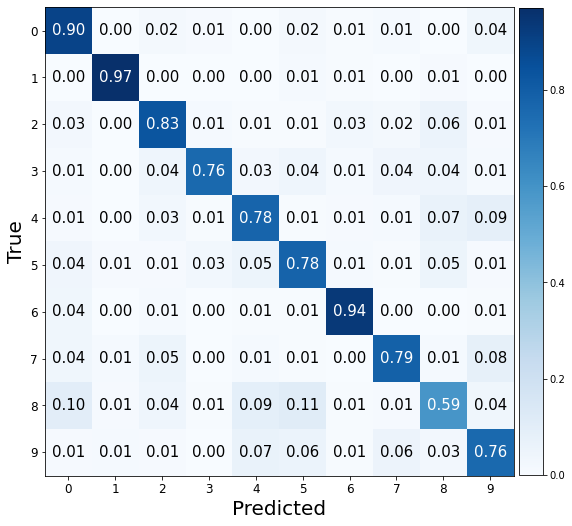

###################

ne: 50, hd:80, wd:0.001, lr: 0.001, bs:512 
Valid Evaluation loss: 0.6642600297927856. f1:0.8687114418584436 acc: 0.8690000176429749 


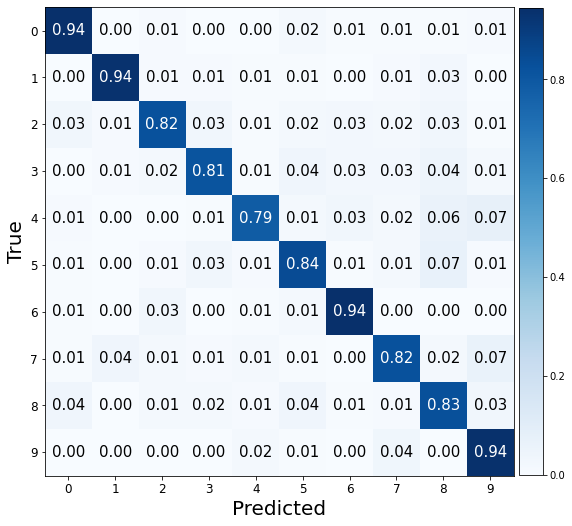

###################

ne: 50, hd:100, wd:0.001, lr: 0.001, bs:512 
Valid Evaluation loss: 0.6949090361595154. f1:0.8670717293655654 acc: 0.8669999837875366 


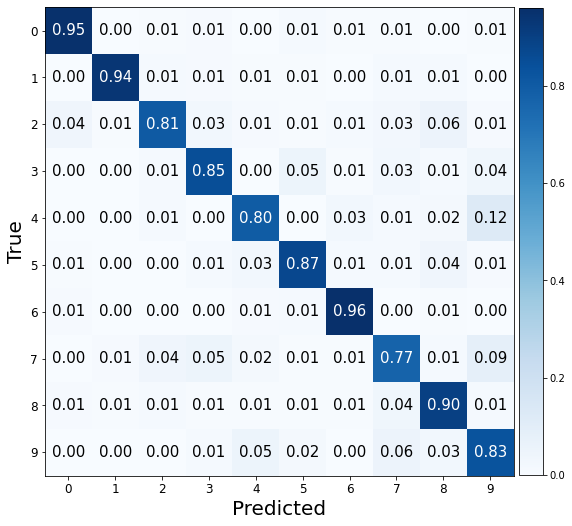

###################

ne: 50, hd:50, wd:0.01, lr: 0.001, bs:512 
Valid Evaluation loss: 1.1367359161376953. f1:0.8105079332634132 acc: 0.8115000128746033 


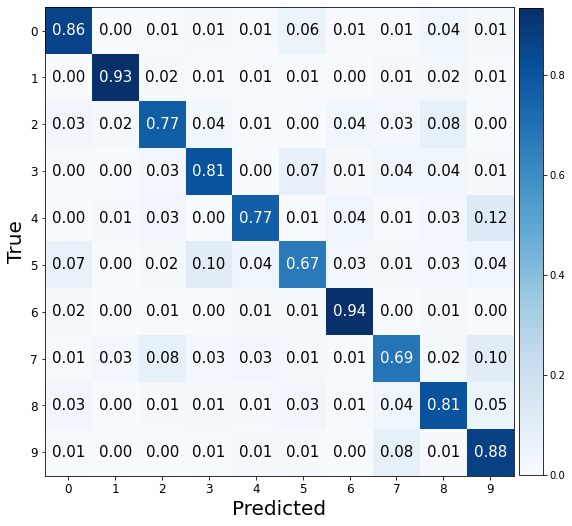

###################

ne: 50, hd:80, wd:0.01, lr: 0.001, bs:512 
Valid Evaluation loss: 0.9533738493919373. f1:0.8528502022063098 acc: 0.8529999852180481 


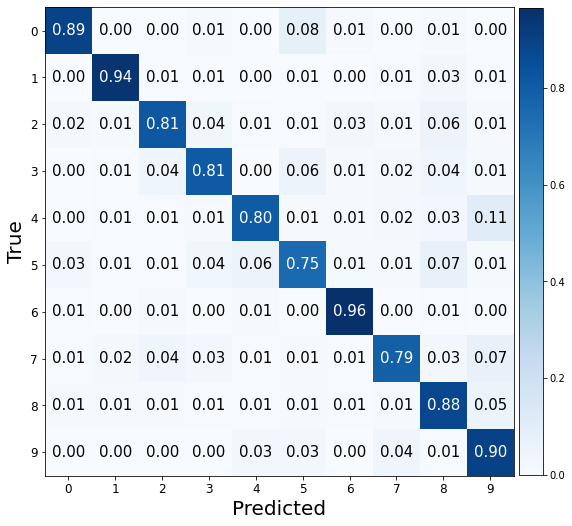

###################

ne: 50, hd:100, wd:0.01, lr: 0.001, bs:512 
Valid Evaluation loss: 0.7108722925186157. f1:0.8740770080714555 acc: 0.8740000128746033 


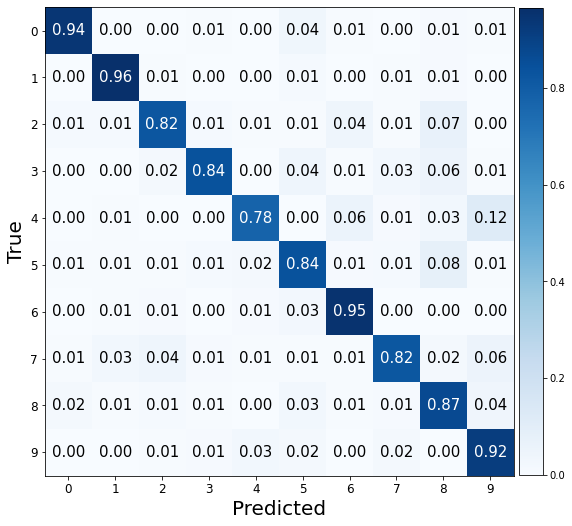

###################

ne: 50, hd:50, wd:0.1, lr: 0.001, bs:512 
Valid Evaluation loss: 0.7763817310333252. f1:0.8255757333564153 acc: 0.8264999985694885 


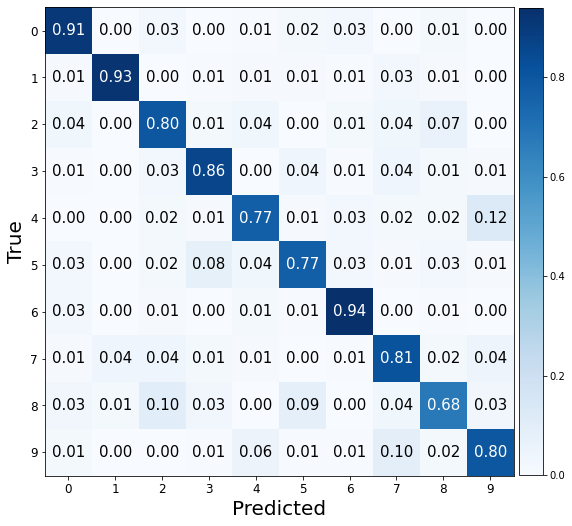

###################

ne: 50, hd:80, wd:0.1, lr: 0.001, bs:512 
Valid Evaluation loss: 0.6948376893997192. f1:0.8698249314147939 acc: 0.8690000176429749 


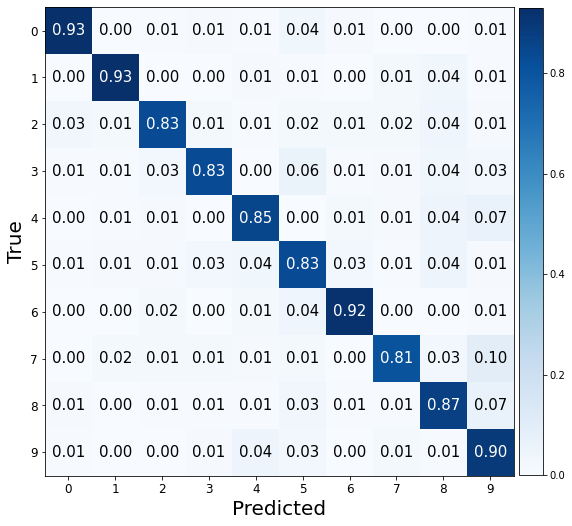

###################

ne: 50, hd:100, wd:0.1, lr: 0.001, bs:512 
Valid Evaluation loss: 0.7921171188354492. f1:0.8575436047934593 acc: 0.8575000166893005 


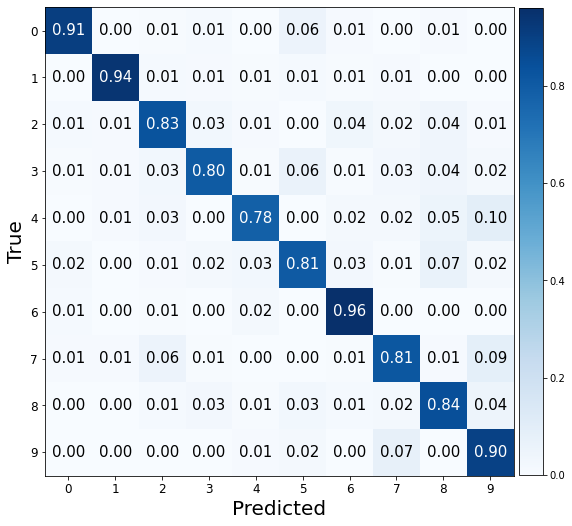

###################

ne: 50, hd:50, wd:0.001, lr: 0.01, bs:512 
Valid Evaluation loss: 1.8183633089065552. f1:0.3410207003040307 acc: 0.382999986410141 


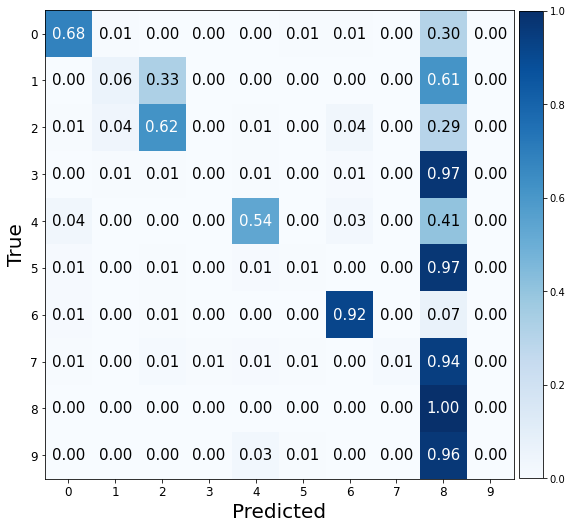

###################

ne: 50, hd:80, wd:0.001, lr: 0.01, bs:512 
Valid Evaluation loss: 1.9456676244735718. f1:0.2640253128856819 acc: 0.3009999990463257 


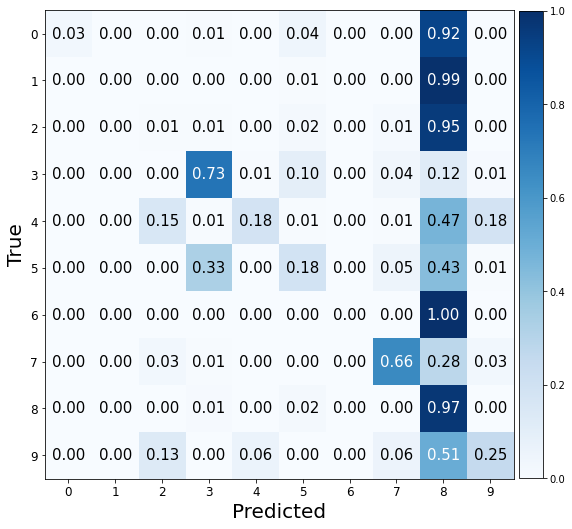

###################

ne: 50, hd:100, wd:0.001, lr: 0.01, bs:512 
Valid Evaluation loss: 1.6387773752212524. f1:0.5169970799260033 acc: 0.534500002861023 


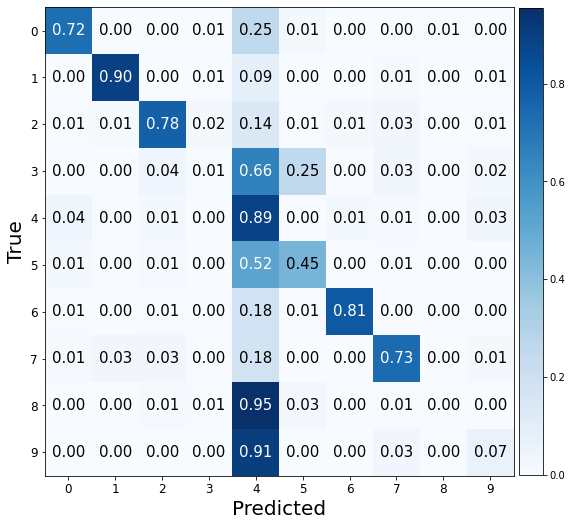

###################

ne: 50, hd:50, wd:0.01, lr: 0.01, bs:512 
Valid Evaluation loss: 1.5525869131088257. f1:0.5639640205922136 acc: 0.5799999833106995 


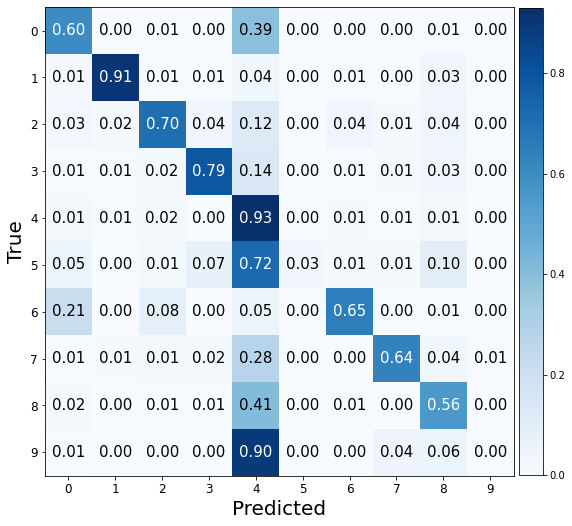

###################

ne: 50, hd:80, wd:0.01, lr: 0.01, bs:512 
Valid Evaluation loss: 1.6554166078567505. f1:0.4959628644674082 acc: 0.5044999718666077 


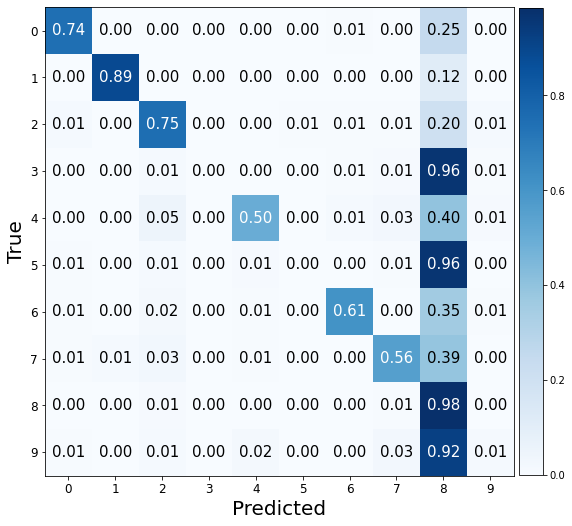

###################

ne: 50, hd:100, wd:0.01, lr: 0.01, bs:512 
Valid Evaluation loss: 1.344242811203003. f1:0.6839262296867735 acc: 0.6990000009536743 


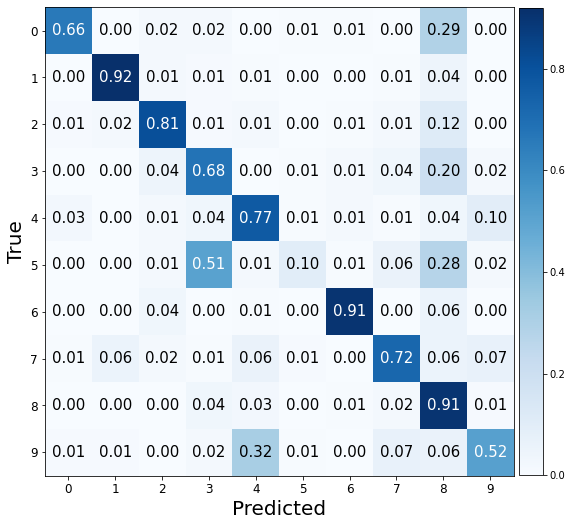

###################

ne: 50, hd:50, wd:0.1, lr: 0.01, bs:512 
Valid Evaluation loss: 1.6864467859268188. f1:0.4330211714575537 acc: 0.4645000100135803 


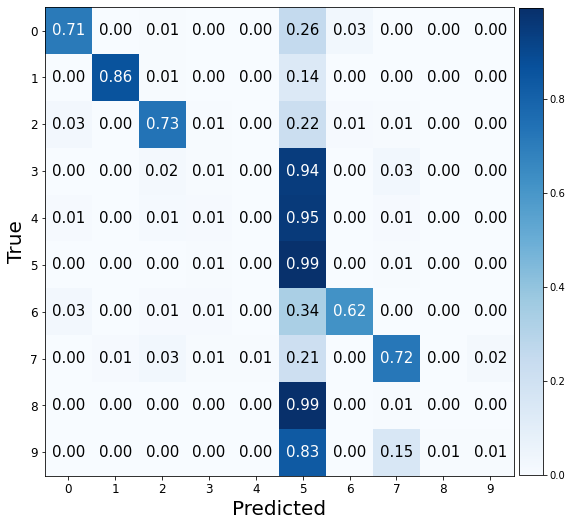

###################

ne: 50, hd:80, wd:0.1, lr: 0.01, bs:512 
Valid Evaluation loss: 1.9429068565368652. f1:0.2422718229925885 acc: 0.2955000102519989 


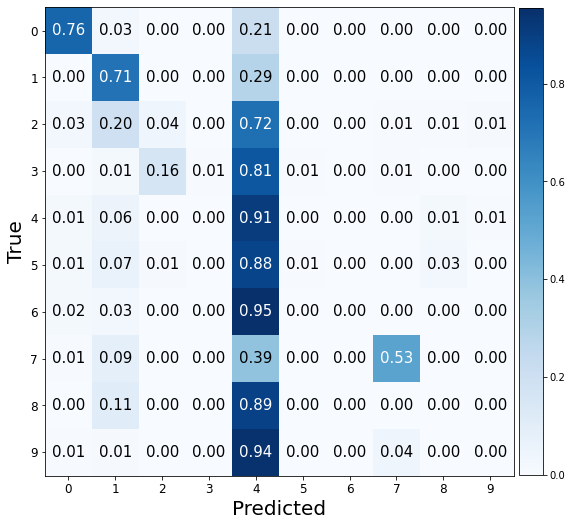

###################

ne: 50, hd:100, wd:0.1, lr: 0.01, bs:512 
Valid Evaluation loss: 1.5441420078277588. f1:0.44443216247264133 acc: 0.46000000834465027 


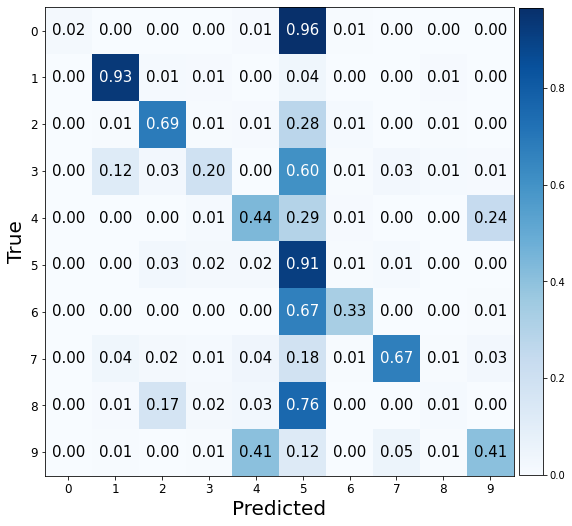

###################

ne: 50, hd:50, wd:0.001, lr: 0.1, bs:512 
Valid Evaluation loss: 2.4355297088623047. f1:0.08884496138994938 acc: 0.1509999930858612 


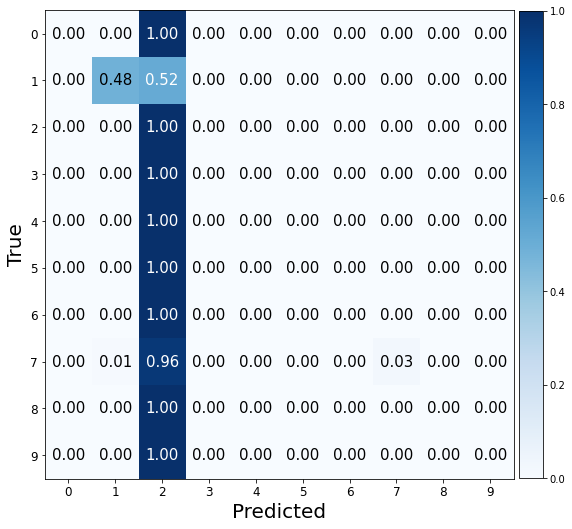

###################

ne: 50, hd:80, wd:0.001, lr: 0.1, bs:512 
Valid Evaluation loss: 2.525134325027466. f1:0.14202714868181776 acc: 0.19349999725818634 


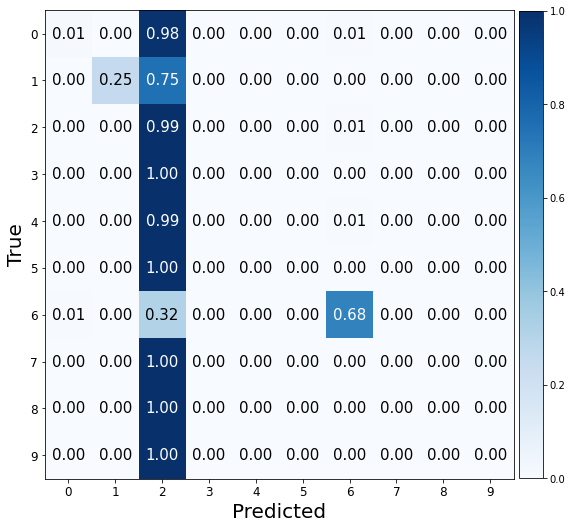

###################

ne: 50, hd:100, wd:0.001, lr: 0.1, bs:512 
Valid Evaluation loss: 6.0690178871154785. f1:0.08679202956408635 acc: 0.14900000393390656 


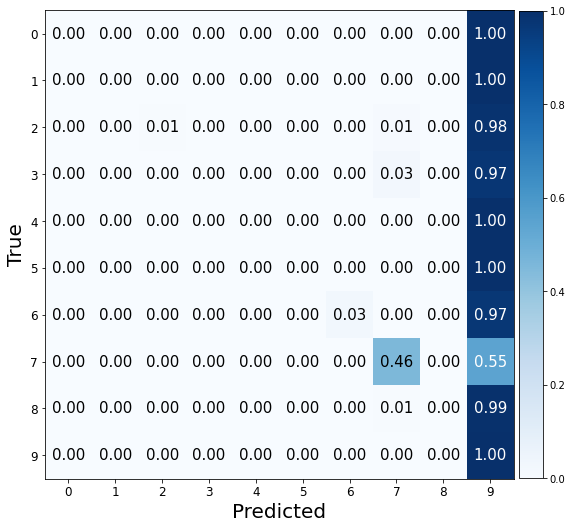

###################

ne: 50, hd:50, wd:0.01, lr: 0.1, bs:512 
Valid Evaluation loss: 2.3018362522125244. f1:0.019185111278532306 acc: 0.10050000250339508 


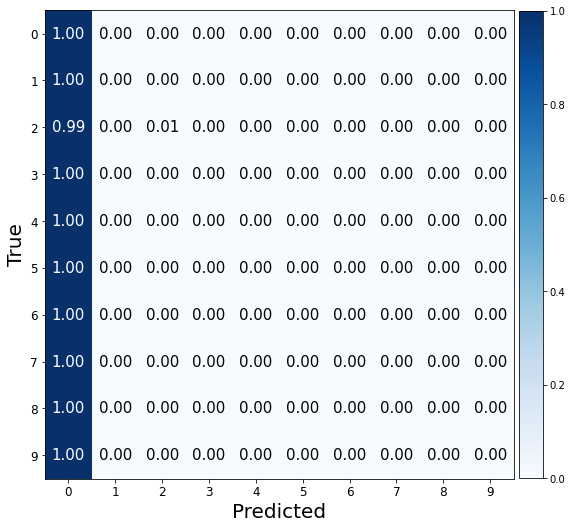

###################

ne: 50, hd:80, wd:0.01, lr: 0.1, bs:512 
Valid Evaluation loss: 3.25504732131958. f1:0.10838624013148375 acc: 0.1679999977350235 


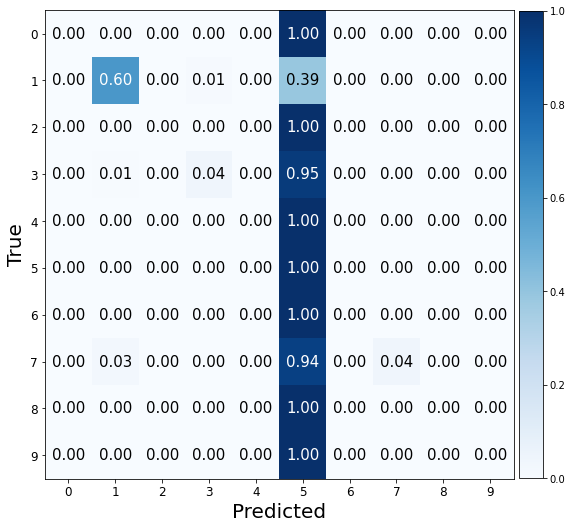

###################

ne: 50, hd:100, wd:0.01, lr: 0.1, bs:512 
Valid Evaluation loss: 2.5404269695281982. f1:0.09803976289939505 acc: 0.1655000001192093 


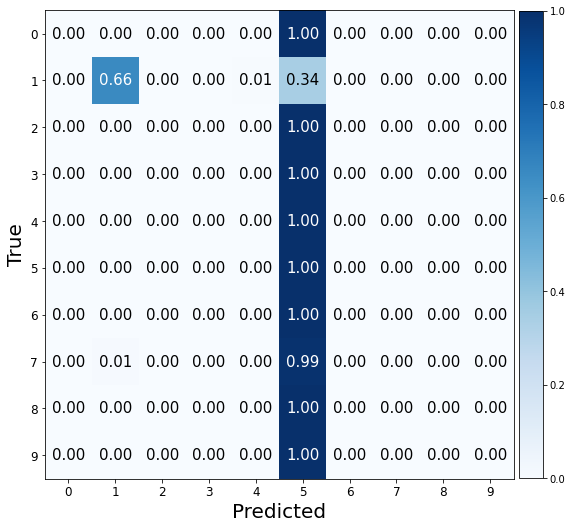

###################

ne: 50, hd:50, wd:0.1, lr: 0.1, bs:512 
Valid Evaluation loss: 2.3324882984161377. f1:0.018057455540355677 acc: 0.0989999994635582 


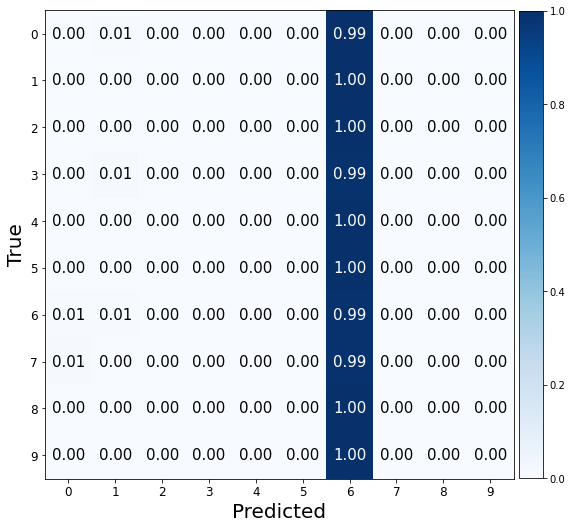

###################

ne: 50, hd:80, wd:0.1, lr: 0.1, bs:512 
Valid Evaluation loss: 2.5166854858398438. f1:0.07158470034879856 acc: 0.13099999725818634 


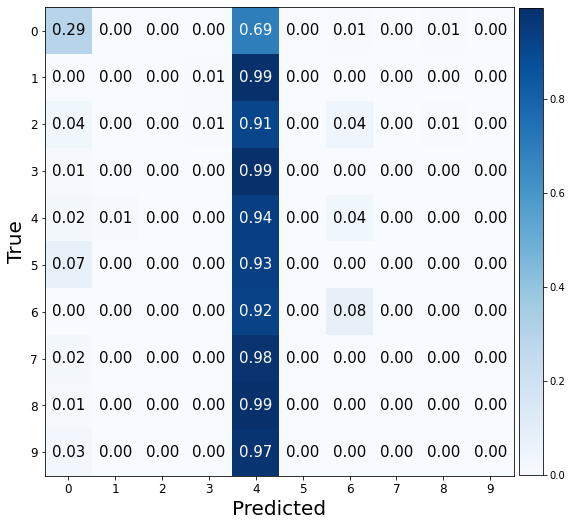

###################

ne: 50, hd:100, wd:0.1, lr: 0.1, bs:512 
Valid Evaluation loss: 2.5294740200042725. f1:0.13873091803630438 acc: 0.22200000286102295 


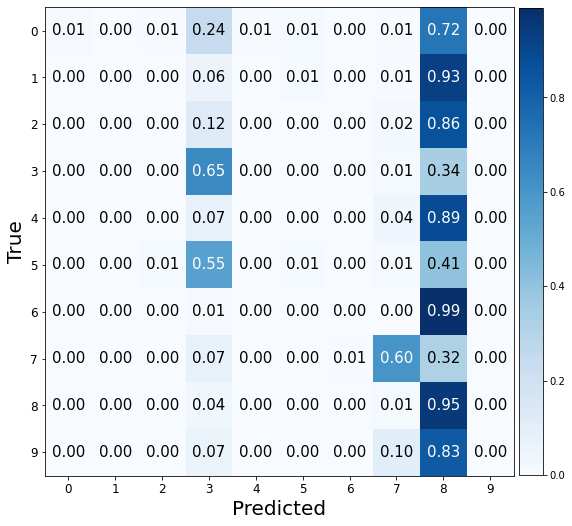

###################

ne: 50, hd:50, wd:0.001, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.8244238495826721. f1:0.8138468662891187 acc: 0.8140000104904175 


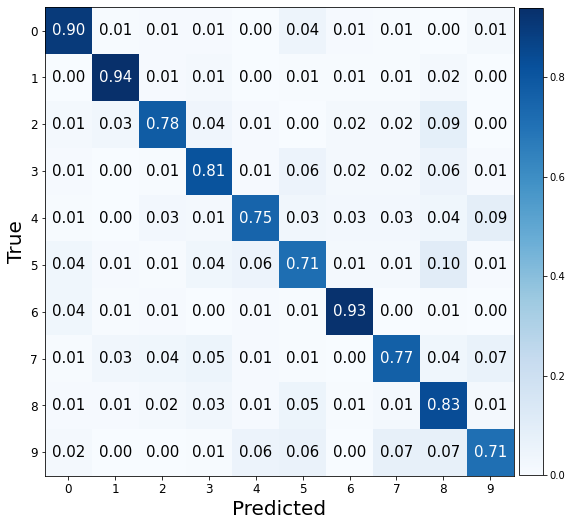

###################

ne: 50, hd:80, wd:0.001, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.8368829488754272. f1:0.8558452977293589 acc: 0.8560000061988831 


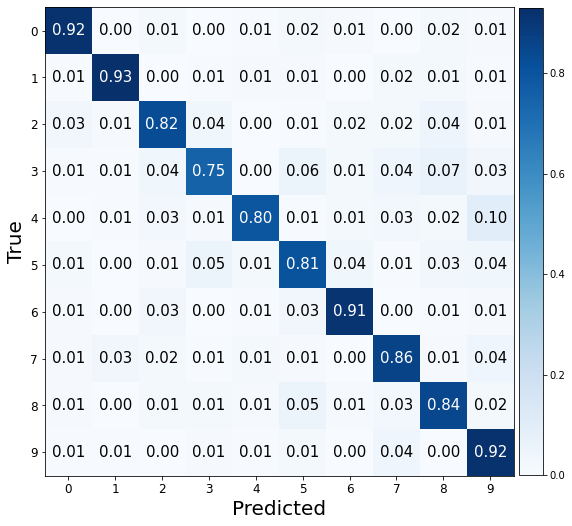

###################

ne: 50, hd:100, wd:0.001, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.7104665637016296. f1:0.8665036244340539 acc: 0.8665000200271606 


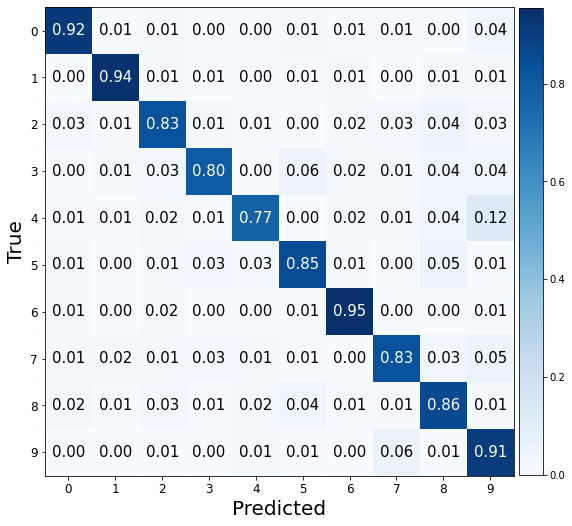

###################

ne: 50, hd:50, wd:0.01, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.9857490658760071. f1:0.7850754630107925 acc: 0.7860000133514404 


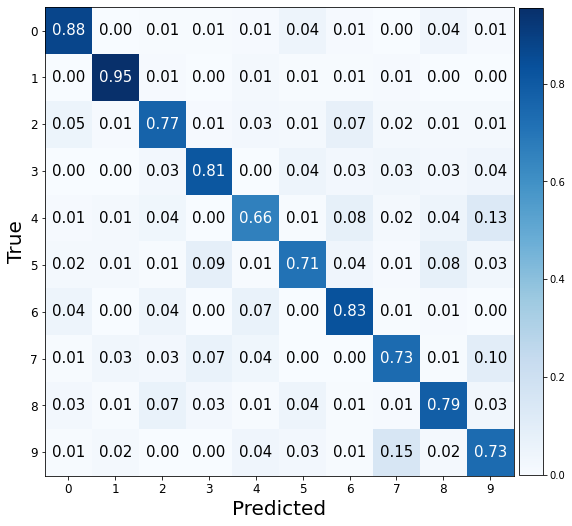

###################

ne: 50, hd:80, wd:0.01, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.9507911801338196. f1:0.8632535717510222 acc: 0.8629999756813049 


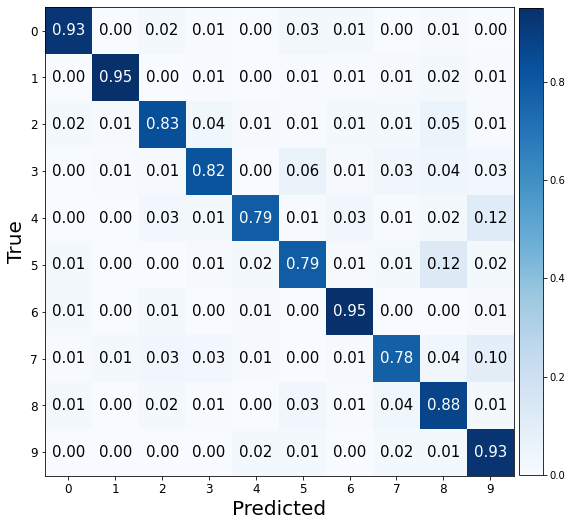

###################

ne: 50, hd:100, wd:0.01, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.818793773651123. f1:0.8743079267726624 acc: 0.8744999766349792 


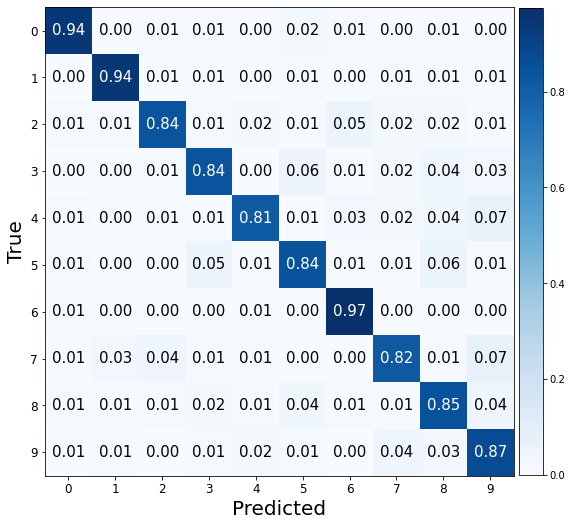

###################

ne: 50, hd:50, wd:0.1, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.7682596445083618. f1:0.823534202549433 acc: 0.8230000138282776 


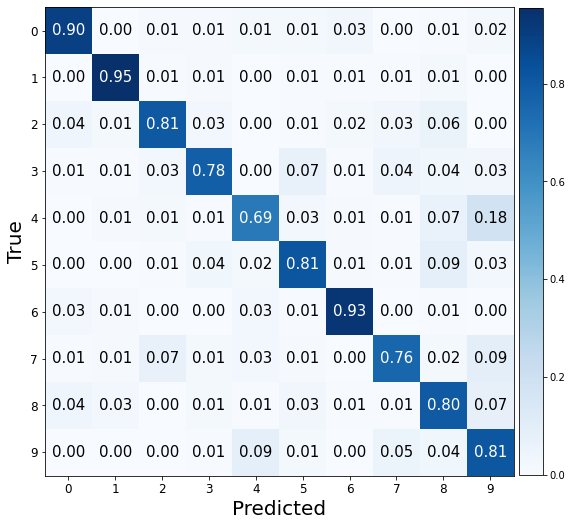

###################

ne: 50, hd:80, wd:0.1, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.7477847337722778. f1:0.875723669765397 acc: 0.8759999871253967 


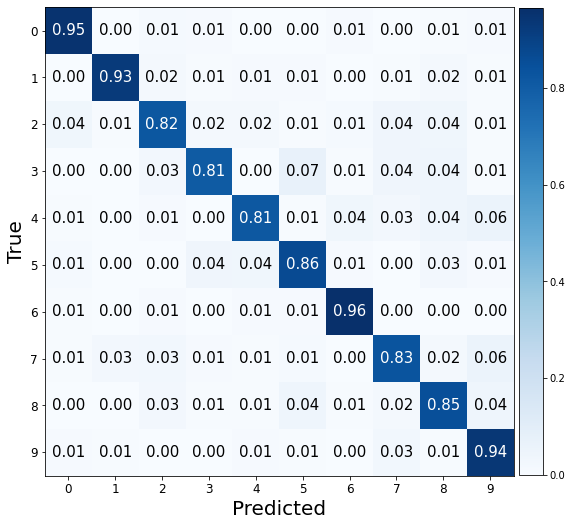

###################

ne: 50, hd:100, wd:0.1, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.8274211287498474. f1:0.8857250515770939 acc: 0.8855000138282776 


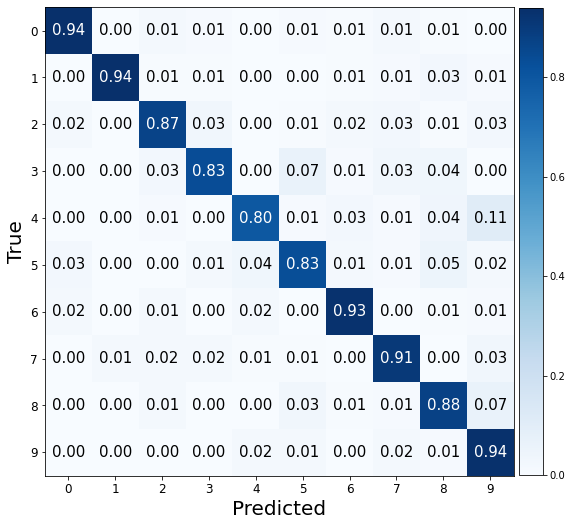

###################

ne: 50, hd:50, wd:0.001, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.7667319774627686. f1:0.4007189879649558 acc: 0.4189999997615814 


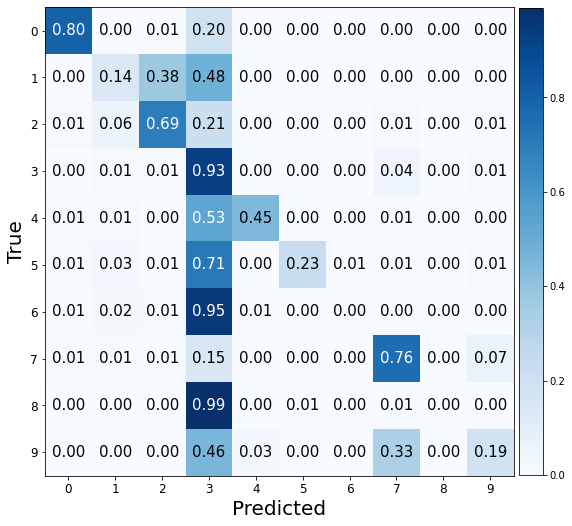

###################

ne: 50, hd:80, wd:0.001, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.3911076784133911. f1:0.6153342000957636 acc: 0.6100000143051147 


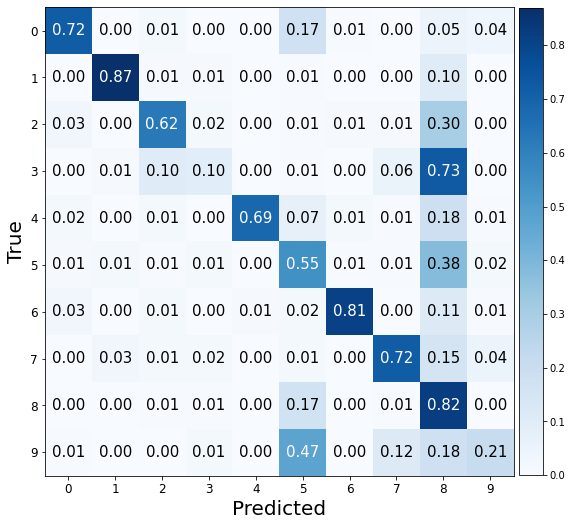

###################

ne: 50, hd:100, wd:0.001, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.1306792497634888. f1:0.7293158516405226 acc: 0.718999981880188 


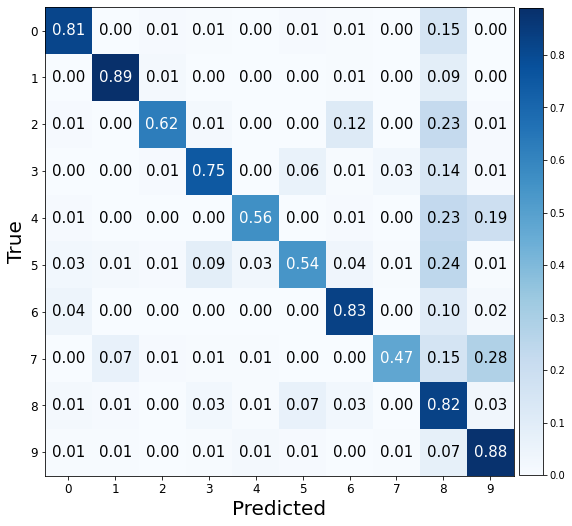

###################

ne: 50, hd:50, wd:0.01, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.433109998703003. f1:0.5356135460728544 acc: 0.5329999923706055 


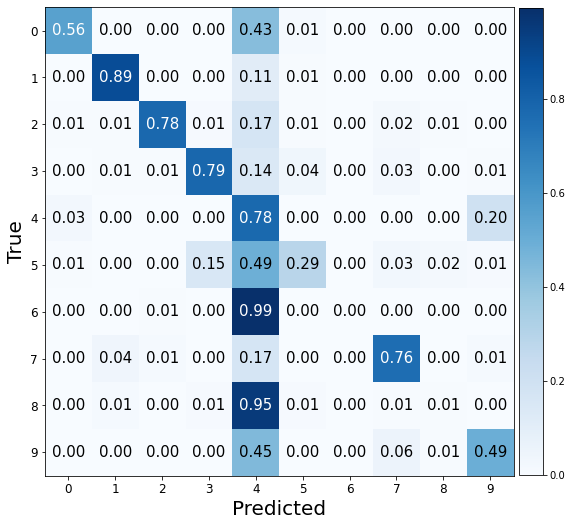

###################

ne: 50, hd:80, wd:0.01, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.6543551683425903. f1:0.4579386468072778 acc: 0.4884999990463257 


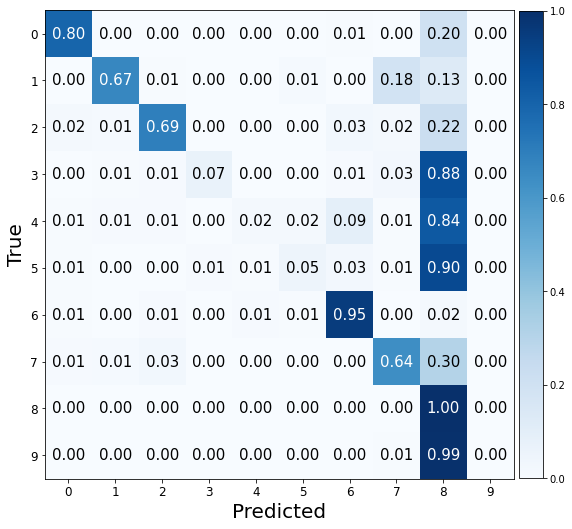

###################

ne: 50, hd:100, wd:0.01, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.244782567024231. f1:0.6835522625481926 acc: 0.6685000061988831 


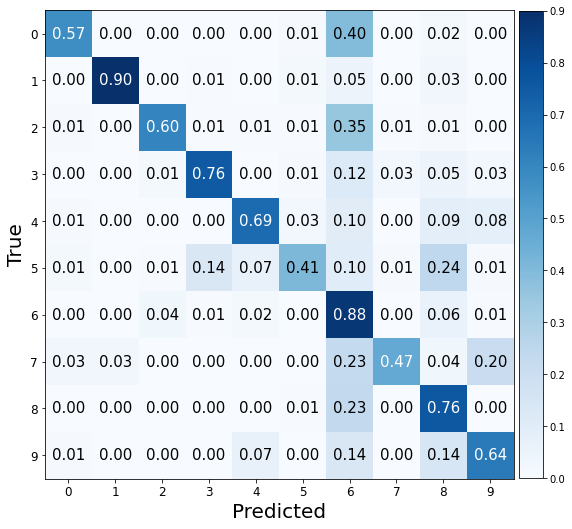

###################

ne: 50, hd:50, wd:0.1, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.6394166946411133. f1:0.4359382010664465 acc: 0.44699999690055847 


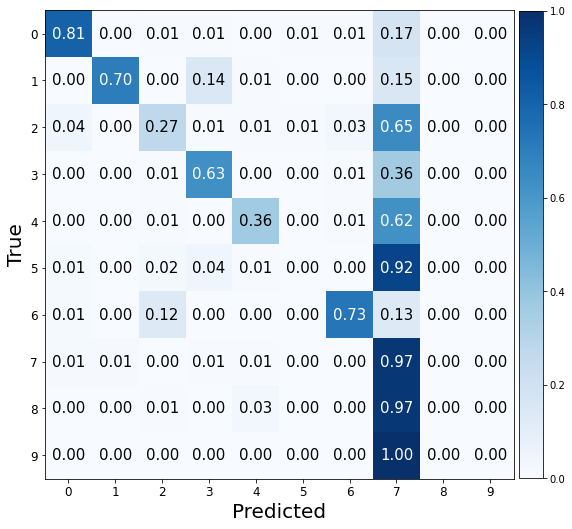

###################

ne: 50, hd:80, wd:0.1, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.4882850646972656. f1:0.5322733557741199 acc: 0.5525000095367432 


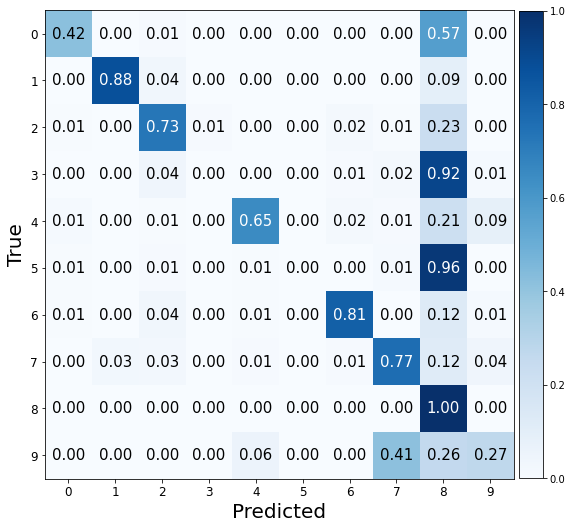

###################

ne: 50, hd:100, wd:0.1, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.2980366945266724. f1:0.6311715165477464 acc: 0.6265000104904175 


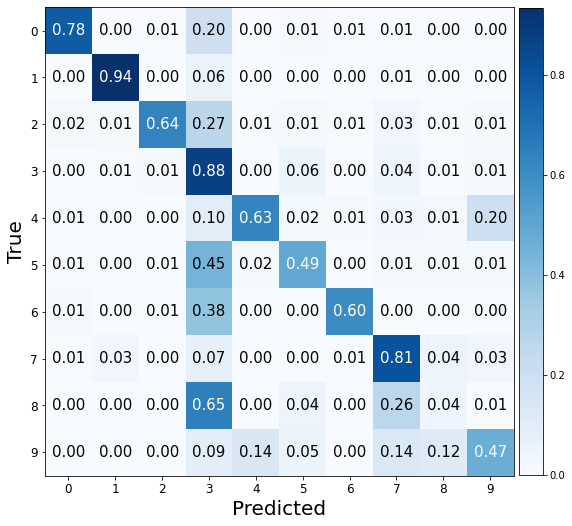

###################

ne: 50, hd:50, wd:0.001, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.3955423831939697. f1:0.024131866058372024 acc: 0.10300000011920929 


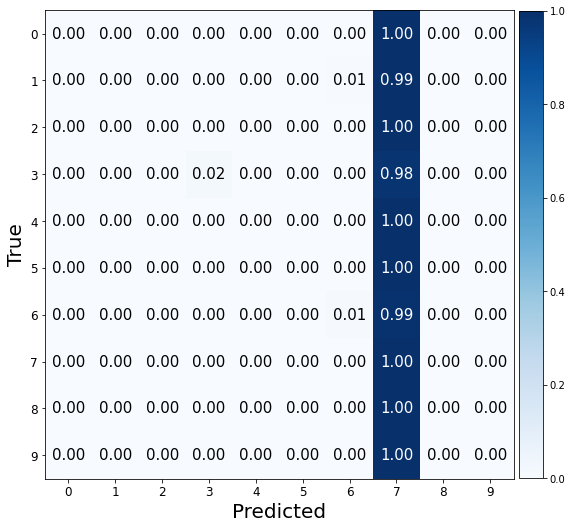

###################

ne: 50, hd:80, wd:0.001, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.403799057006836. f1:0.10505311336770302 acc: 0.1574999988079071 


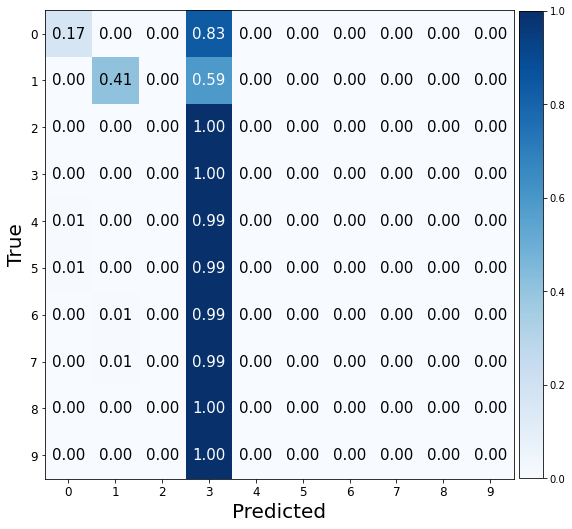

###################

ne: 50, hd:100, wd:0.001, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.414825916290283. f1:0.11983664241399676 acc: 0.16599999368190765 


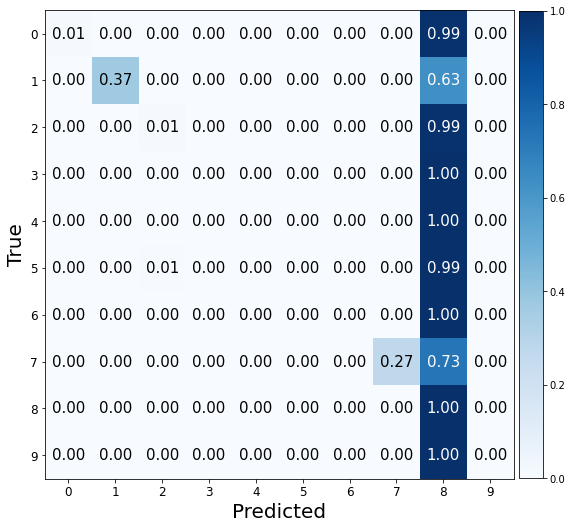

###################

ne: 50, hd:50, wd:0.01, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.2843925952911377. f1:0.033163438668025826 acc: 0.1080000028014183 


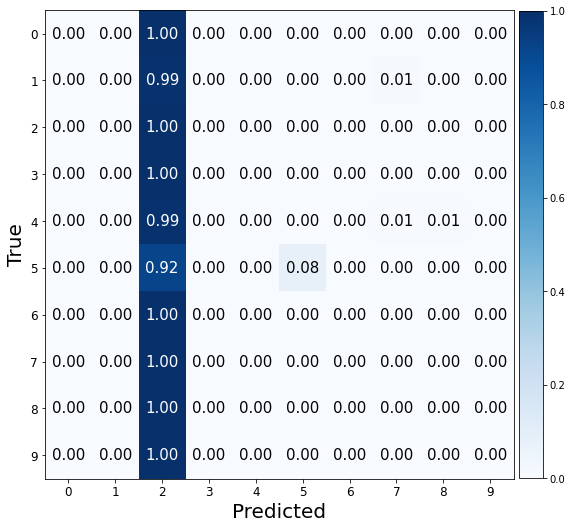

###################

ne: 50, hd:80, wd:0.01, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.270393133163452. f1:0.04379546759033399 acc: 0.11400000005960464 


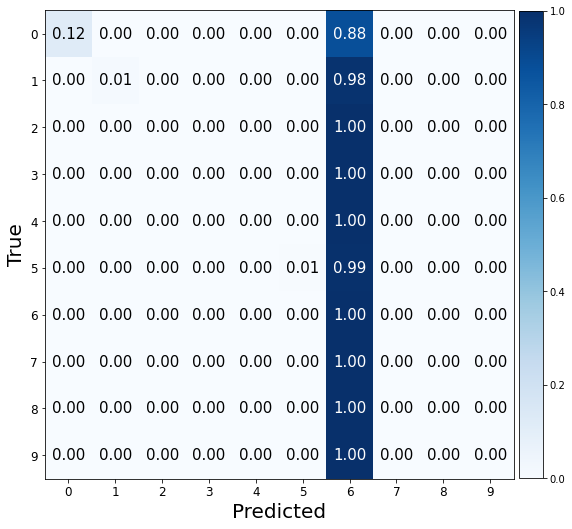

###################

ne: 50, hd:100, wd:0.01, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.5458450317382812. f1:0.13560298815414218 acc: 0.1835000067949295 


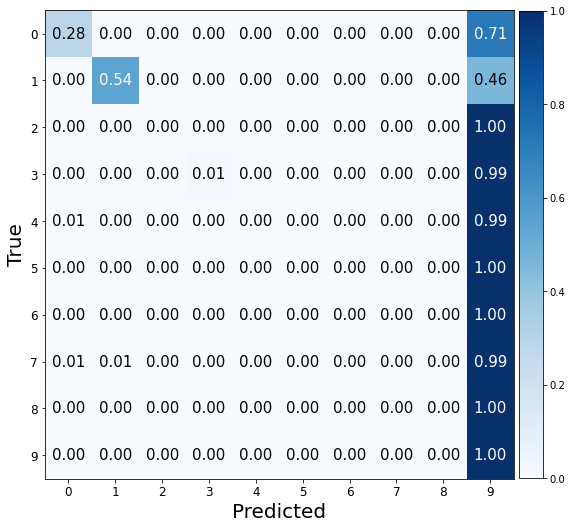

###################

ne: 50, hd:50, wd:0.1, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.4989514350891113. f1:0.1264591690444063 acc: 0.17100000381469727 


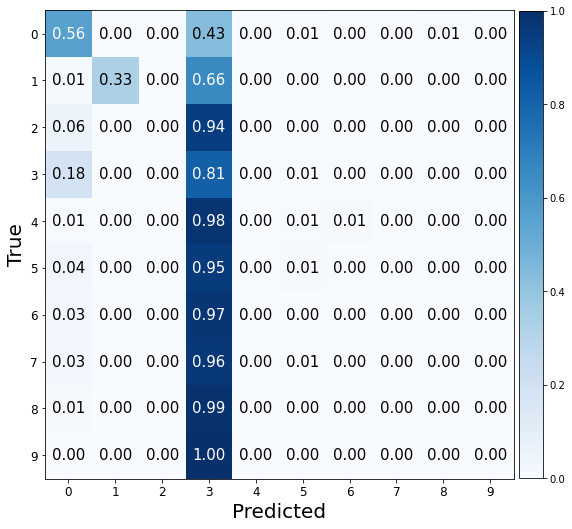

###################

ne: 50, hd:80, wd:0.1, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.3040876388549805. f1:0.22117507456020516 acc: 0.2460000067949295 


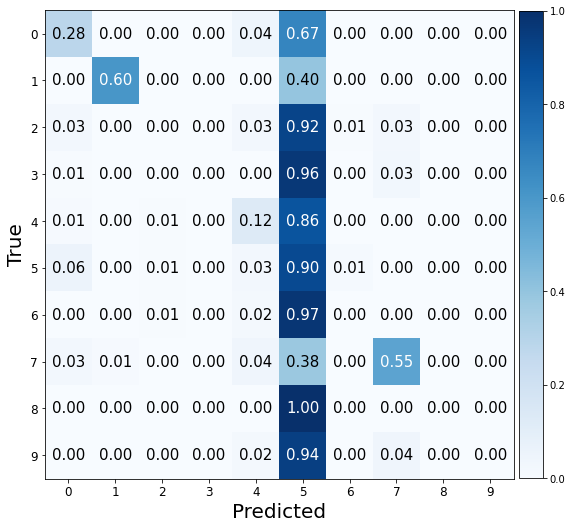

###################

ne: 50, hd:100, wd:0.1, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.15263032913208. f1:0.17578003305790352 acc: 0.2395000010728836 


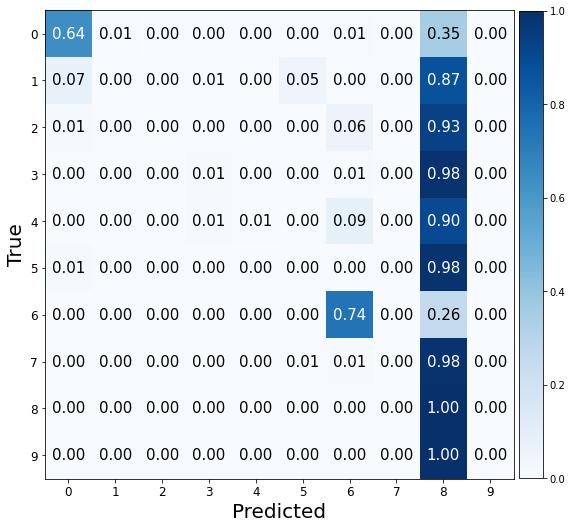

###################

ne: 100, hd:50, wd:0.001, lr: 0.001, bs:256 
Valid Evaluation loss: 0.6736077666282654. f1:0.84766921699992 acc: 0.8479999899864197 


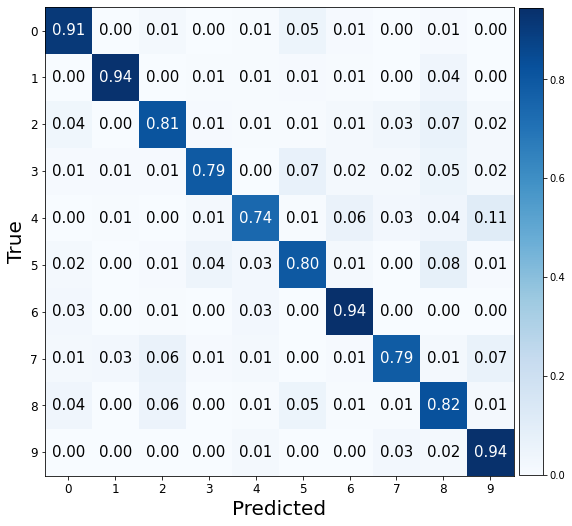

###################

ne: 100, hd:80, wd:0.001, lr: 0.001, bs:256 
Valid Evaluation loss: 0.7273275852203369. f1:0.8766713488490827 acc: 0.8769999742507935 


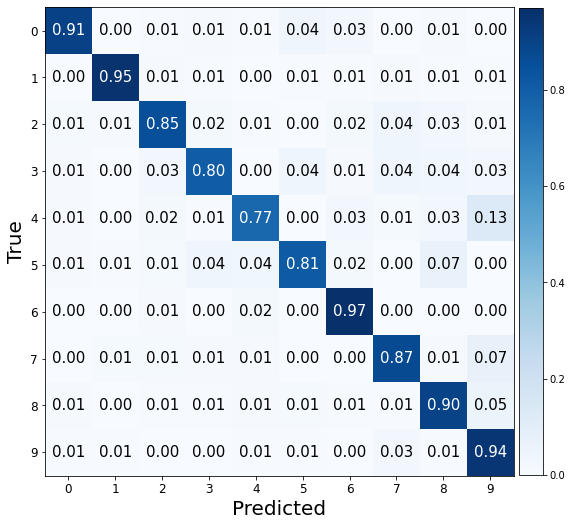

###################

ne: 100, hd:100, wd:0.001, lr: 0.001, bs:256 
Valid Evaluation loss: 0.6663308143615723. f1:0.8875110966117491 acc: 0.887499988079071 


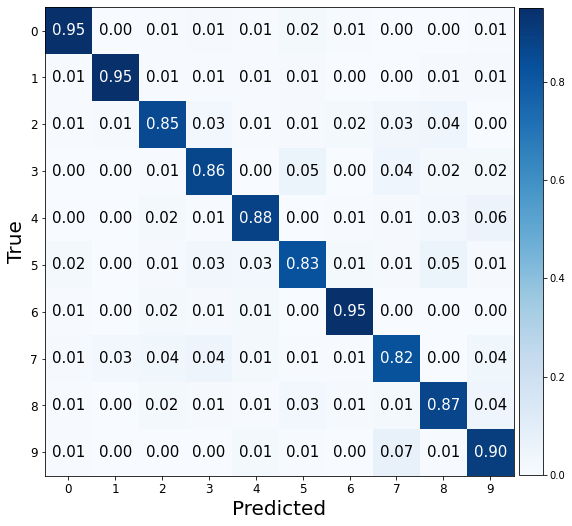

###################

ne: 100, hd:50, wd:0.01, lr: 0.001, bs:256 
Valid Evaluation loss: 0.8237443566322327. f1:0.8245935862418221 acc: 0.8255000114440918 


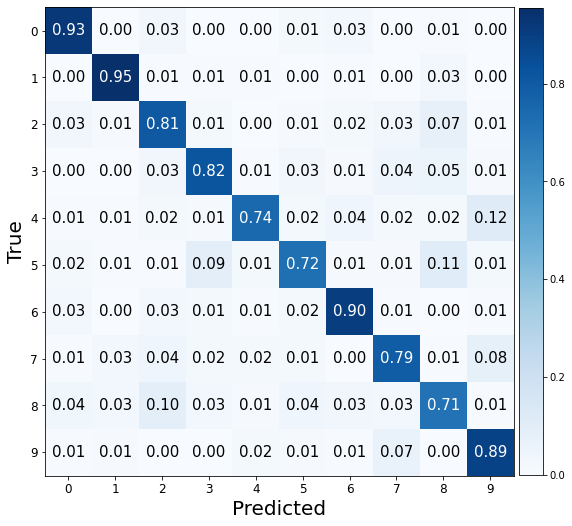

###################

ne: 100, hd:80, wd:0.01, lr: 0.001, bs:256 
Valid Evaluation loss: 0.6320721507072449. f1:0.8776431565827565 acc: 0.878000020980835 


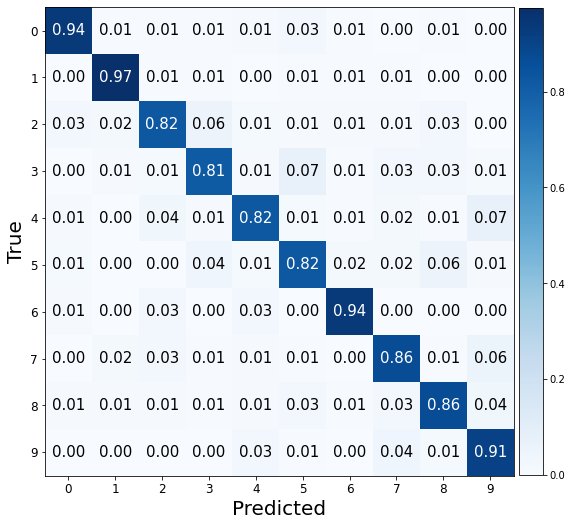

###################

ne: 100, hd:100, wd:0.01, lr: 0.001, bs:256 
Valid Evaluation loss: 0.6388037800788879. f1:0.8939987393583472 acc: 0.8939999938011169 


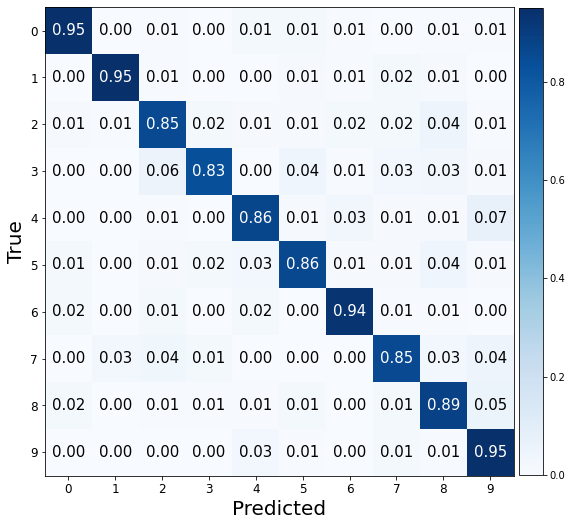

###################

ne: 100, hd:50, wd:0.1, lr: 0.001, bs:256 
Valid Evaluation loss: 0.758406400680542. f1:0.8261815600996607 acc: 0.8264999985694885 


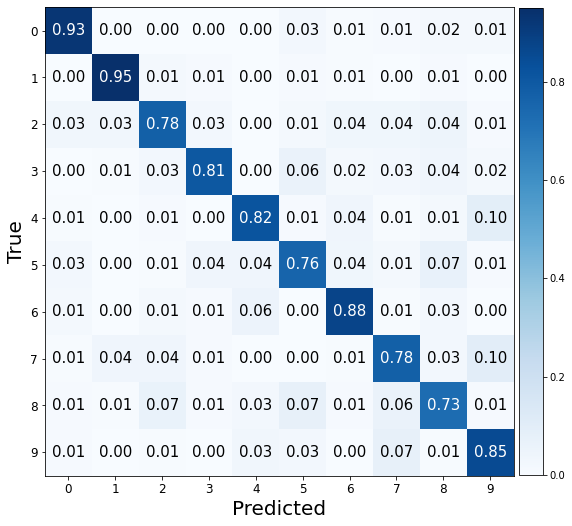

###################

ne: 100, hd:80, wd:0.1, lr: 0.001, bs:256 
Valid Evaluation loss: 0.7445921897888184. f1:0.8600739891569003 acc: 0.8604999780654907 


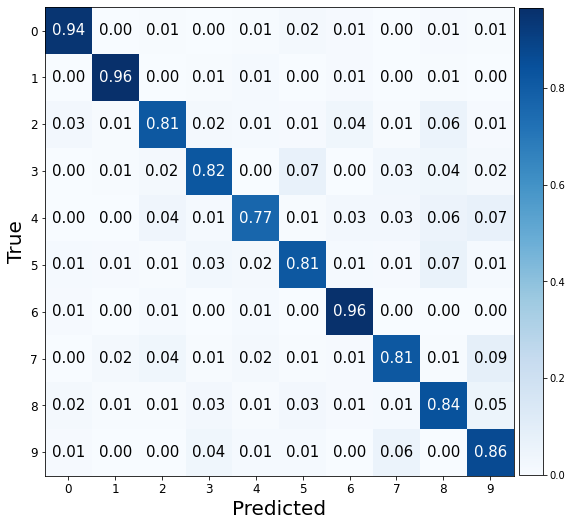

###################

ne: 100, hd:100, wd:0.1, lr: 0.001, bs:256 
Valid Evaluation loss: 0.709593653678894. f1:0.8757823009036654 acc: 0.8755000233650208 


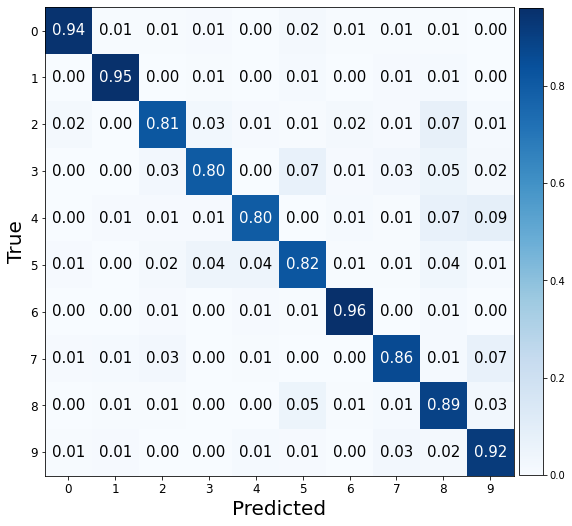

###################

ne: 100, hd:50, wd:0.001, lr: 0.01, bs:256 
Valid Evaluation loss: 1.602529525756836. f1:0.4081784555236393 acc: 0.4555000066757202 


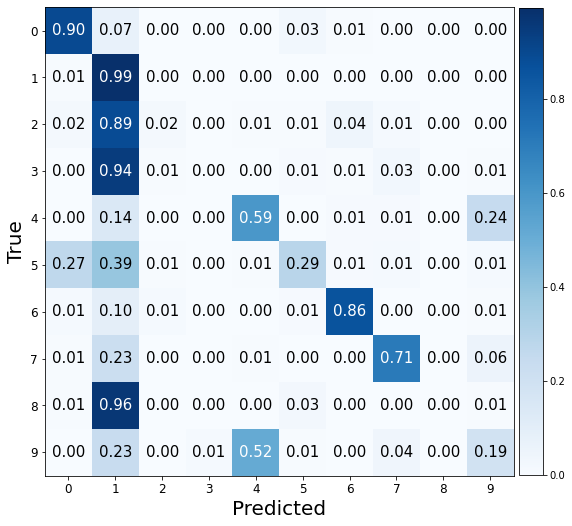

###################

ne: 100, hd:80, wd:0.001, lr: 0.01, bs:256 
Valid Evaluation loss: 1.4675859212875366. f1:0.46765354065398307 acc: 0.5095000267028809 


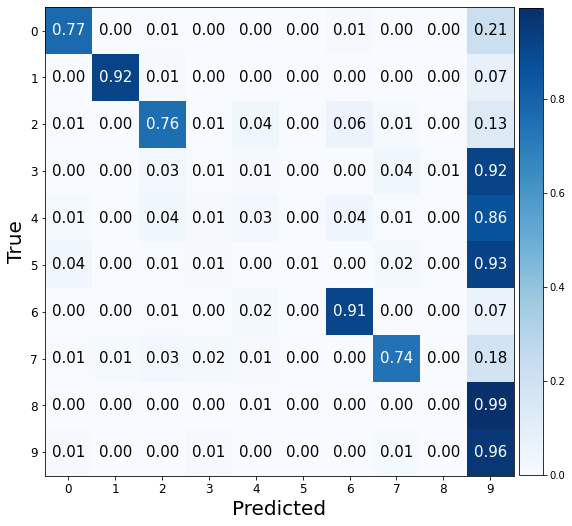

###################

ne: 100, hd:100, wd:0.001, lr: 0.01, bs:256 
Valid Evaluation loss: 1.1102025508880615. f1:0.7009961074086204 acc: 0.7039999961853027 


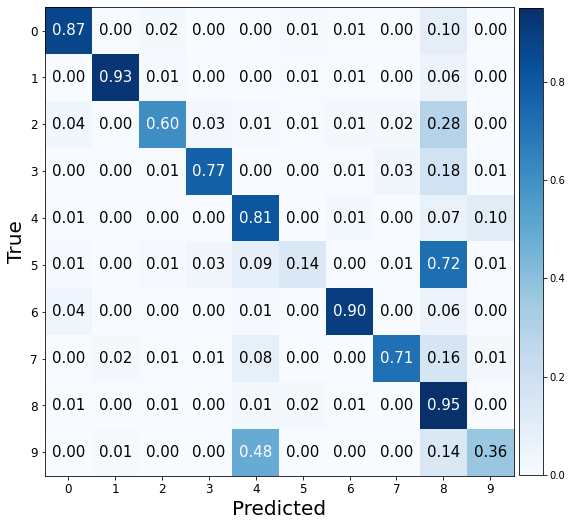

###################

ne: 100, hd:50, wd:0.01, lr: 0.01, bs:256 
Valid Evaluation loss: 1.6952608823776245. f1:0.39618207114743964 acc: 0.429500013589859 


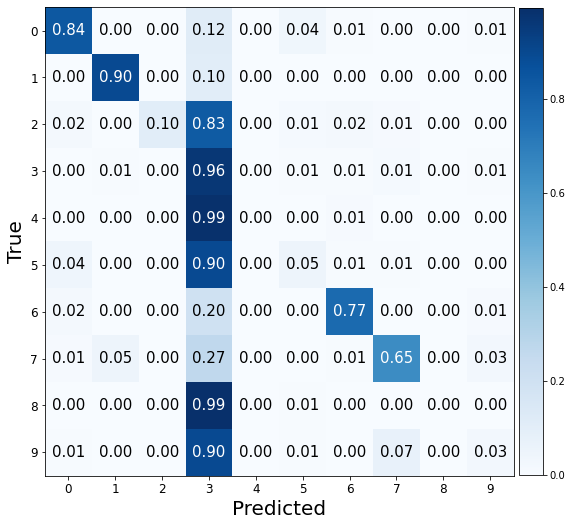

###################

ne: 100, hd:80, wd:0.01, lr: 0.01, bs:256 
Valid Evaluation loss: 1.616755723953247. f1:0.41123246359395826 acc: 0.44200000166893005 


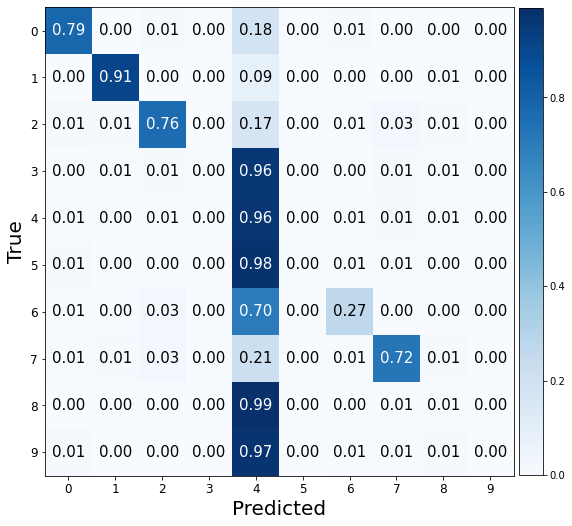

###################

ne: 100, hd:100, wd:0.01, lr: 0.01, bs:256 
Valid Evaluation loss: 1.3055866956710815. f1:0.6942882389389966 acc: 0.6949999928474426 


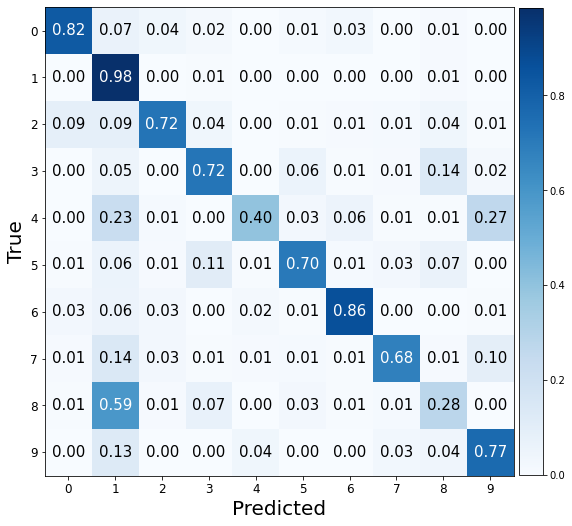

###################

ne: 100, hd:50, wd:0.1, lr: 0.01, bs:256 
Valid Evaluation loss: 0.8167334794998169. f1:0.8094810718138019 acc: 0.8034999966621399 


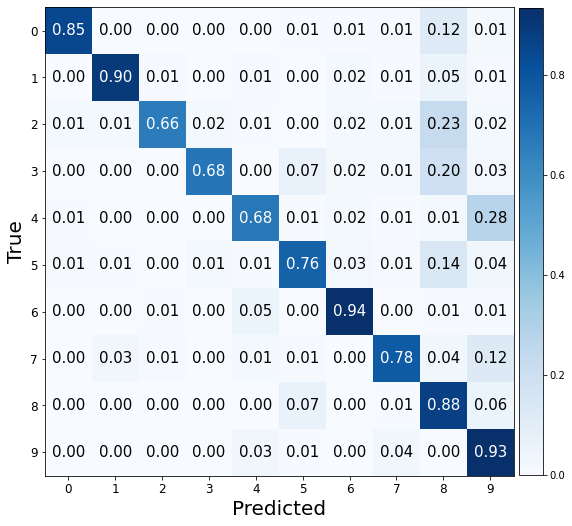

###################

ne: 100, hd:80, wd:0.1, lr: 0.01, bs:256 
Valid Evaluation loss: 1.3120784759521484. f1:0.5298463273478694 acc: 0.5730000138282776 


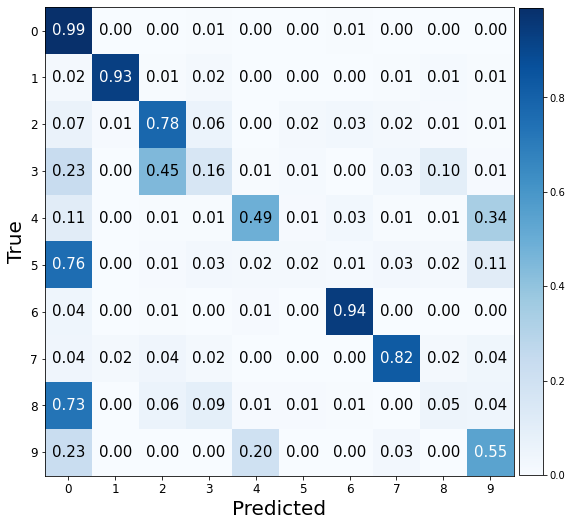

###################

ne: 100, hd:100, wd:0.1, lr: 0.01, bs:256 
Valid Evaluation loss: 0.6721919178962708. f1:0.8165084101495003 acc: 0.8125 


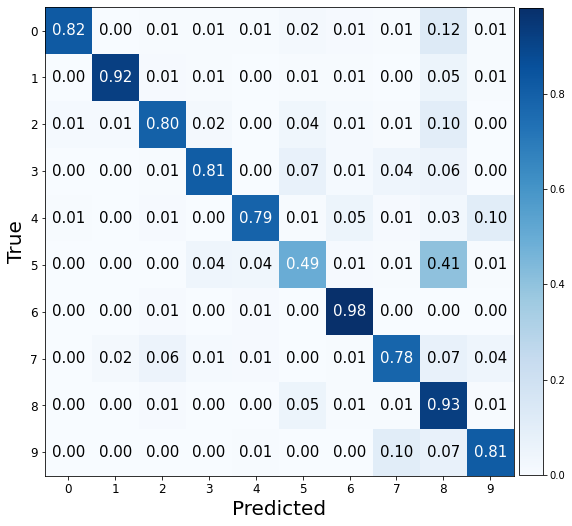

###################

ne: 100, hd:50, wd:0.001, lr: 0.1, bs:256 
Valid Evaluation loss: 6.075817108154297. f1:0.14495332380812348 acc: 0.1914999932050705 


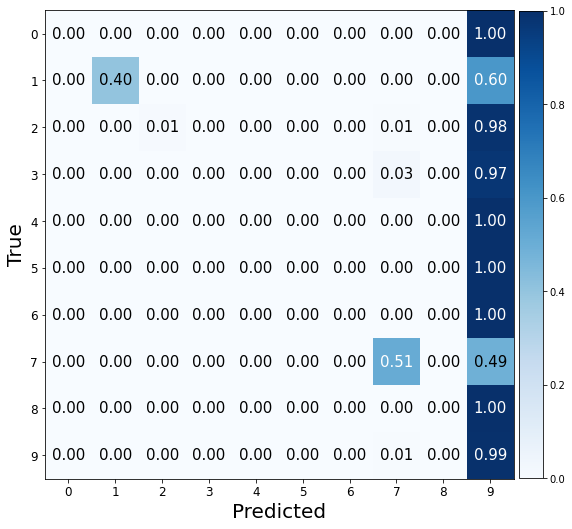

###################

ne: 100, hd:80, wd:0.001, lr: 0.1, bs:256 
Valid Evaluation loss: 7.243618011474609. f1:0.08550379097886009 acc: 0.1509999930858612 


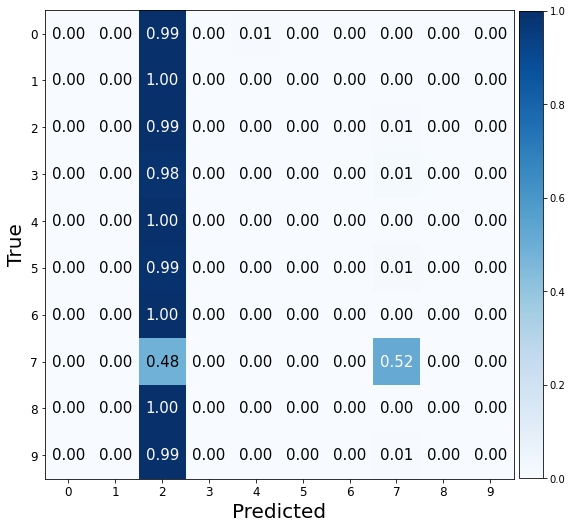

###################

ne: 100, hd:100, wd:0.001, lr: 0.1, bs:256 
Valid Evaluation loss: 2.2514147758483887. f1:0.10542655977590679 acc: 0.17499999701976776 


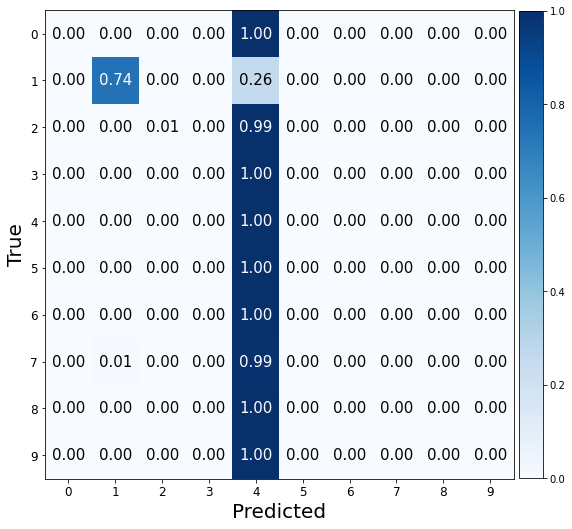

###################

ne: 100, hd:50, wd:0.01, lr: 0.1, bs:256 
Valid Evaluation loss: 3.1002800464630127. f1:0.10806655179680165 acc: 0.1770000010728836 


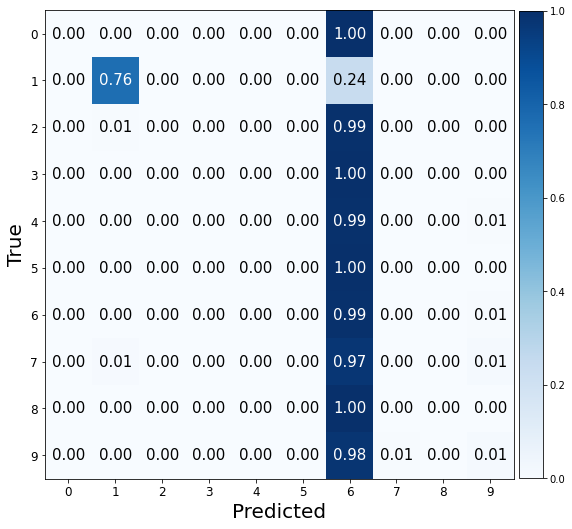

###################

ne: 100, hd:80, wd:0.01, lr: 0.1, bs:256 
Valid Evaluation loss: 2.789419174194336. f1:0.1357133238824603 acc: 0.1979999989271164 


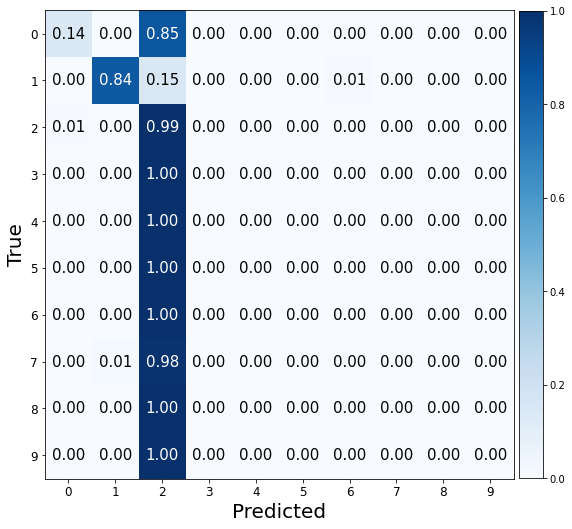

###################

ne: 100, hd:100, wd:0.01, lr: 0.1, bs:256 
Valid Evaluation loss: 2.5956947803497314. f1:0.13952826368079013 acc: 0.19300000369548798 


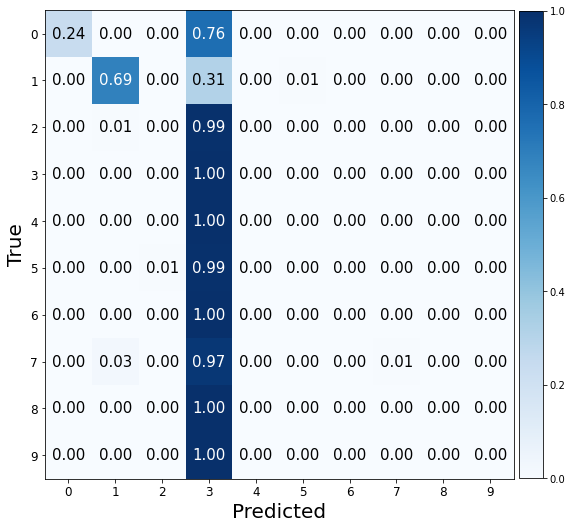

###################

ne: 100, hd:50, wd:0.1, lr: 0.1, bs:256 
Valid Evaluation loss: 2.3145463466644287. f1:0.019198844380243347 acc: 0.10050000250339508 


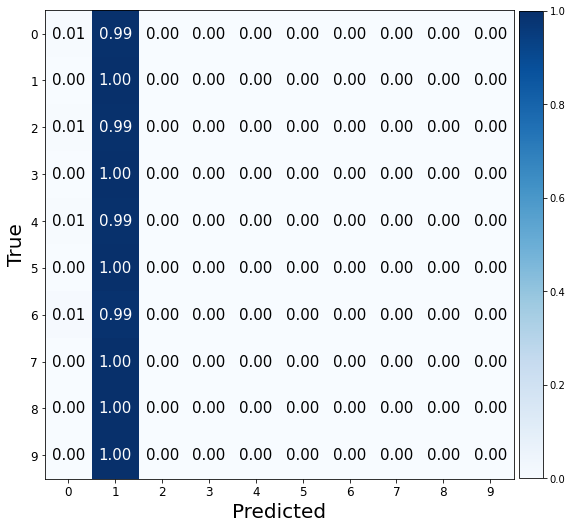

###################

ne: 100, hd:80, wd:0.1, lr: 0.1, bs:256 
Valid Evaluation loss: 6.091577529907227. f1:0.09920770003346449 acc: 0.19750000536441803 


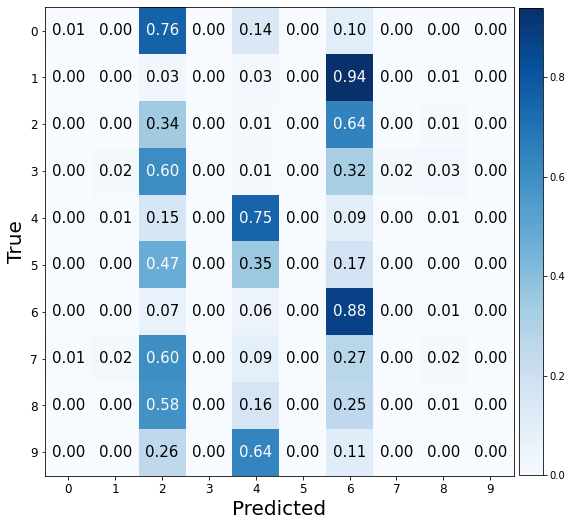

###################

ne: 100, hd:100, wd:0.1, lr: 0.1, bs:256 
Valid Evaluation loss: 2.500013589859009. f1:0.23593062073440704 acc: 0.29600000381469727 


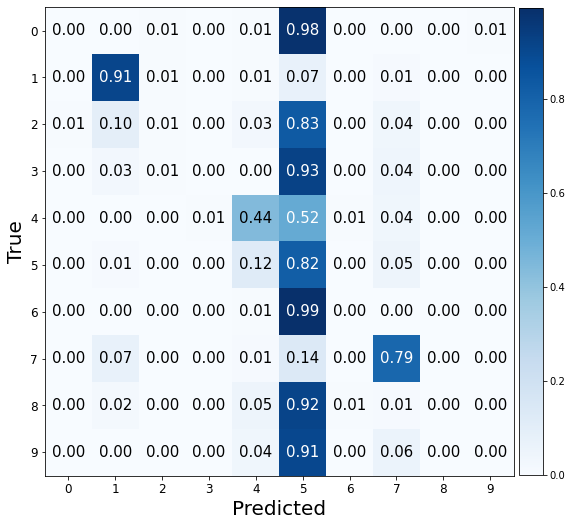

###################

ne: 100, hd:50, wd:0.001, lr: 0.001, bs:512 
Valid Evaluation loss: 0.7551169395446777. f1:0.8600474325018548 acc: 0.8600000143051147 


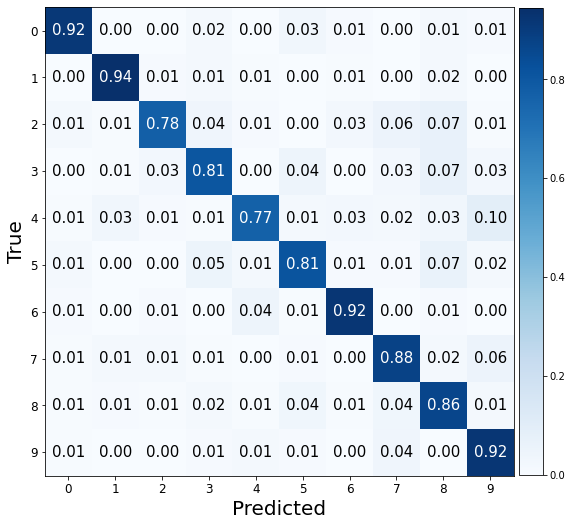

###################

ne: 100, hd:80, wd:0.001, lr: 0.001, bs:512 
Valid Evaluation loss: 0.5990997552871704. f1:0.8863968453173561 acc: 0.8865000009536743 


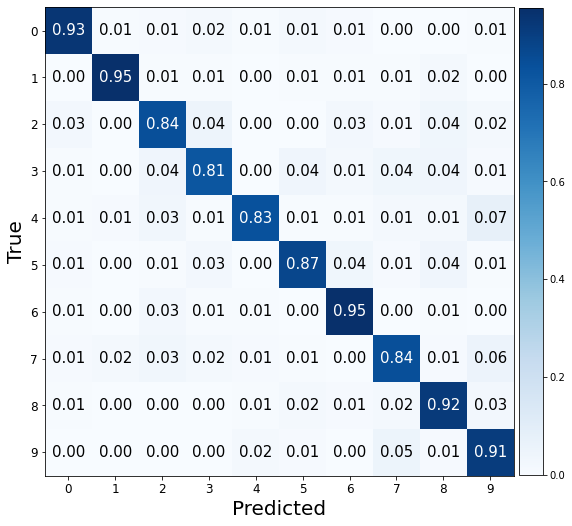

###################

ne: 100, hd:100, wd:0.001, lr: 0.001, bs:512 
Valid Evaluation loss: 0.7691187262535095. f1:0.8950491337382387 acc: 0.8949999809265137 


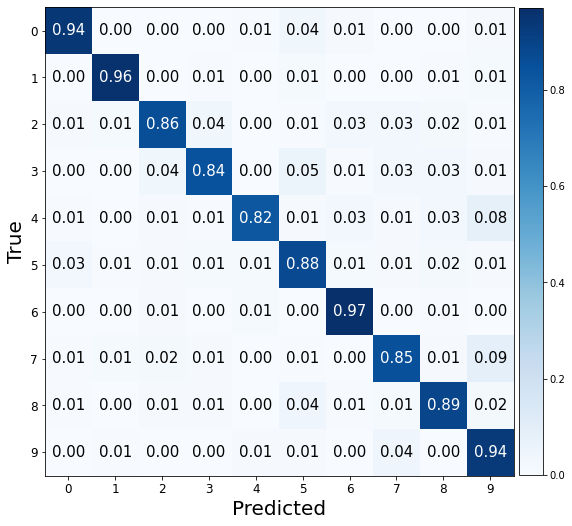

###################

ne: 100, hd:50, wd:0.01, lr: 0.001, bs:512 
Valid Evaluation loss: 0.8003146648406982. f1:0.8439004063322985 acc: 0.8445000052452087 


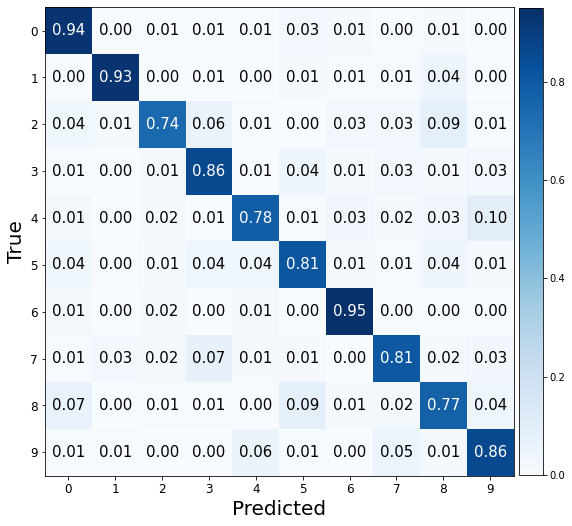

###################

ne: 100, hd:80, wd:0.01, lr: 0.001, bs:512 
Valid Evaluation loss: 0.6173324584960938. f1:0.8694338810208757 acc: 0.8694999814033508 


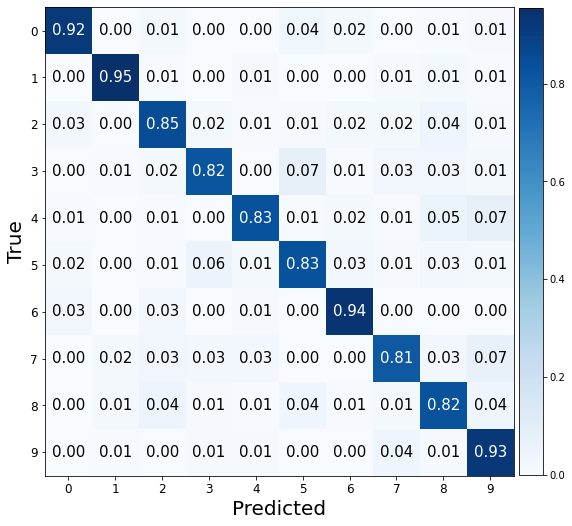

###################

ne: 100, hd:100, wd:0.01, lr: 0.001, bs:512 
Valid Evaluation loss: 0.6070727109909058. f1:0.8947243934492739 acc: 0.8949999809265137 


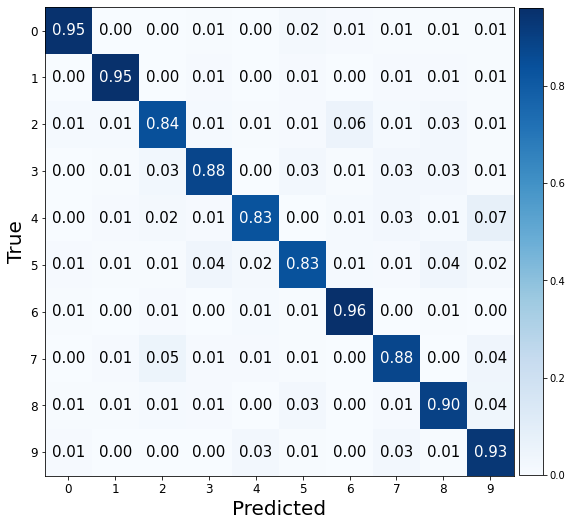

###################

ne: 100, hd:50, wd:0.1, lr: 0.001, bs:512 
Valid Evaluation loss: 0.7454696297645569. f1:0.8670038183778461 acc: 0.8669999837875366 


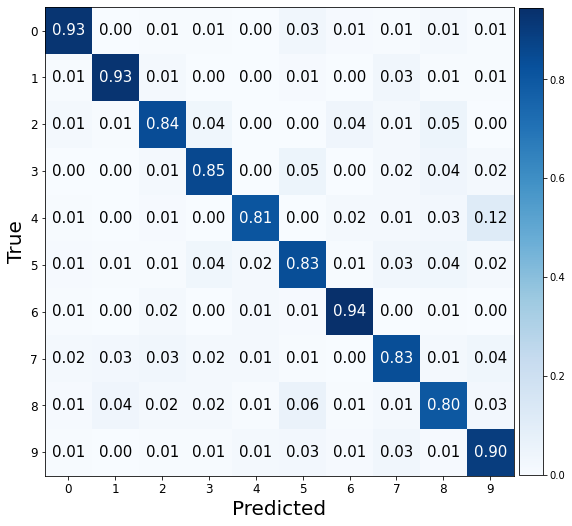

###################

ne: 100, hd:80, wd:0.1, lr: 0.001, bs:512 
Valid Evaluation loss: 0.7230696082115173. f1:0.8814502546480713 acc: 0.8809999823570251 


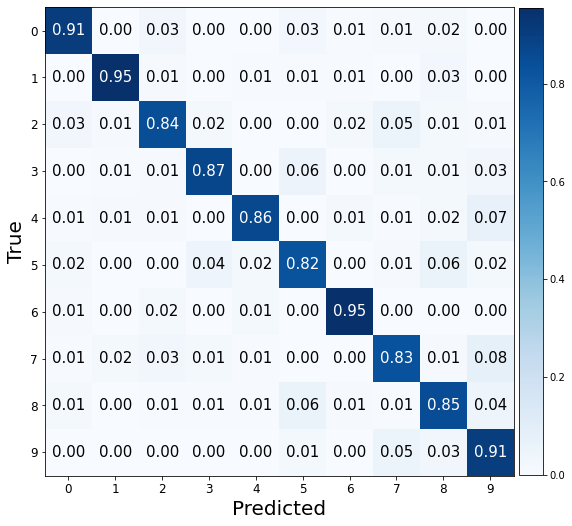

###################

ne: 100, hd:100, wd:0.1, lr: 0.001, bs:512 
Valid Evaluation loss: 0.621536135673523. f1:0.8782153698099195 acc: 0.878000020980835 


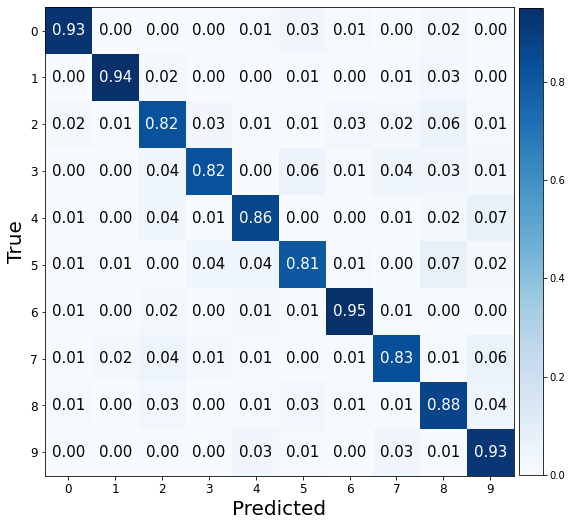

###################

ne: 100, hd:50, wd:0.001, lr: 0.01, bs:512 
Valid Evaluation loss: 1.560314416885376. f1:0.485765960937366 acc: 0.5019999742507935 


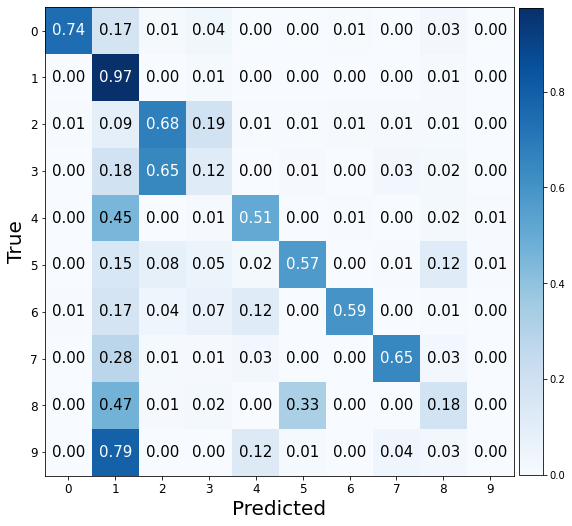

###################

ne: 100, hd:80, wd:0.001, lr: 0.01, bs:512 
Valid Evaluation loss: 1.3087093830108643. f1:0.5997193122245547 acc: 0.6215000152587891 


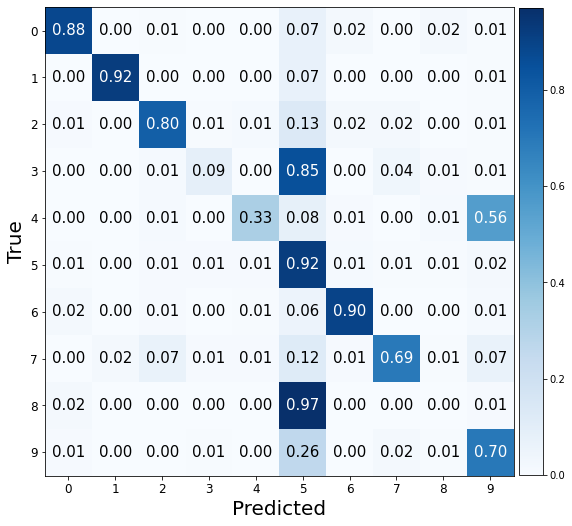

###################

ne: 100, hd:100, wd:0.001, lr: 0.01, bs:512 
Valid Evaluation loss: 0.9720472693443298. f1:0.8122650211382965 acc: 0.8084999918937683 


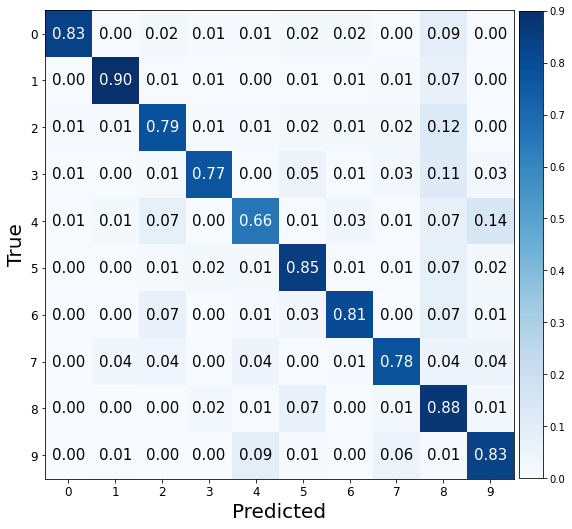

###################

ne: 100, hd:50, wd:0.01, lr: 0.01, bs:512 
Valid Evaluation loss: 1.7895586490631104. f1:0.3328280554218742 acc: 0.38100001215934753 


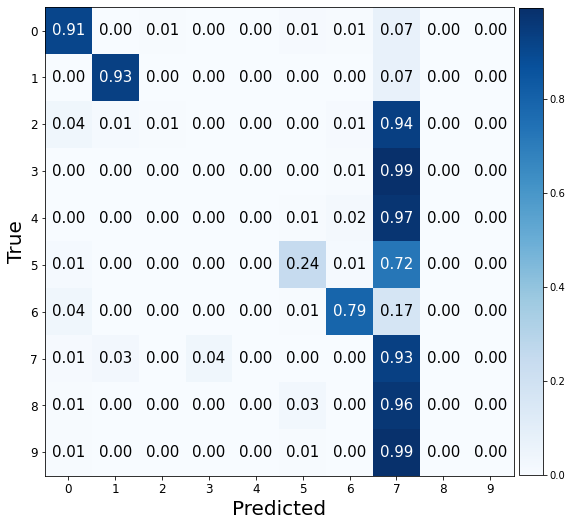

###################

ne: 100, hd:80, wd:0.01, lr: 0.01, bs:512 
Valid Evaluation loss: 1.3202317953109741. f1:0.6006523488712451 acc: 0.6274999976158142 


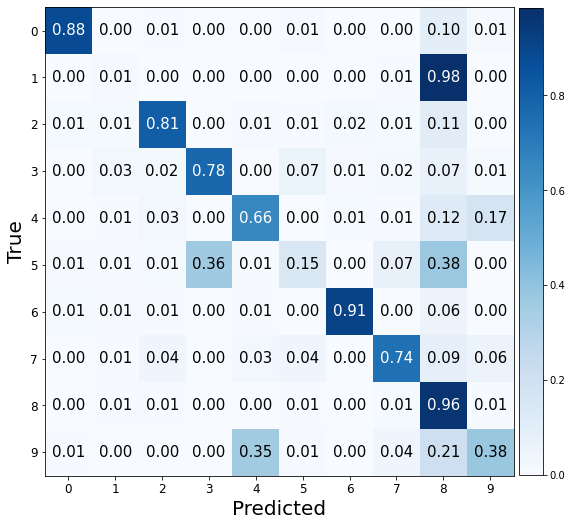

###################

ne: 100, hd:100, wd:0.01, lr: 0.01, bs:512 
Valid Evaluation loss: 1.0658783912658691. f1:0.7049069709955316 acc: 0.7124999761581421 


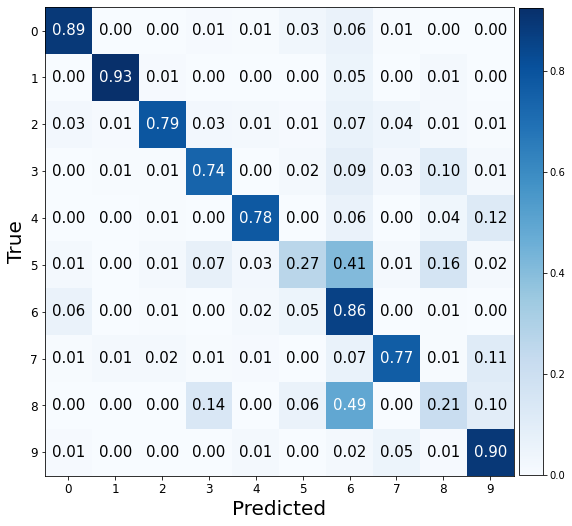

###################

ne: 100, hd:50, wd:0.1, lr: 0.01, bs:512 
Valid Evaluation loss: 1.5992897748947144. f1:0.40723387940255196 acc: 0.45649999380111694 


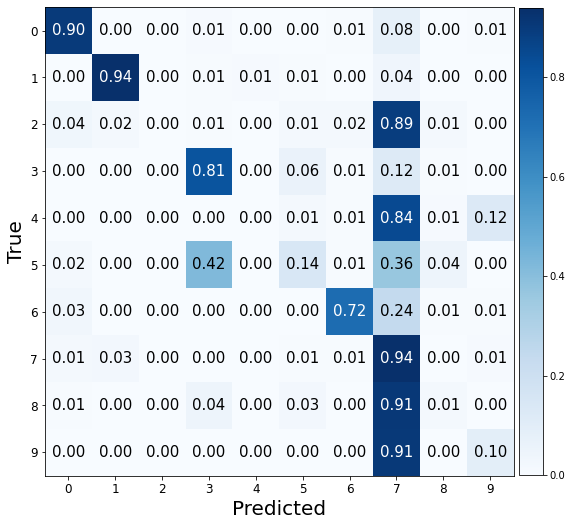

###################

ne: 100, hd:80, wd:0.1, lr: 0.01, bs:512 
Valid Evaluation loss: 1.0613460540771484. f1:0.7296101599400133 acc: 0.7254999876022339 


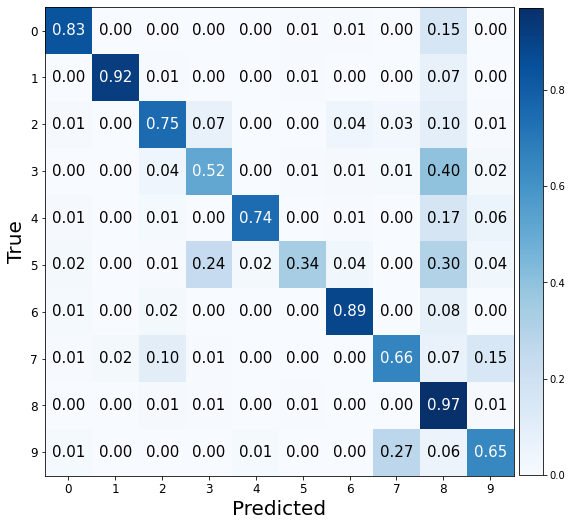

###################

ne: 100, hd:100, wd:0.1, lr: 0.01, bs:512 
Valid Evaluation loss: 0.8050673007965088. f1:0.7599490445146704 acc: 0.7630000114440918 


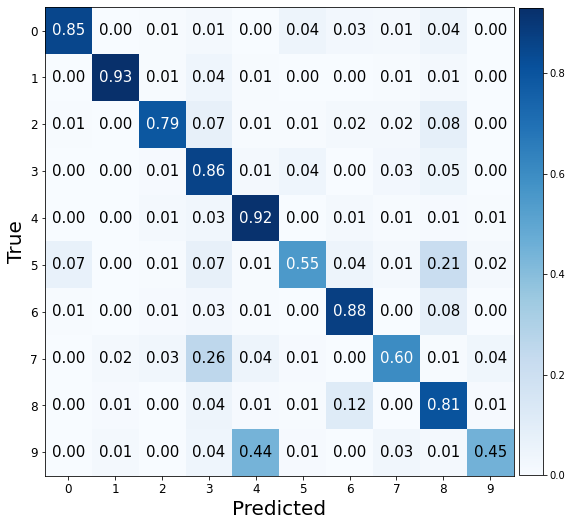

###################

ne: 100, hd:50, wd:0.001, lr: 0.1, bs:512 
Valid Evaluation loss: 2.2708535194396973. f1:0.042791967700325756 acc: 0.11349999904632568 


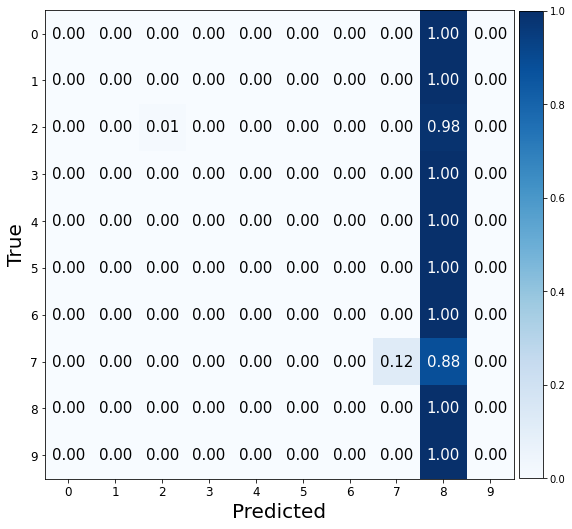

###################

ne: 100, hd:80, wd:0.001, lr: 0.1, bs:512 
Valid Evaluation loss: 3.891596794128418. f1:0.17159852072307027 acc: 0.2045000046491623 


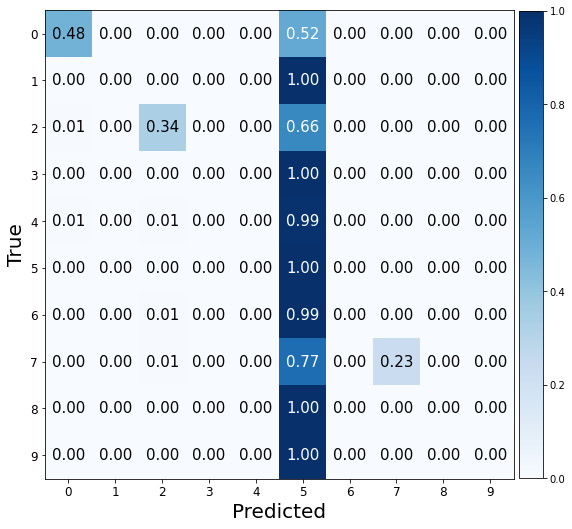

###################

ne: 100, hd:100, wd:0.001, lr: 0.1, bs:512 
Valid Evaluation loss: 2.764040470123291. f1:0.11019752072031923 acc: 0.1574999988079071 


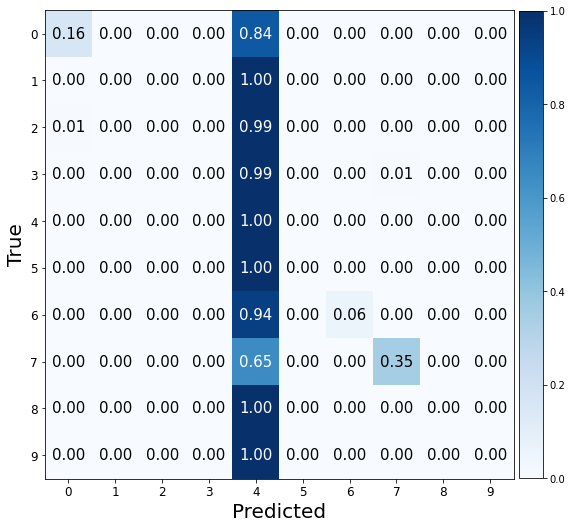

###################

ne: 100, hd:50, wd:0.01, lr: 0.1, bs:512 
Valid Evaluation loss: 2.8217711448669434. f1:0.08130409919159885 acc: 0.14550000429153442 


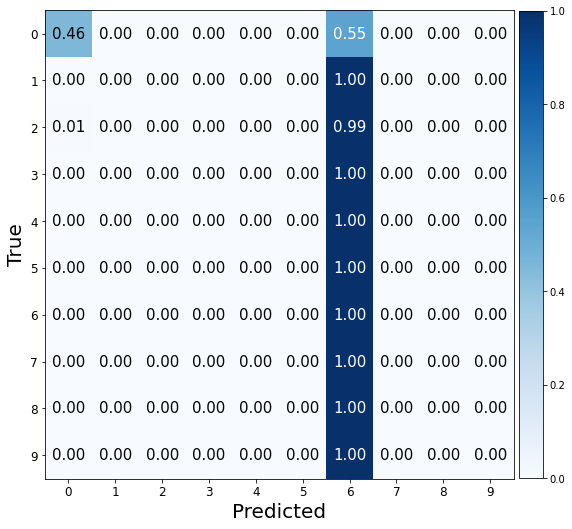

###################

ne: 100, hd:80, wd:0.01, lr: 0.1, bs:512 
Valid Evaluation loss: 5.199031352996826. f1:0.1567039312882658 acc: 0.20749999582767487 


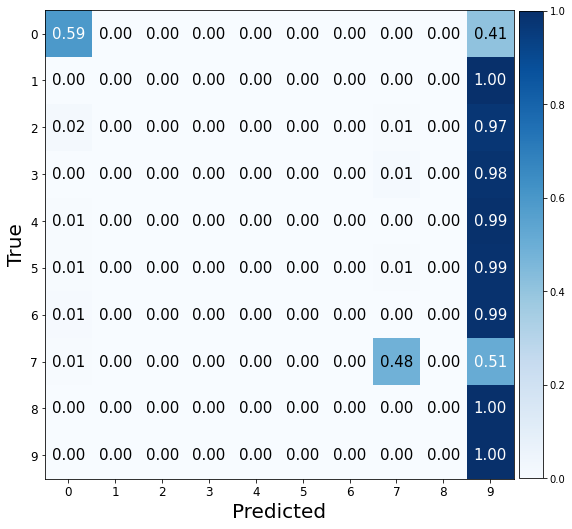

###################

ne: 100, hd:100, wd:0.01, lr: 0.1, bs:512 
Valid Evaluation loss: 2.8879120349884033. f1:0.1081999467797731 acc: 0.1809999942779541 


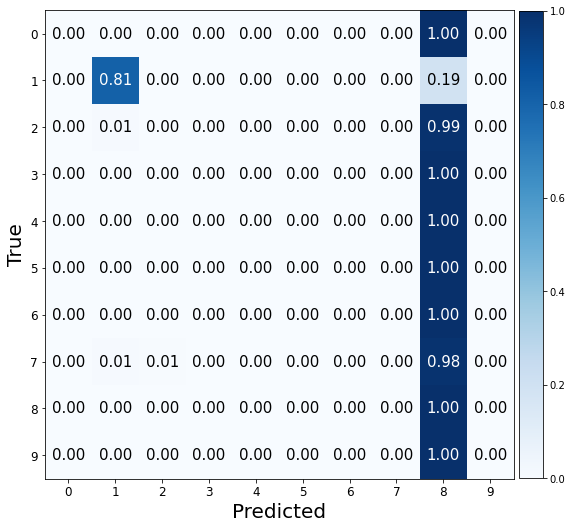

###################

ne: 100, hd:50, wd:0.1, lr: 0.1, bs:512 
Valid Evaluation loss: 2.133484125137329. f1:0.10652380009242754 acc: 0.17949999868869781 


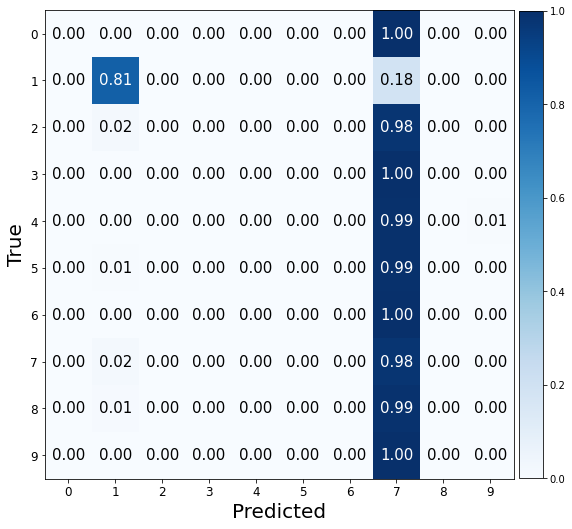

###################

ne: 100, hd:80, wd:0.1, lr: 0.1, bs:512 
Valid Evaluation loss: 2.2964651584625244. f1:0.11957885029462596 acc: 0.1665000021457672 


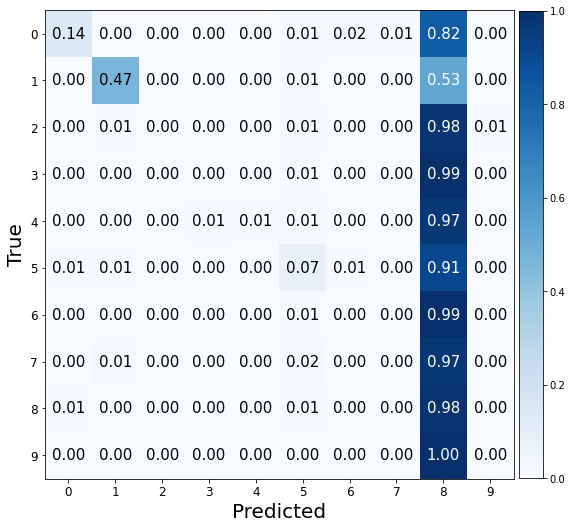

###################

ne: 100, hd:100, wd:0.1, lr: 0.1, bs:512 
Valid Evaluation loss: 2.2890944480895996. f1:0.25442065367364797 acc: 0.289000004529953 


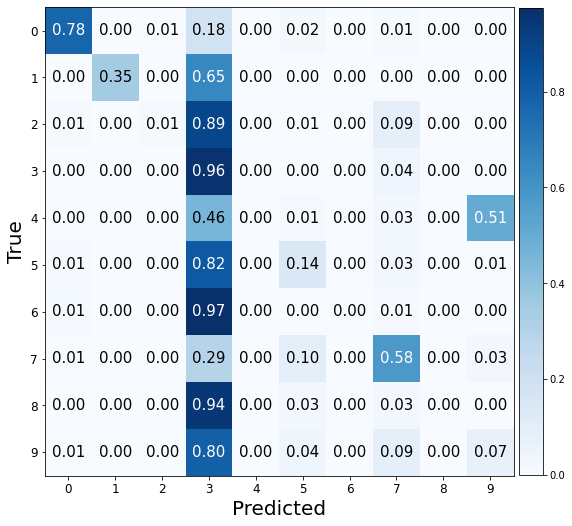

###################

ne: 100, hd:50, wd:0.001, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.670221745967865. f1:0.8477441153546952 acc: 0.8485000133514404 


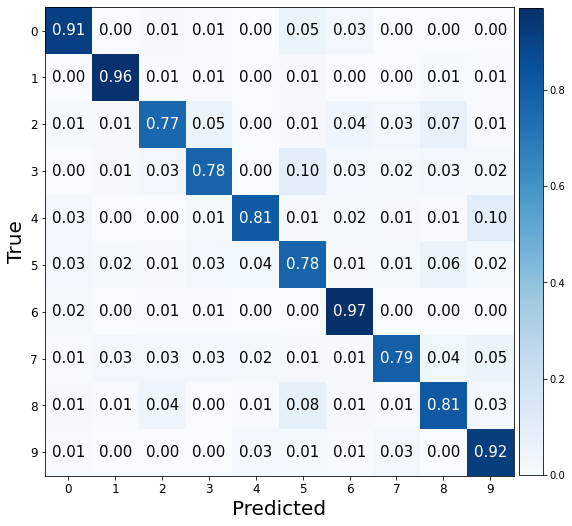

###################

ne: 100, hd:80, wd:0.001, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.6206402778625488. f1:0.8757004587210767 acc: 0.8759999871253967 


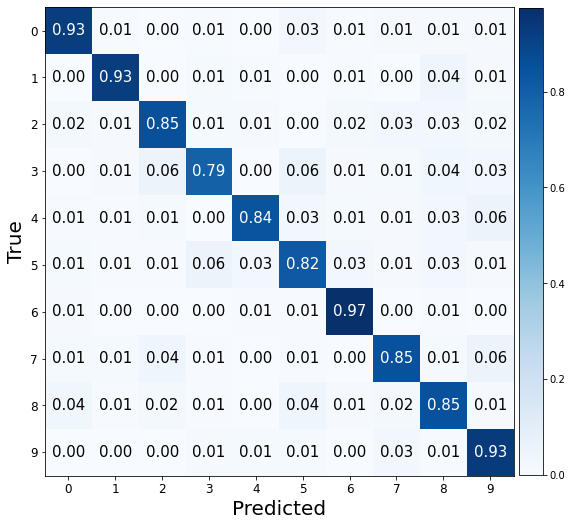

###################

ne: 100, hd:100, wd:0.001, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.81130051612854. f1:0.8778465748777726 acc: 0.878000020980835 


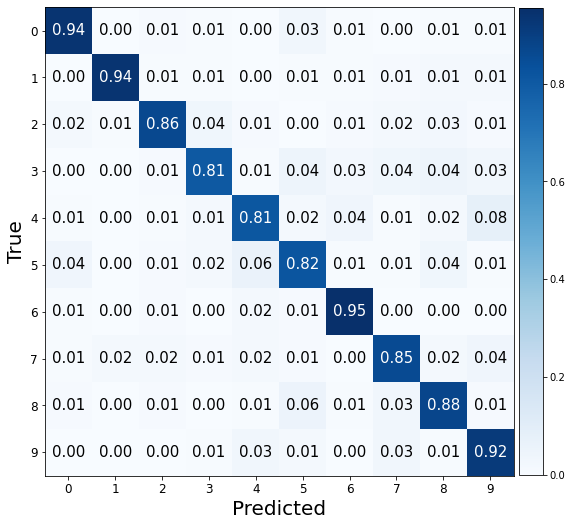

###################

ne: 100, hd:50, wd:0.01, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.6706989407539368. f1:0.8386296116083033 acc: 0.8395000100135803 


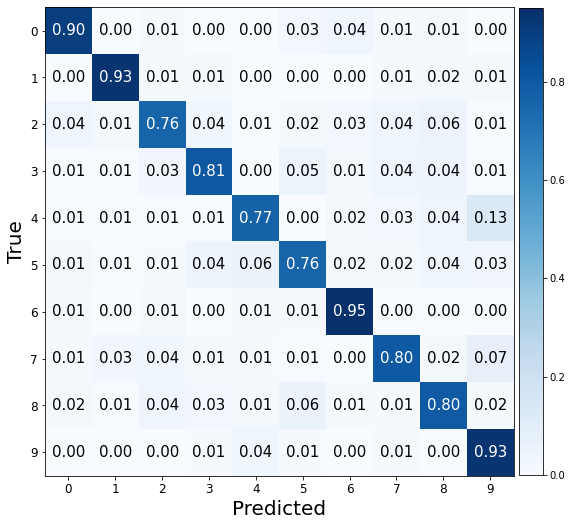

###################

ne: 100, hd:80, wd:0.01, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.6106755137443542. f1:0.8879646437352442 acc: 0.8880000114440918 


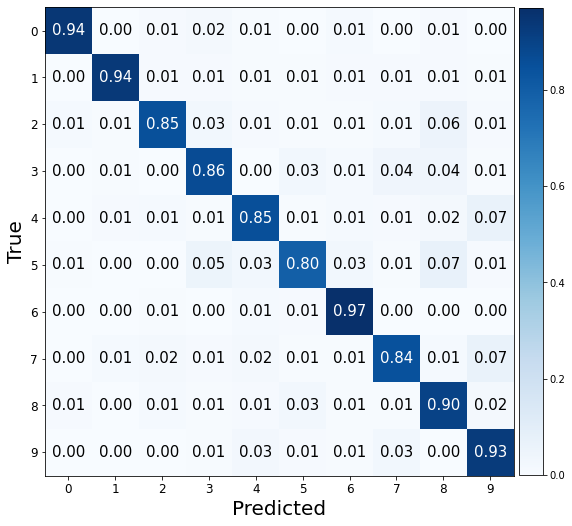

###################

ne: 100, hd:100, wd:0.01, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.5723731517791748. f1:0.8983911511683267 acc: 0.8985000252723694 


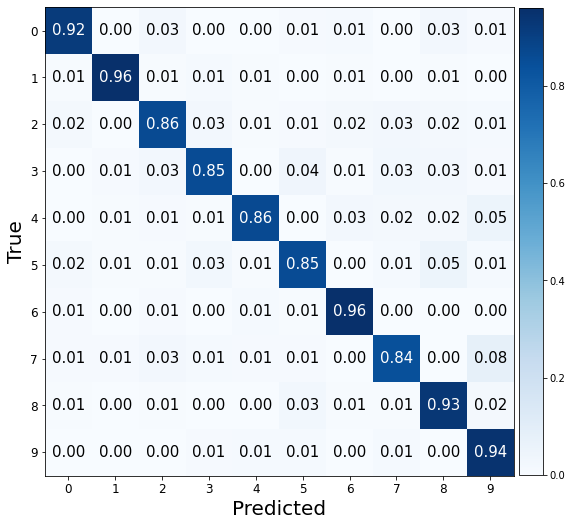

###################

ne: 100, hd:50, wd:0.1, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.5652890205383301. f1:0.872473055767386 acc: 0.8725000023841858 


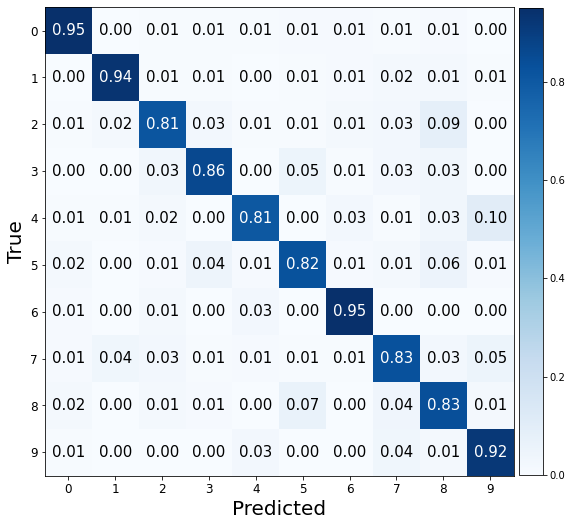

###################

ne: 100, hd:80, wd:0.1, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.6595259308815002. f1:0.8825967758829286 acc: 0.8824999928474426 


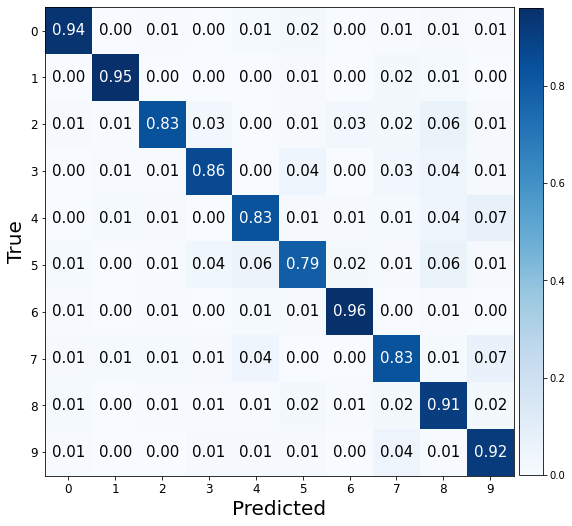

###################

ne: 100, hd:100, wd:0.1, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.5983031988143921. f1:0.8930178786194315 acc: 0.8930000066757202 


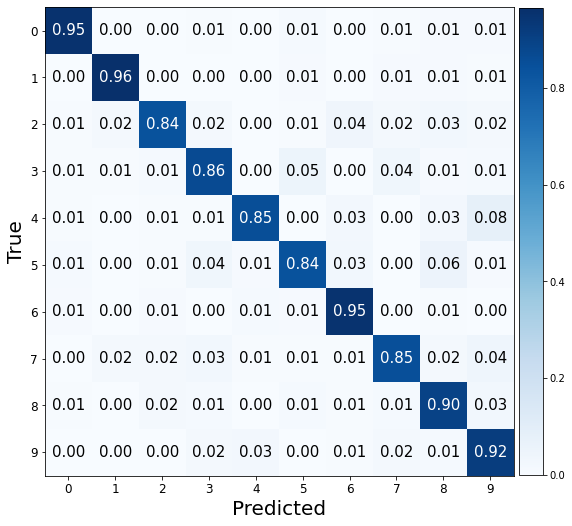

###################

ne: 100, hd:50, wd:0.001, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.6786582469940186. f1:0.3843346426784407 acc: 0.4350000023841858 


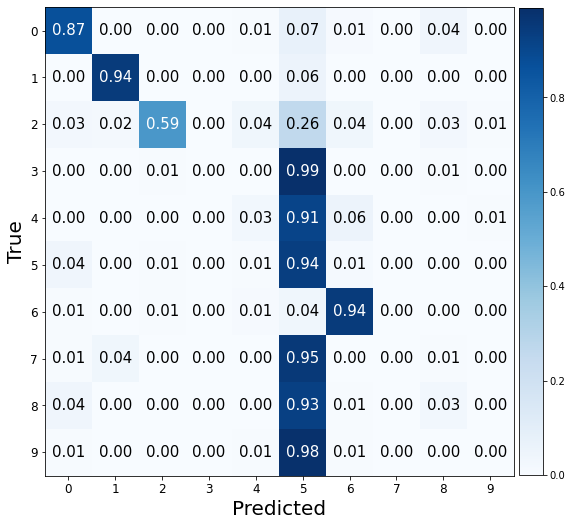

###################

ne: 100, hd:80, wd:0.001, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.4604593515396118. f1:0.5153846022403 acc: 0.5354999899864197 


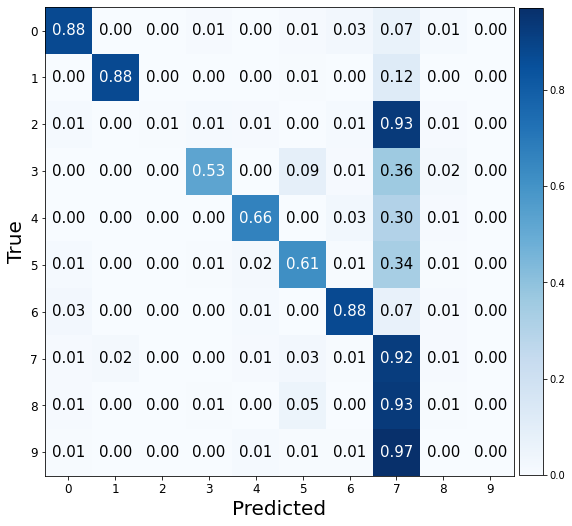

###################

ne: 100, hd:100, wd:0.001, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.4238182306289673. f1:0.5217965871567782 acc: 0.5435000061988831 


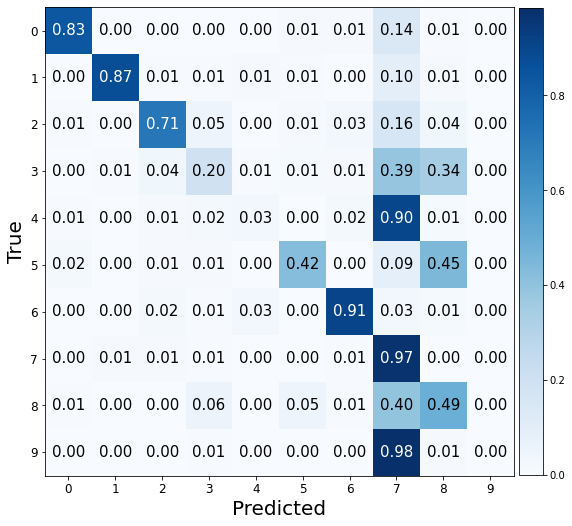

###################

ne: 100, hd:50, wd:0.01, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.0560908317565918. f1:0.7219062424316226 acc: 0.7250000238418579 


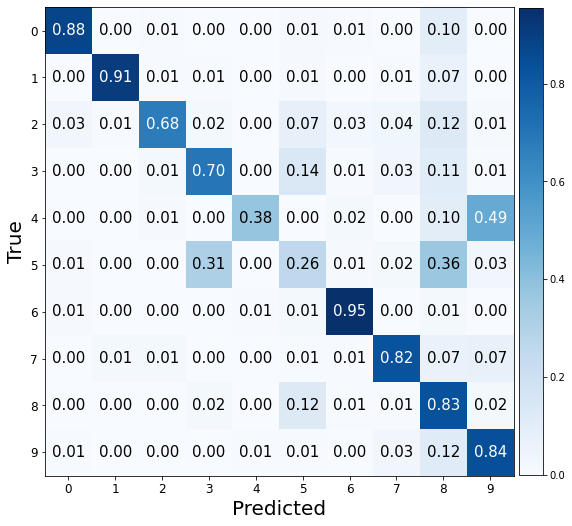

###################

ne: 100, hd:80, wd:0.01, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.3987168073654175. f1:0.55418233162936 acc: 0.5755000114440918 


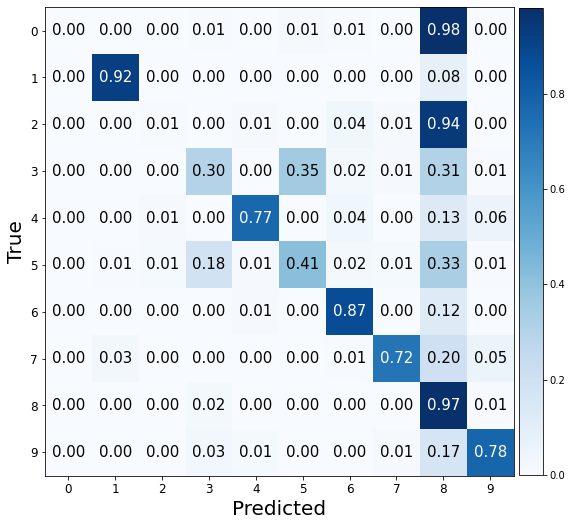

###################

ne: 100, hd:100, wd:0.01, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.0086616277694702. f1:0.8143573961277347 acc: 0.8075000047683716 


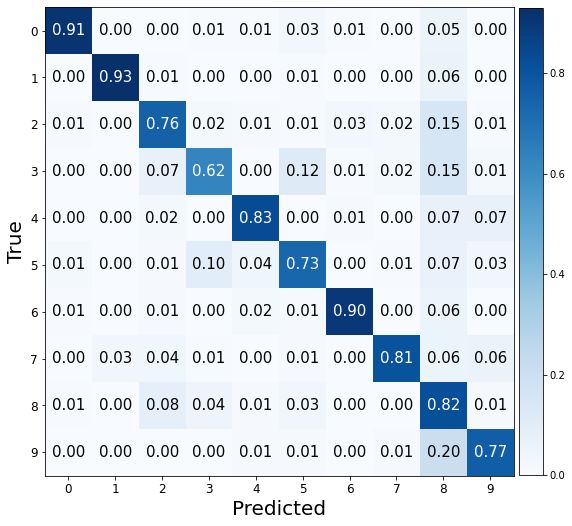

###################

ne: 100, hd:50, wd:0.1, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.7604948282241821. f1:0.3600952128815814 acc: 0.39750000834465027 


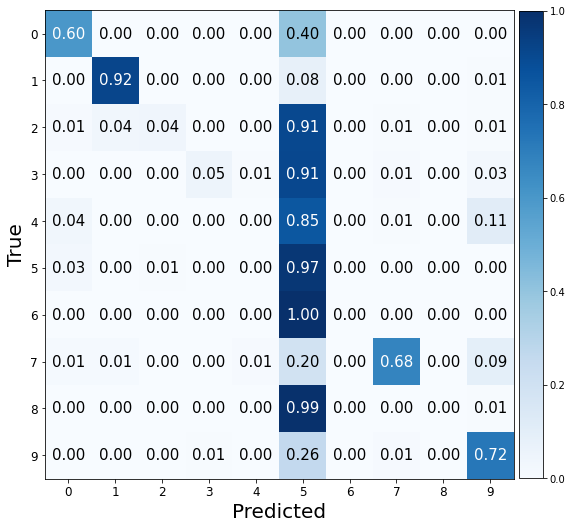

###################

ne: 100, hd:80, wd:0.1, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.9509108066558838. f1:0.7402272115439832 acc: 0.7409999966621399 


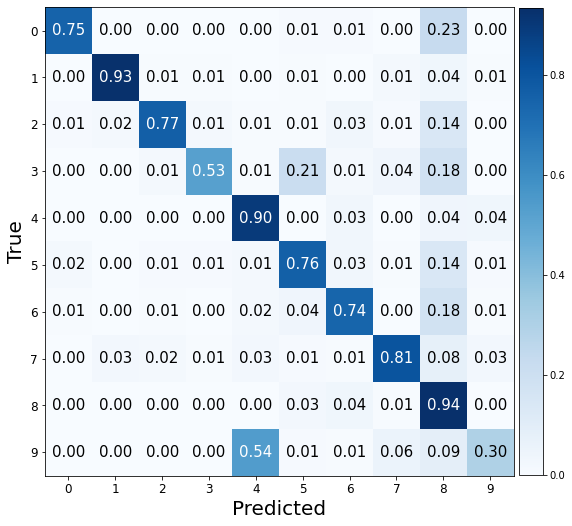

###################

ne: 100, hd:100, wd:0.1, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.6553554534912109. f1:0.8176263039982887 acc: 0.8144999742507935 


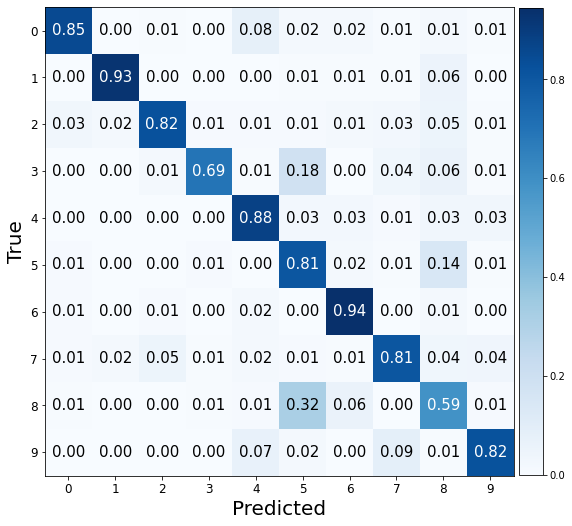

###################

ne: 100, hd:50, wd:0.001, lr: 0.1, bs:1024 
Valid Evaluation loss: 7.984099864959717. f1:0.2233037263150593 acc: 0.257999986410141 


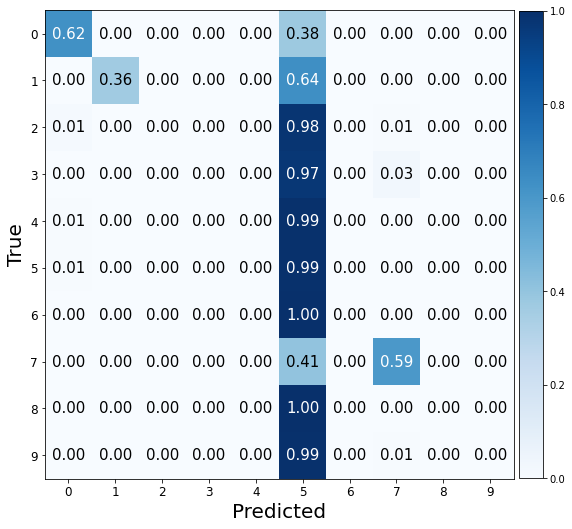

###################

ne: 100, hd:80, wd:0.001, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.3025898933410645. f1:0.01818181818181818 acc: 0.10000000149011612 


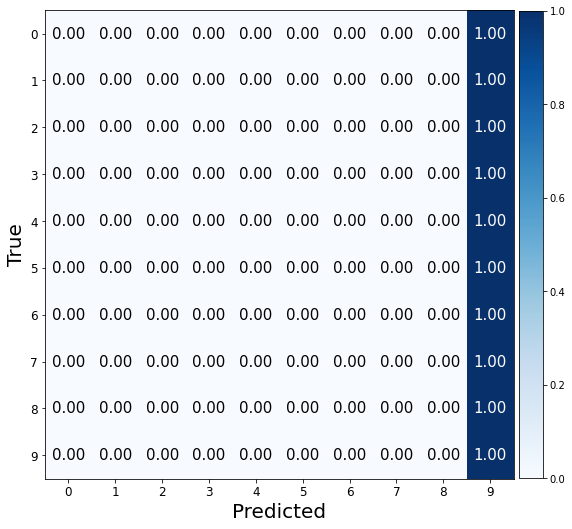

###################

ne: 100, hd:100, wd:0.001, lr: 0.1, bs:1024 
Valid Evaluation loss: 4.277685642242432. f1:0.10587142775309273 acc: 0.16099999845027924 


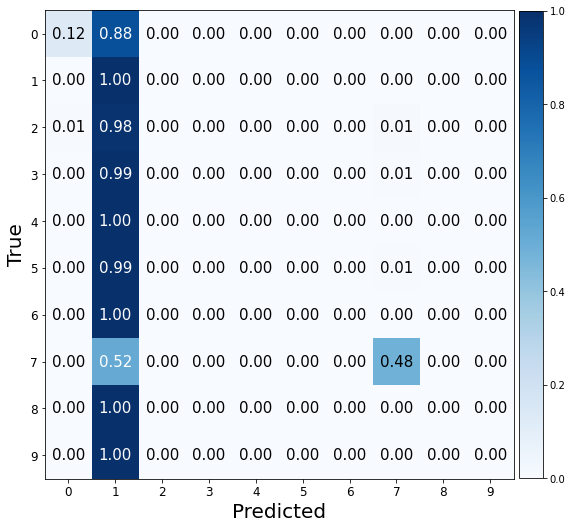

###################

ne: 100, hd:50, wd:0.01, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.3752830028533936. f1:0.07993423617790023 acc: 0.1445000022649765 


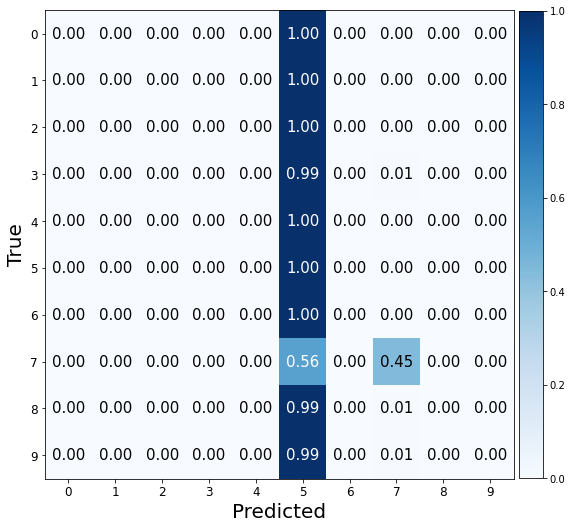

###################

ne: 100, hd:80, wd:0.01, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.3887553215026855. f1:0.08472945855962806 acc: 0.14800000190734863 


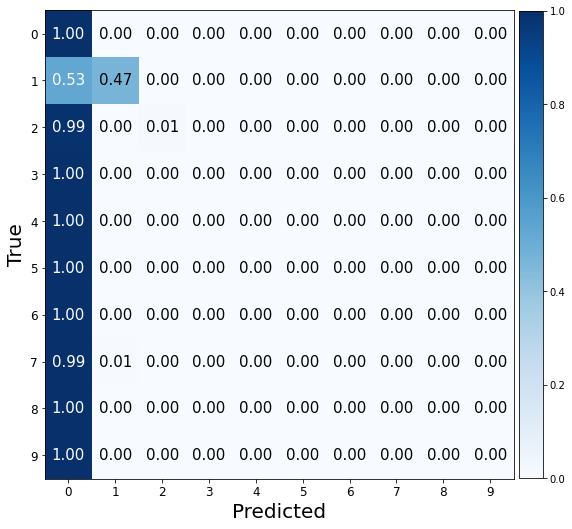

###################

ne: 100, hd:100, wd:0.01, lr: 0.1, bs:1024 
Valid Evaluation loss: 6.509064674377441. f1:0.19337688759963506 acc: 0.2460000067949295 


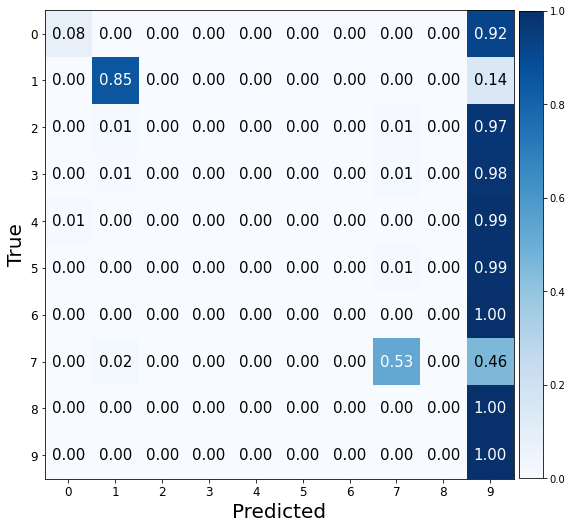

###################

ne: 100, hd:50, wd:0.1, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.3257319927215576. f1:0.0704476262299 acc: 0.13500000536441803 


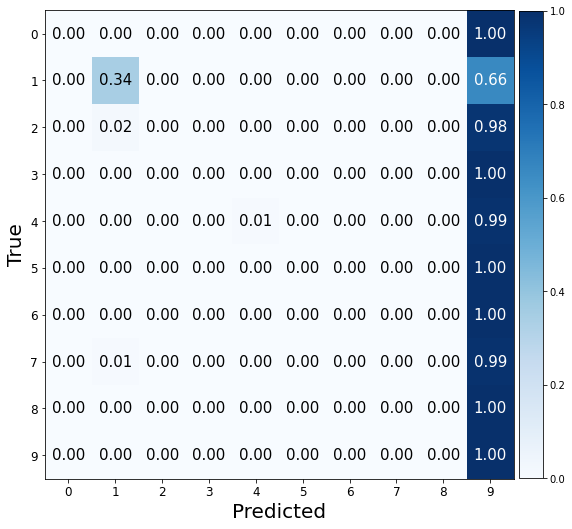

###################

ne: 100, hd:80, wd:0.1, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.253814458847046. f1:0.09997670633074945 acc: 0.16050000488758087 


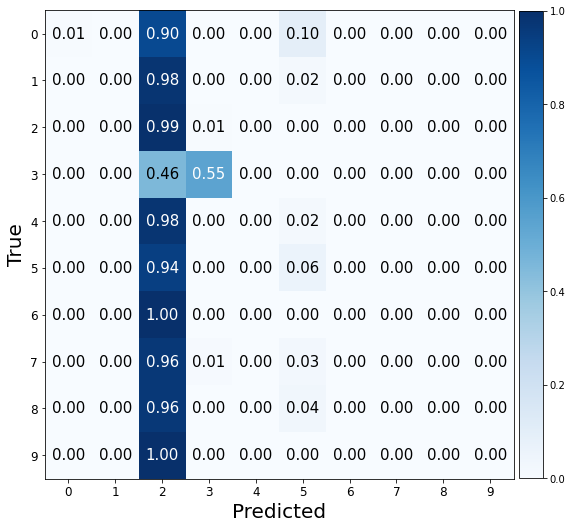

###################

ne: 100, hd:100, wd:0.1, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.203742742538452. f1:0.0753639709692409 acc: 0.13950000703334808 


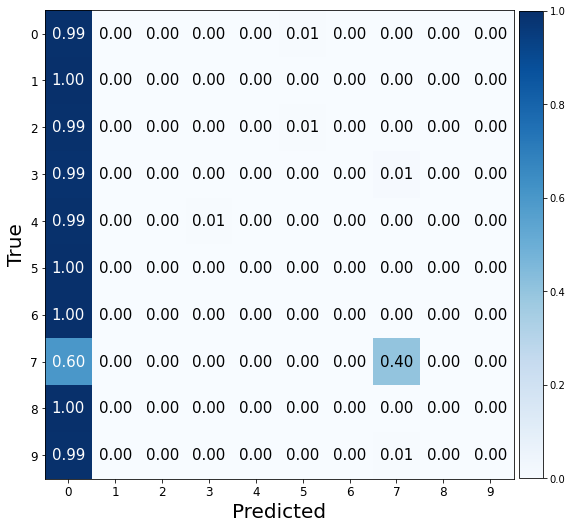

###################

ne: 150, hd:50, wd:0.001, lr: 0.001, bs:256 
Valid Evaluation loss: 0.7855057716369629. f1:0.8643092815584893 acc: 0.8644999861717224 


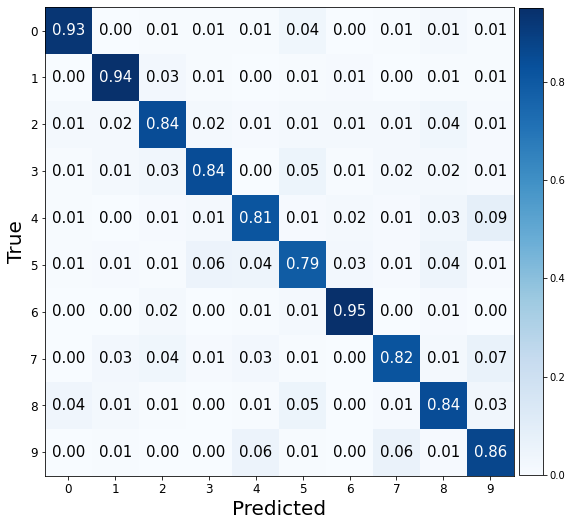

###################

ne: 150, hd:80, wd:0.001, lr: 0.001, bs:256 
Valid Evaluation loss: 0.7777860164642334. f1:0.8731961944773479 acc: 0.8730000257492065 


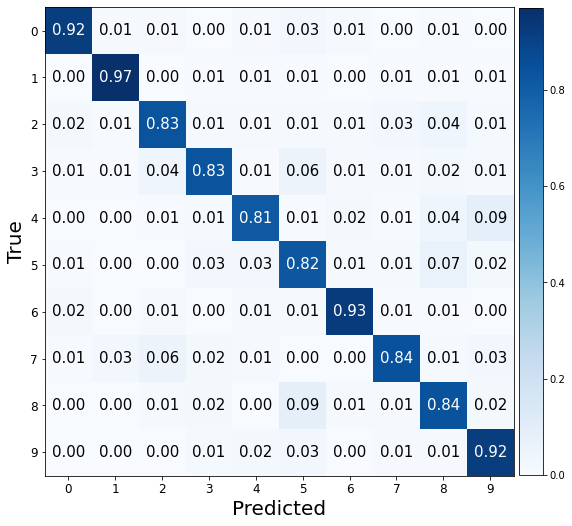

###################

ne: 150, hd:100, wd:0.001, lr: 0.001, bs:256 
Valid Evaluation loss: 0.6484948396682739. f1:0.8952488863056562 acc: 0.8955000042915344 


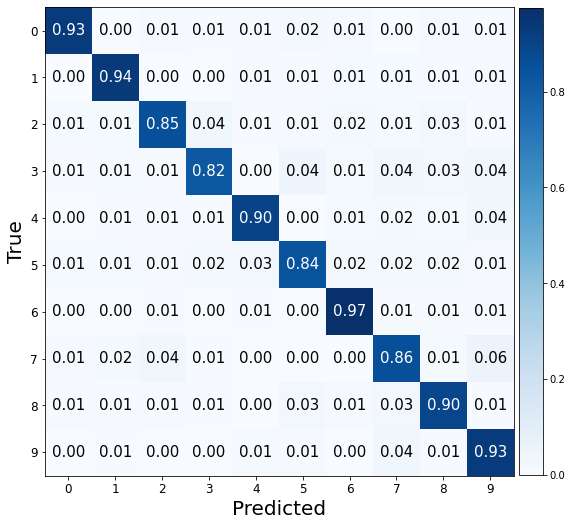

###################

ne: 150, hd:50, wd:0.01, lr: 0.001, bs:256 
Valid Evaluation loss: 0.6461682319641113. f1:0.8948486463662377 acc: 0.8949999809265137 


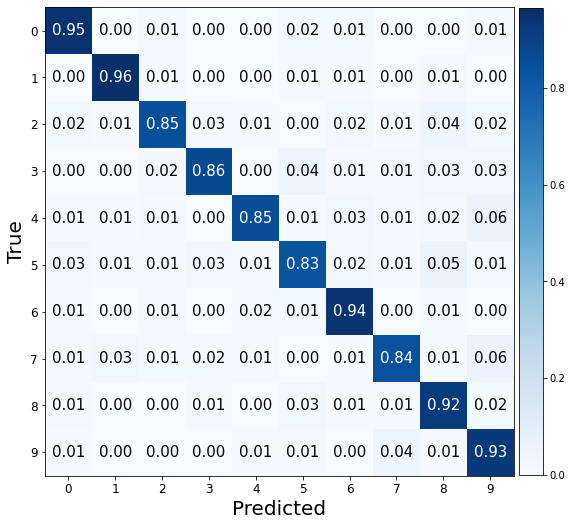

###################

ne: 150, hd:80, wd:0.01, lr: 0.001, bs:256 
Valid Evaluation loss: 0.5488475561141968. f1:0.888429960021196 acc: 0.8884999752044678 


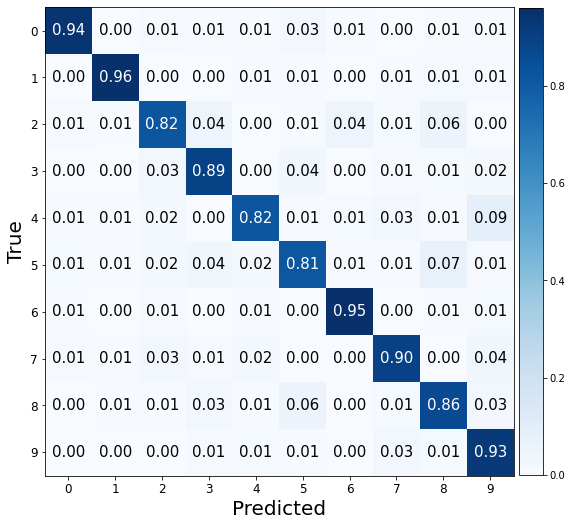

###################

ne: 150, hd:100, wd:0.01, lr: 0.001, bs:256 
Valid Evaluation loss: 0.5472309589385986. f1:0.8879048221490169 acc: 0.887499988079071 


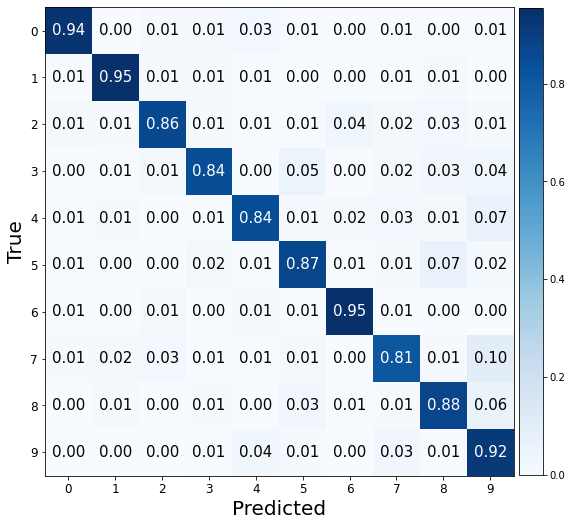

###################

ne: 150, hd:50, wd:0.1, lr: 0.001, bs:256 
Valid Evaluation loss: 0.6583479046821594. f1:0.8568787035187514 acc: 0.8565000295639038 


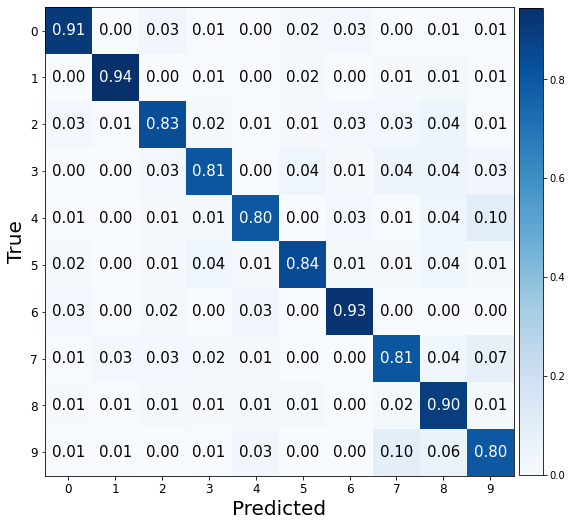

###################

ne: 150, hd:80, wd:0.1, lr: 0.001, bs:256 
Valid Evaluation loss: 0.4618241488933563. f1:0.8913275516999576 acc: 0.8914999961853027 


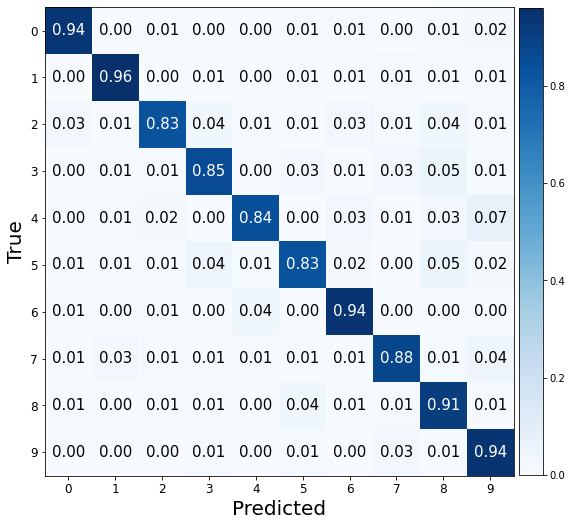

###################

ne: 150, hd:100, wd:0.1, lr: 0.001, bs:256 
Valid Evaluation loss: 0.5739543437957764. f1:0.8923215108768983 acc: 0.8924999833106995 


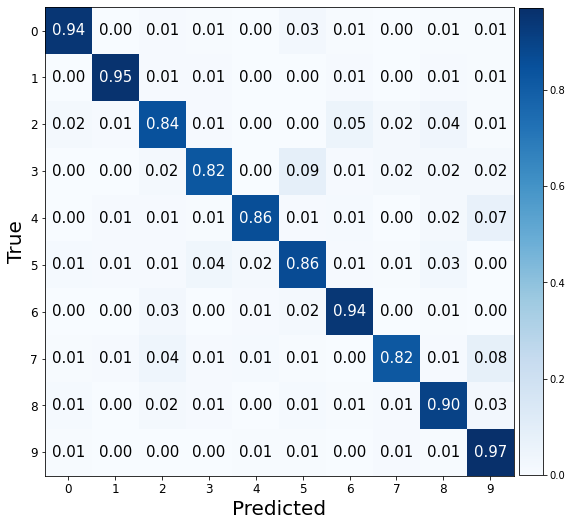

###################

ne: 150, hd:50, wd:0.001, lr: 0.01, bs:256 
Valid Evaluation loss: 1.1620815992355347. f1:0.6639459232512073 acc: 0.671500027179718 


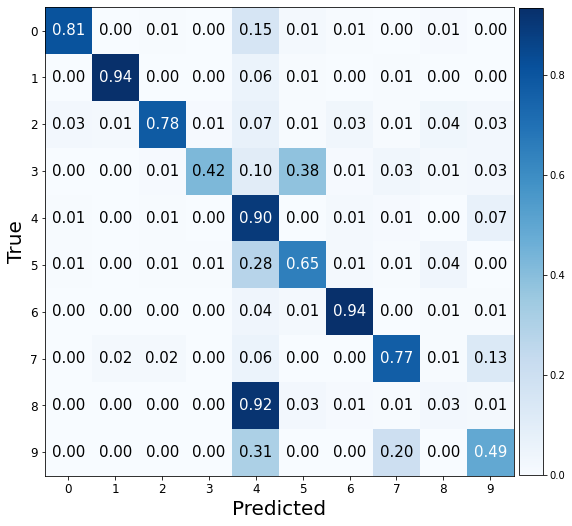

###################

ne: 150, hd:80, wd:0.001, lr: 0.01, bs:256 
Valid Evaluation loss: 1.2268565893173218. f1:0.7217500269754826 acc: 0.7260000109672546 


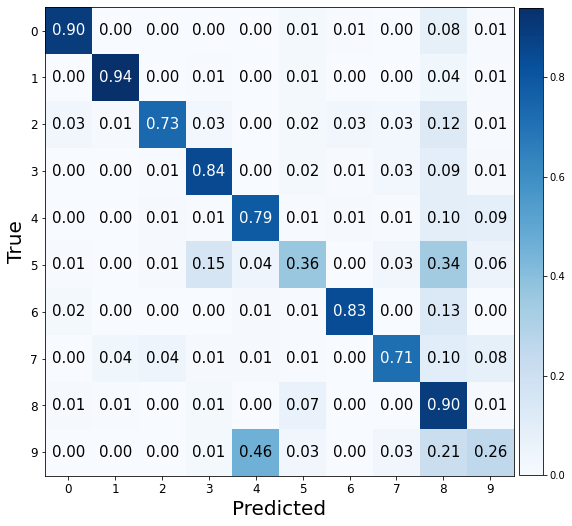

###################

ne: 150, hd:100, wd:0.001, lr: 0.01, bs:256 
Valid Evaluation loss: 1.1119120121002197. f1:0.7057599682745324 acc: 0.7105000019073486 


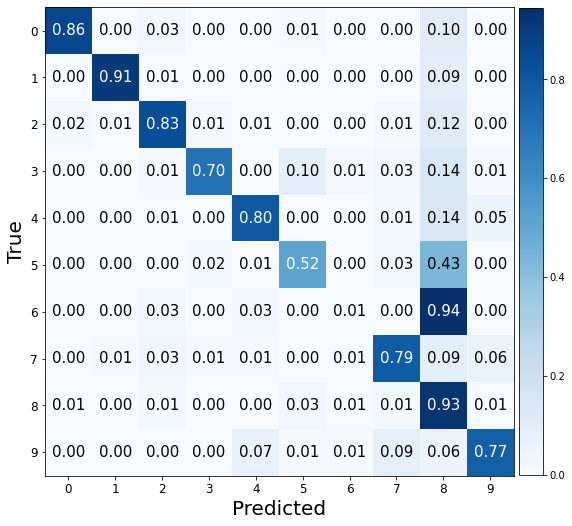

###################

ne: 150, hd:50, wd:0.01, lr: 0.01, bs:256 
Valid Evaluation loss: 1.2739607095718384. f1:0.6035594657831401 acc: 0.6200000047683716 


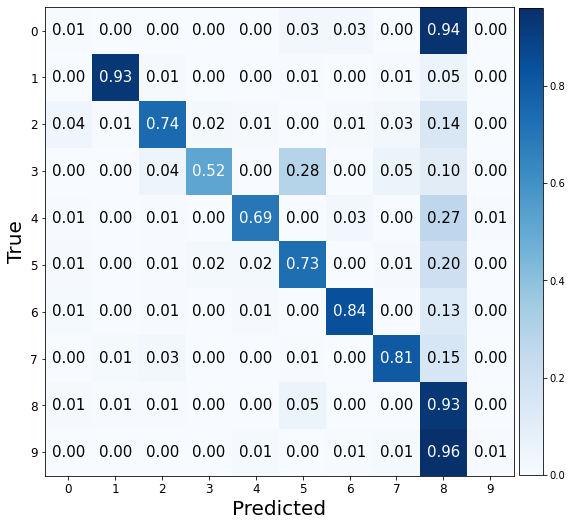

###################

ne: 150, hd:80, wd:0.01, lr: 0.01, bs:256 
Valid Evaluation loss: 1.0487669706344604. f1:0.7746768358419935 acc: 0.7605000138282776 


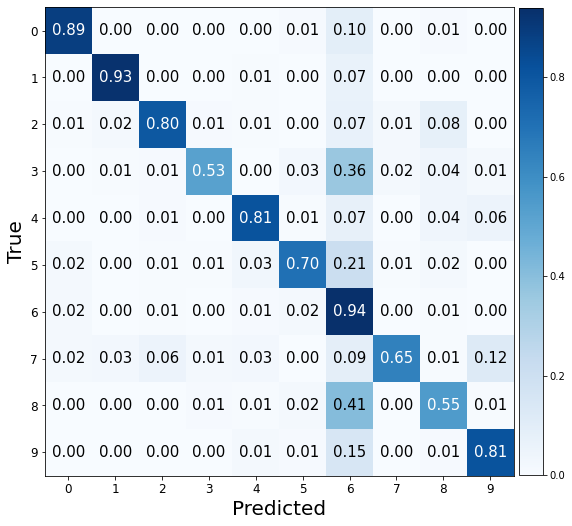

###################

ne: 150, hd:100, wd:0.01, lr: 0.01, bs:256 
Valid Evaluation loss: 1.3818063735961914. f1:0.5624454212262897 acc: 0.5805000066757202 


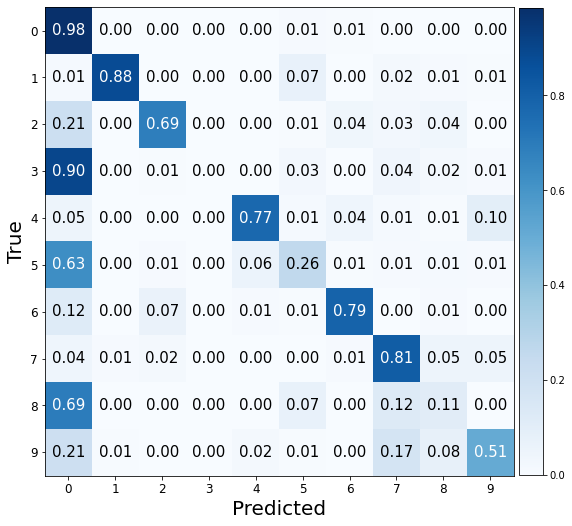

###################

ne: 150, hd:50, wd:0.1, lr: 0.01, bs:256 
Valid Evaluation loss: 0.9766411781311035. f1:0.6614488435908809 acc: 0.6924999952316284 


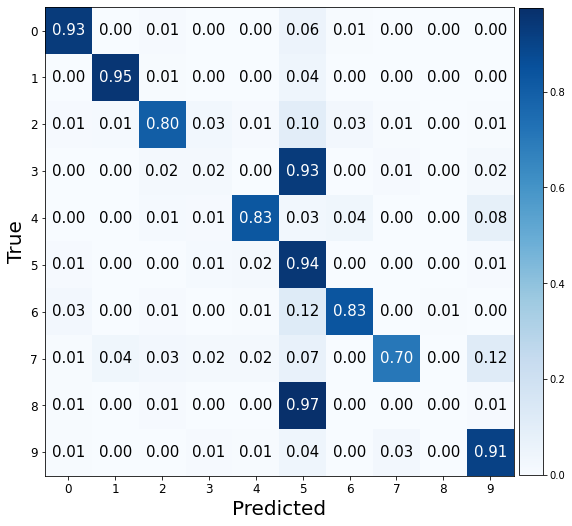

###################

ne: 150, hd:80, wd:0.1, lr: 0.01, bs:256 
Valid Evaluation loss: 0.8735020160675049. f1:0.8295563042419604 acc: 0.8270000219345093 


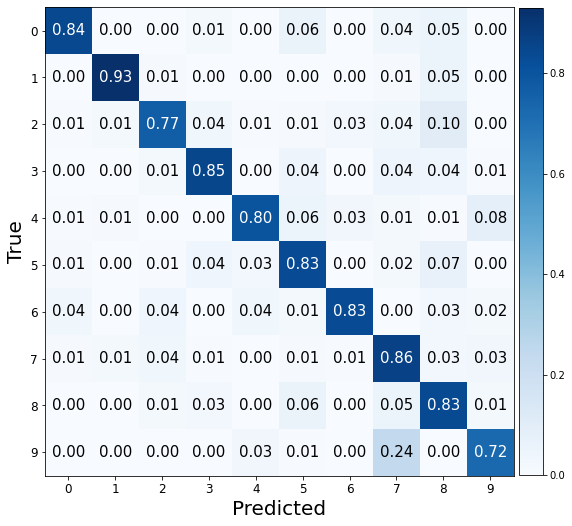

###################

ne: 150, hd:100, wd:0.1, lr: 0.01, bs:256 
Valid Evaluation loss: 1.2747504711151123. f1:0.5645443292019344 acc: 0.5989999771118164 


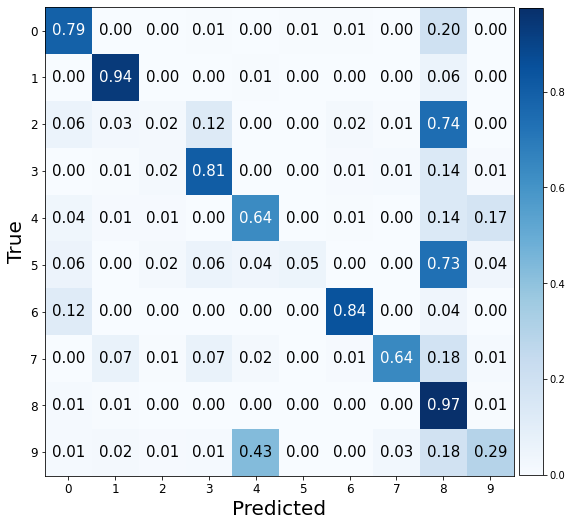

###################

ne: 150, hd:50, wd:0.001, lr: 0.1, bs:256 
Valid Evaluation loss: 2.2894012928009033. f1:0.06742704214696287 acc: 0.13099999725818634 


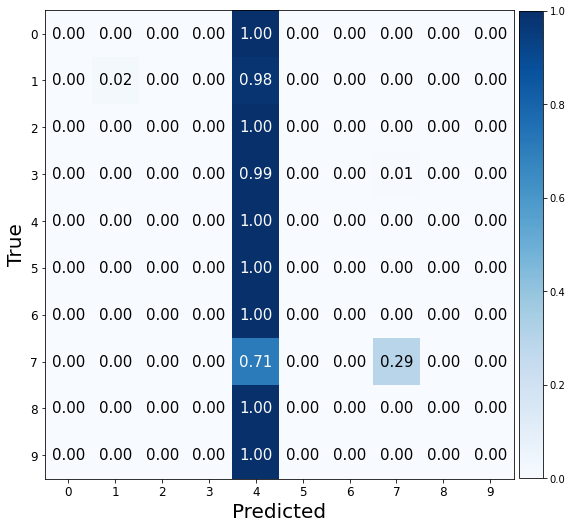

###################

ne: 150, hd:80, wd:0.001, lr: 0.1, bs:256 
Valid Evaluation loss: 3.0163512229919434. f1:0.1230048043205414 acc: 0.17399999499320984 


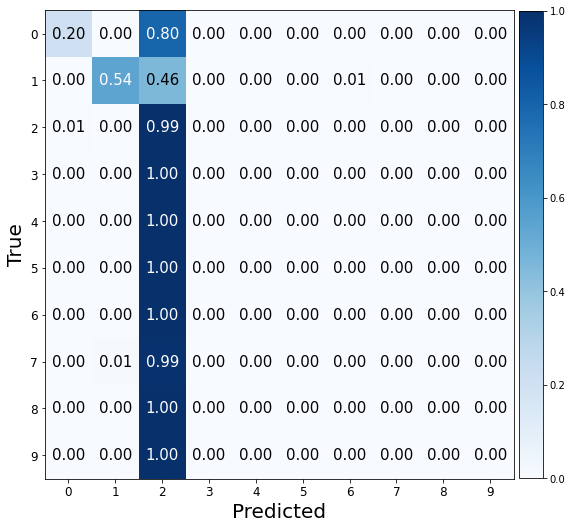

###################

ne: 150, hd:100, wd:0.001, lr: 0.1, bs:256 
Valid Evaluation loss: 2.54677414894104. f1:0.19553026346387845 acc: 0.24950000643730164 


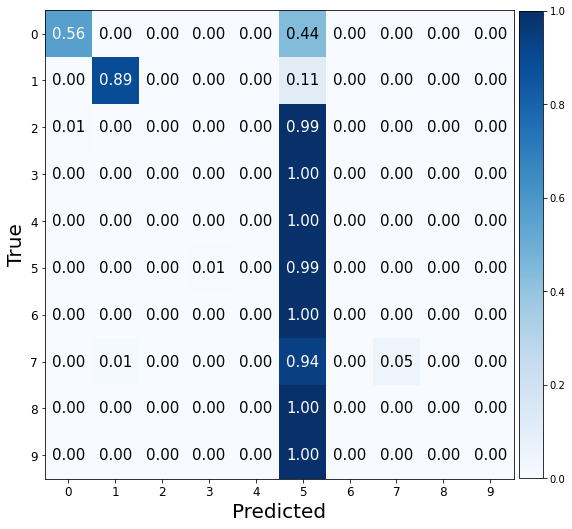

###################

ne: 150, hd:50, wd:0.01, lr: 0.1, bs:256 
Valid Evaluation loss: 2.436546564102173. f1:0.15722970627283617 acc: 0.21299999952316284 


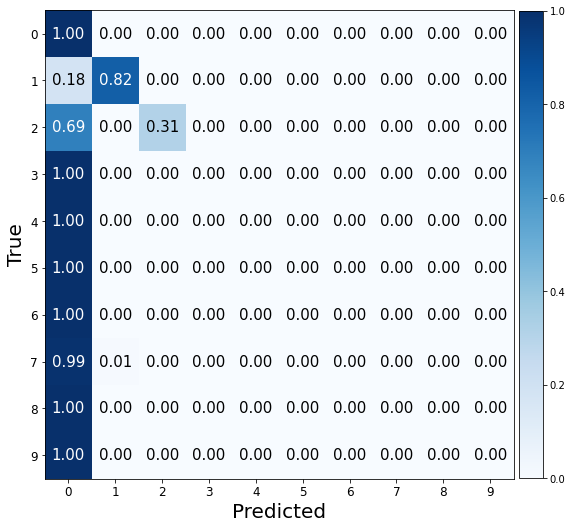

###################

ne: 150, hd:80, wd:0.01, lr: 0.1, bs:256 
Valid Evaluation loss: 2.3025851249694824. f1:0.01818181818181818 acc: 0.10000000149011612 


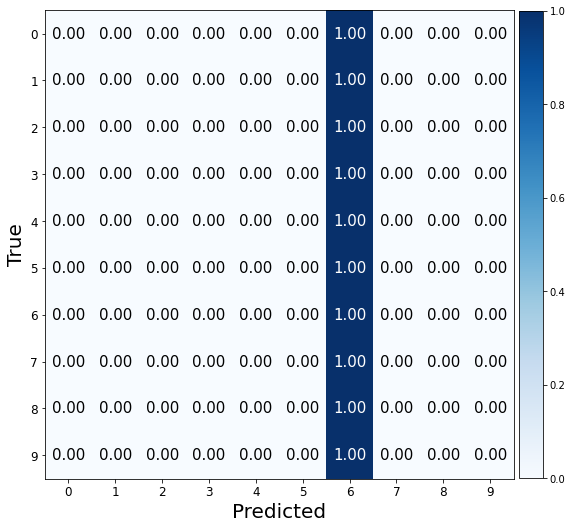

###################

ne: 150, hd:100, wd:0.01, lr: 0.1, bs:256 
Valid Evaluation loss: 2.6519057750701904. f1:0.18865306305262525 acc: 0.22699999809265137 


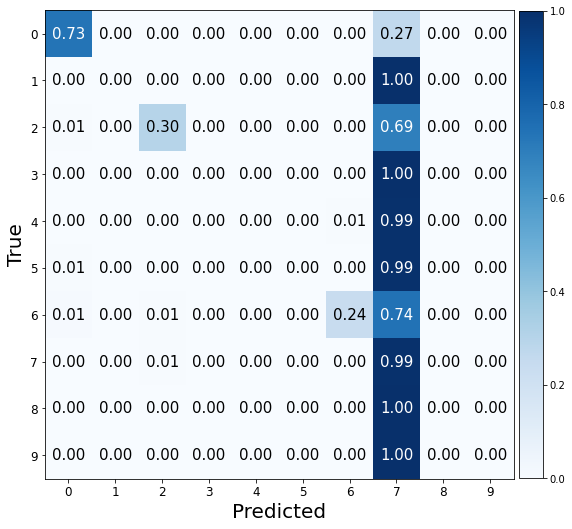

###################

ne: 150, hd:50, wd:0.1, lr: 0.1, bs:256 
Valid Evaluation loss: 2.292026996612549. f1:0.07282360167625082 acc: 0.13600000739097595 


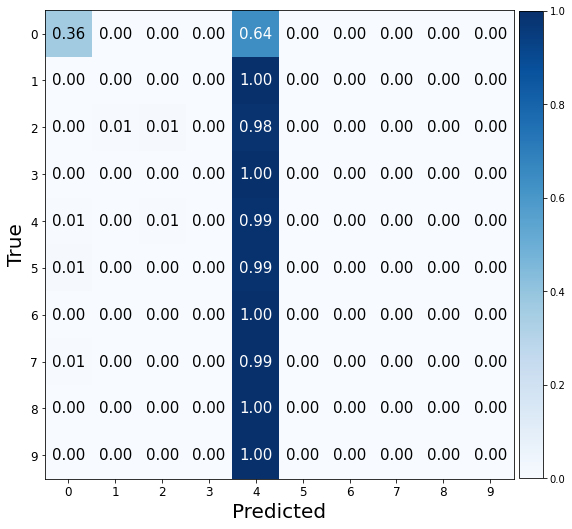

###################

ne: 150, hd:80, wd:0.1, lr: 0.1, bs:256 
Valid Evaluation loss: 2.0721516609191895. f1:0.14671438852923163 acc: 0.20800000429153442 


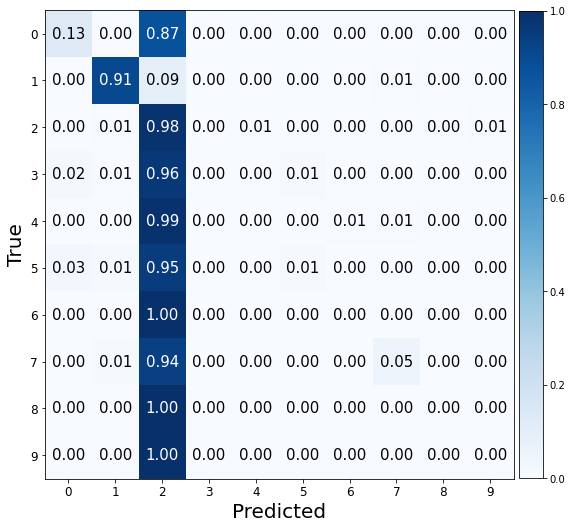

###################

ne: 150, hd:100, wd:0.1, lr: 0.1, bs:256 
Valid Evaluation loss: 2.362441301345825. f1:0.08646247808485383 acc: 0.1404999941587448 


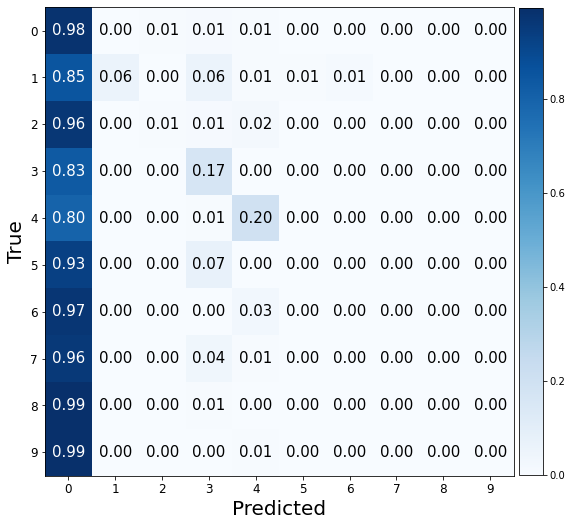

###################

ne: 150, hd:50, wd:0.001, lr: 0.001, bs:512 
Valid Evaluation loss: 0.7202703356742859. f1:0.8546986394308572 acc: 0.8544999957084656 


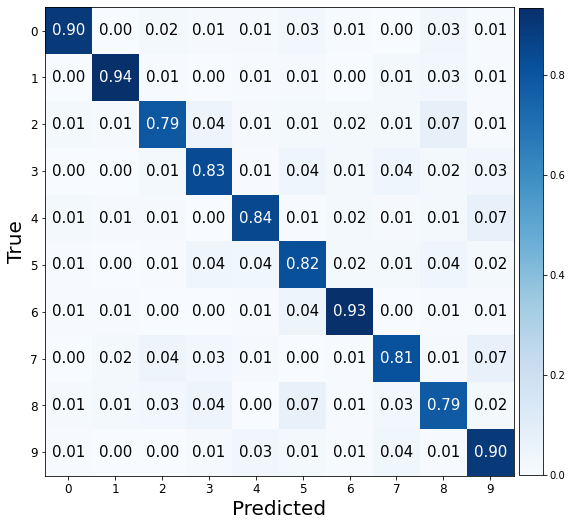

###################

ne: 150, hd:80, wd:0.001, lr: 0.001, bs:512 
Valid Evaluation loss: 0.6247891783714294. f1:0.8834511851848591 acc: 0.8834999799728394 


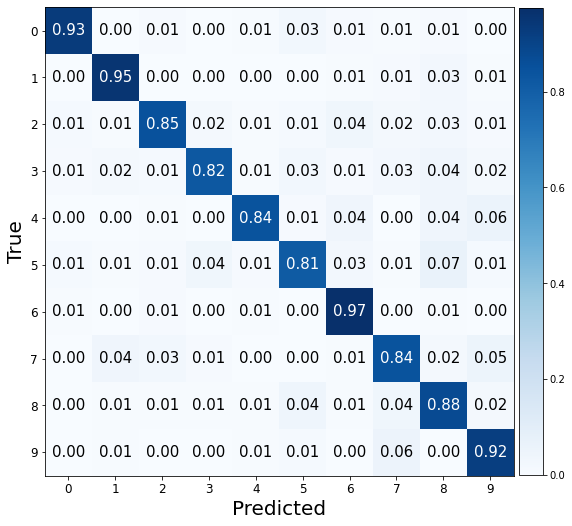

###################

ne: 150, hd:100, wd:0.001, lr: 0.001, bs:512 
Valid Evaluation loss: 0.693909227848053. f1:0.8783159533937189 acc: 0.8790000081062317 


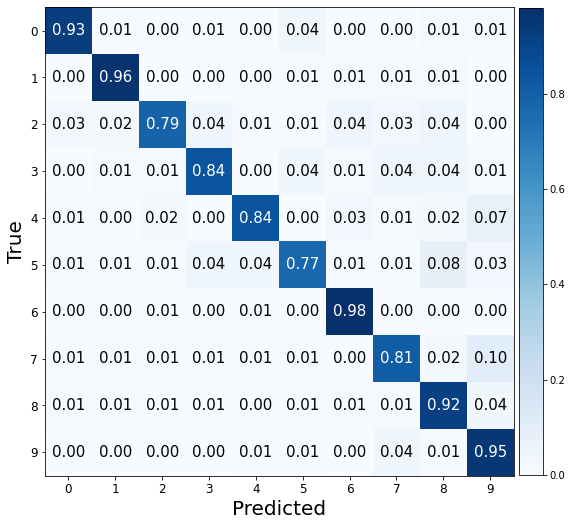

###################

ne: 150, hd:50, wd:0.01, lr: 0.001, bs:512 
Valid Evaluation loss: 0.7140357494354248. f1:0.8646742564613419 acc: 0.8650000095367432 


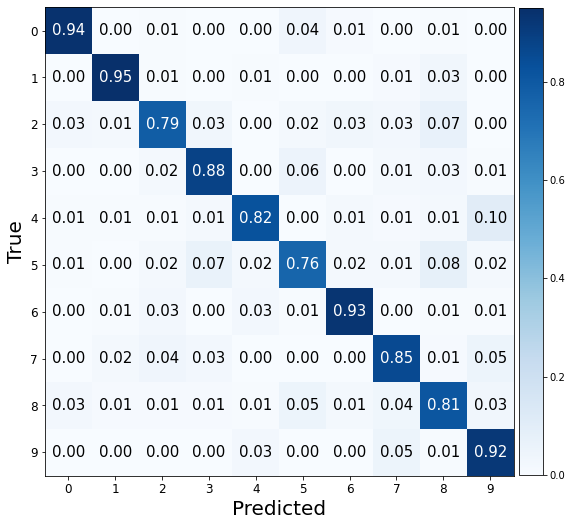

###################

ne: 150, hd:80, wd:0.01, lr: 0.001, bs:512 
Valid Evaluation loss: 0.6057249903678894. f1:0.8868636024942266 acc: 0.8870000243186951 


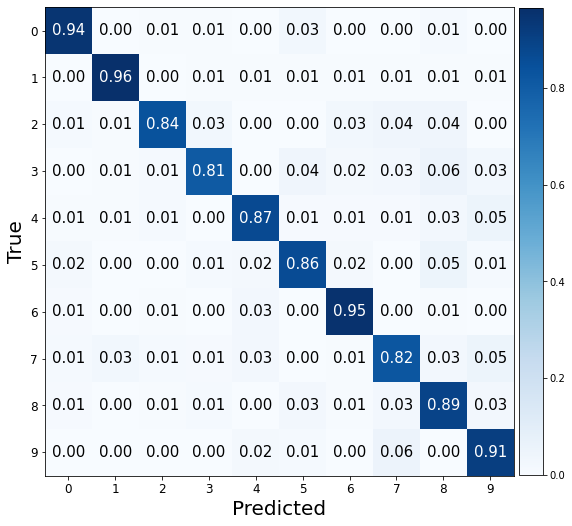

###################

ne: 150, hd:100, wd:0.01, lr: 0.001, bs:512 
Valid Evaluation loss: 0.5800647139549255. f1:0.8989820900383243 acc: 0.8989999890327454 


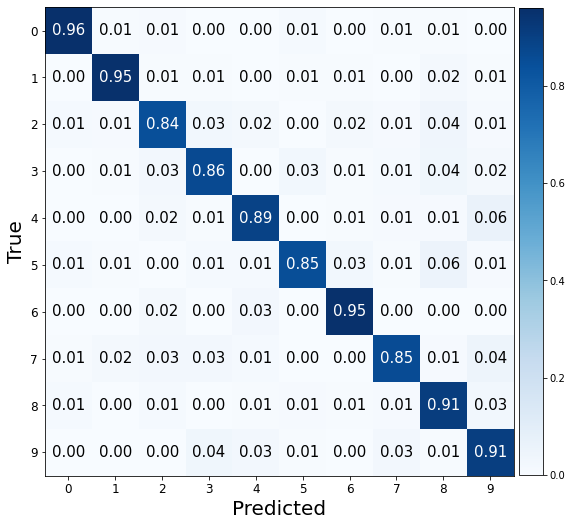

###################

ne: 150, hd:50, wd:0.1, lr: 0.001, bs:512 
Valid Evaluation loss: 0.5842227935791016. f1:0.8621819271618365 acc: 0.862500011920929 


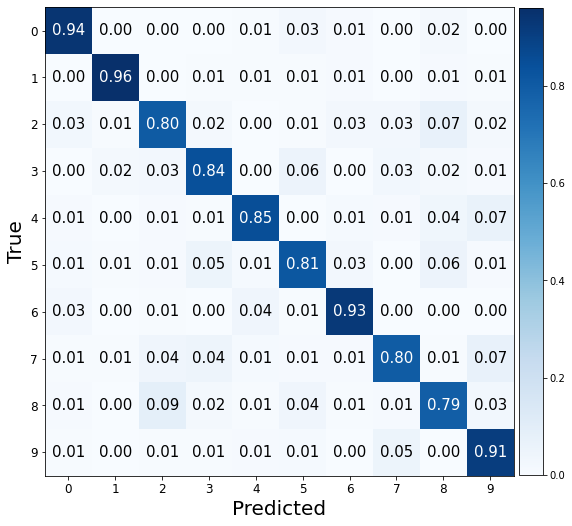

###################

ne: 150, hd:80, wd:0.1, lr: 0.001, bs:512 
Valid Evaluation loss: 0.5965627431869507. f1:0.875177777510773 acc: 0.8755000233650208 


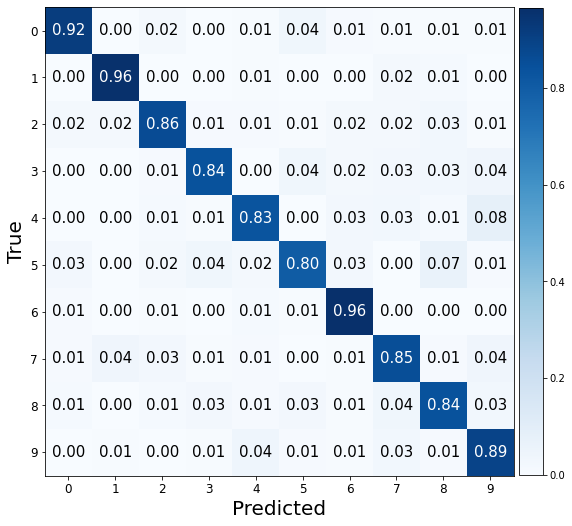

###################

ne: 150, hd:100, wd:0.1, lr: 0.001, bs:512 
Valid Evaluation loss: 0.4849463999271393. f1:0.9011872038395525 acc: 0.9010000228881836 


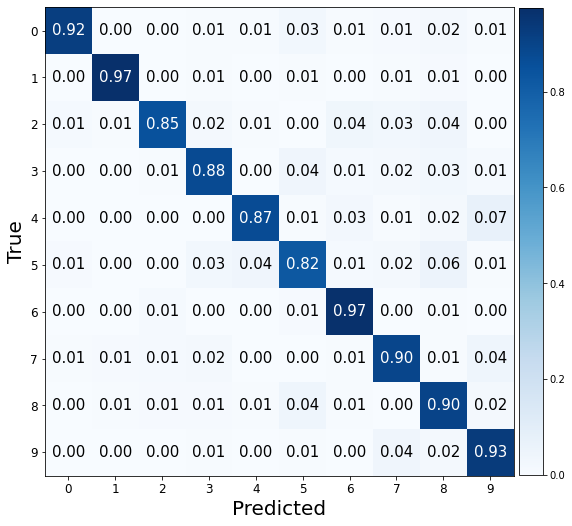

###################

ne: 150, hd:50, wd:0.001, lr: 0.01, bs:512 
Valid Evaluation loss: 1.407633900642395. f1:0.5190515526630138 acc: 0.5590000152587891 


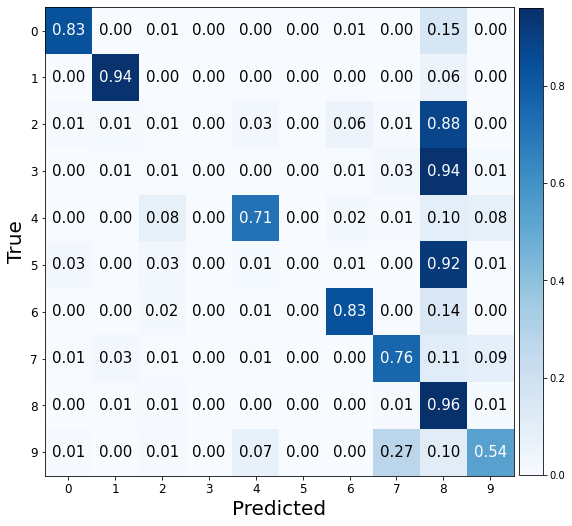

###################

ne: 150, hd:80, wd:0.001, lr: 0.01, bs:512 
Valid Evaluation loss: 0.9470828175544739. f1:0.7947755016701776 acc: 0.7950000166893005 


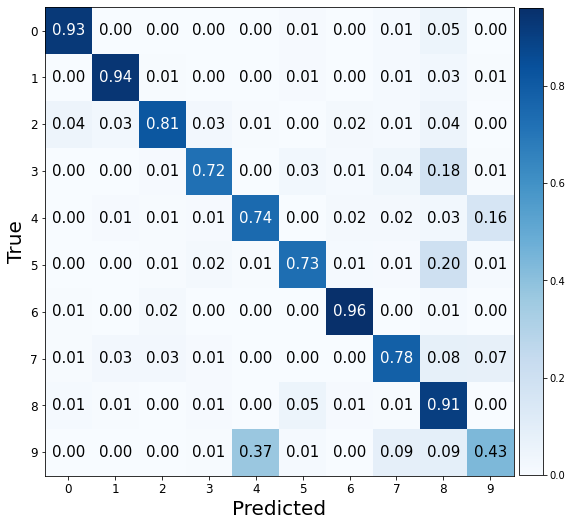

###################

ne: 150, hd:100, wd:0.001, lr: 0.01, bs:512 
Valid Evaluation loss: 1.2182155847549438. f1:0.6964679253541088 acc: 0.7009999752044678 


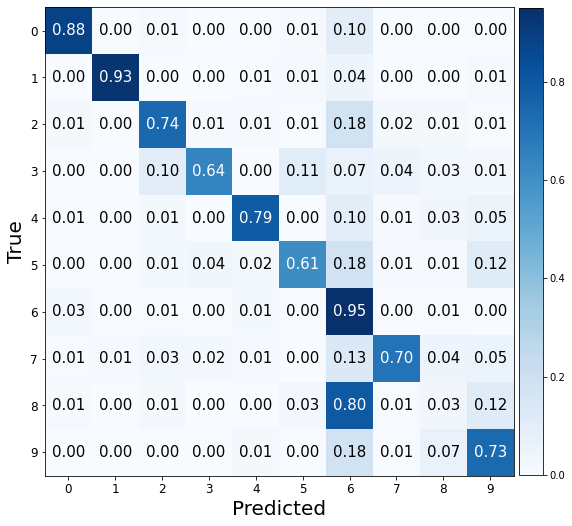

###################

ne: 150, hd:50, wd:0.01, lr: 0.01, bs:512 
Valid Evaluation loss: 1.4129798412322998. f1:0.49347078757900037 acc: 0.5394999980926514 


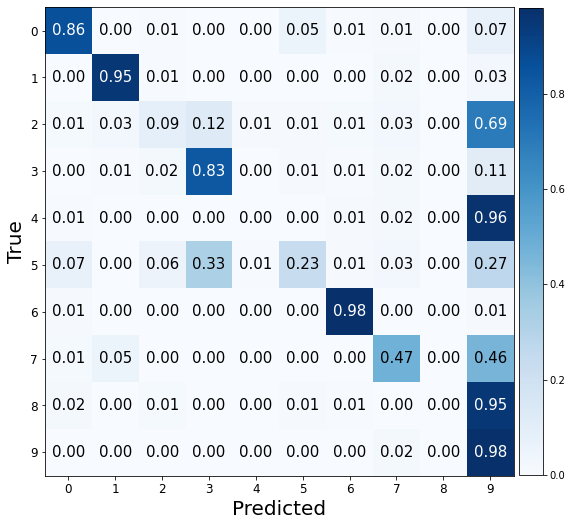

###################

ne: 150, hd:80, wd:0.01, lr: 0.01, bs:512 
Valid Evaluation loss: 1.2895331382751465. f1:0.6142365502139836 acc: 0.6309999823570251 


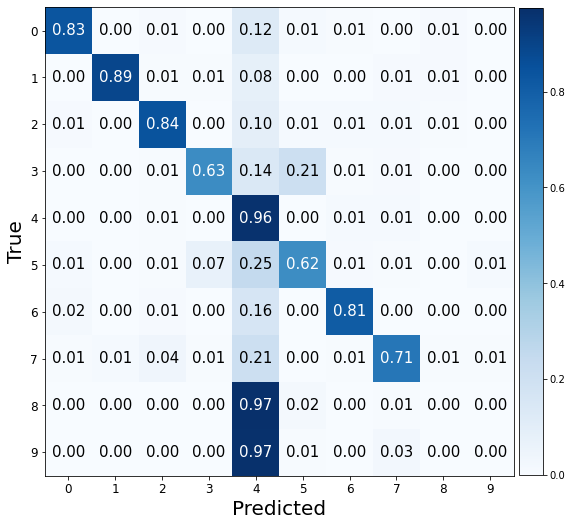

###################

ne: 150, hd:100, wd:0.01, lr: 0.01, bs:512 
Valid Evaluation loss: 0.9707233905792236. f1:0.7707063677483528 acc: 0.7645000219345093 


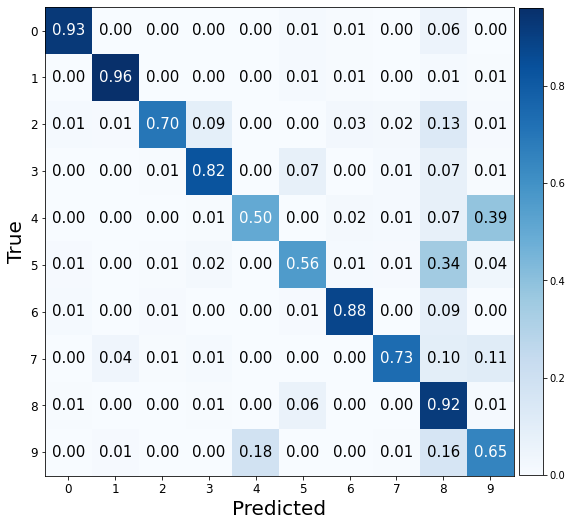

###################

ne: 150, hd:50, wd:0.1, lr: 0.01, bs:512 
Valid Evaluation loss: 1.812699794769287. f1:0.2634941868799454 acc: 0.32749998569488525 


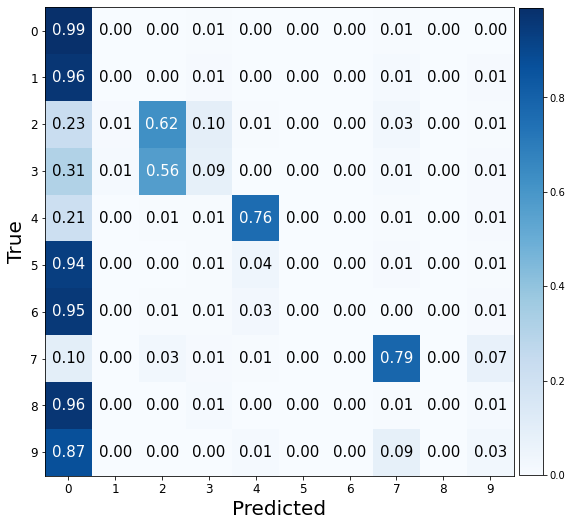

###################

ne: 150, hd:80, wd:0.1, lr: 0.01, bs:512 
Valid Evaluation loss: 0.7826507091522217. f1:0.7583879261350546 acc: 0.7664999961853027 


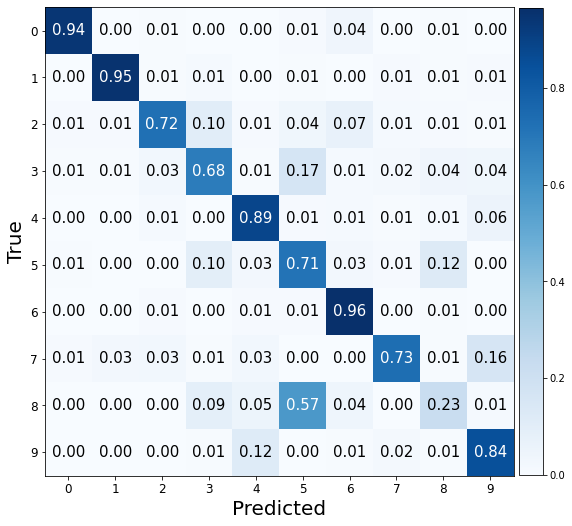

###################

ne: 150, hd:100, wd:0.1, lr: 0.01, bs:512 
Valid Evaluation loss: 0.7393827438354492. f1:0.7588082695158366 acc: 0.7680000066757202 


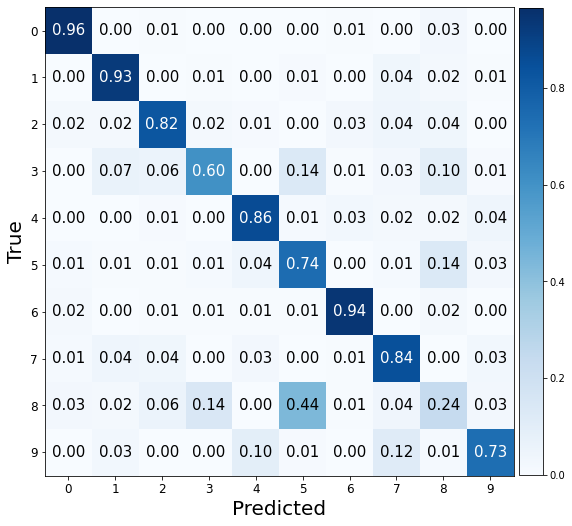

###################

ne: 150, hd:50, wd:0.001, lr: 0.1, bs:512 
Valid Evaluation loss: 4.318444728851318. f1:0.15257006492894995 acc: 0.1914999932050705 


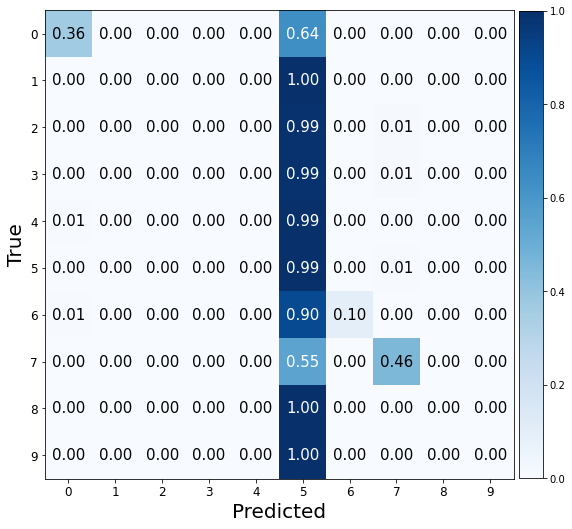

###################

ne: 150, hd:80, wd:0.001, lr: 0.1, bs:512 
Valid Evaluation loss: 7.394865036010742. f1:0.22335311911312178 acc: 0.2630000114440918 


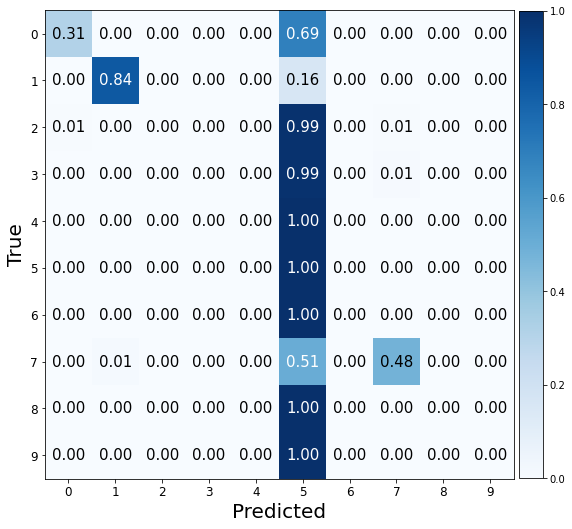

###################

ne: 150, hd:100, wd:0.001, lr: 0.1, bs:512 
Valid Evaluation loss: 2.2968149185180664. f1:0.02310128340463359 acc: 0.10249999910593033 


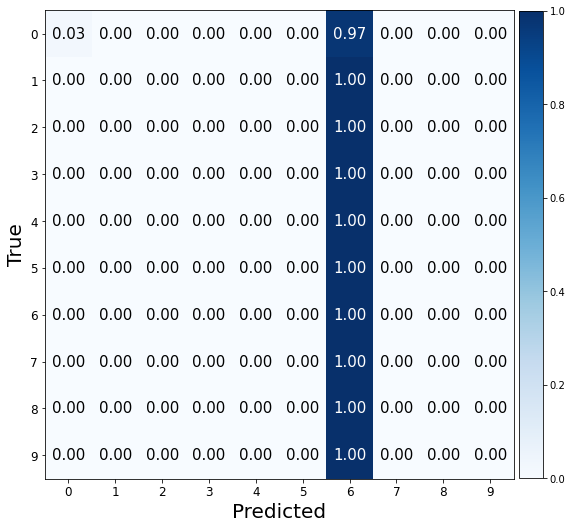

###################

ne: 150, hd:50, wd:0.01, lr: 0.1, bs:512 
Valid Evaluation loss: 2.3025856018066406. f1:0.01818181818181818 acc: 0.10000000149011612 


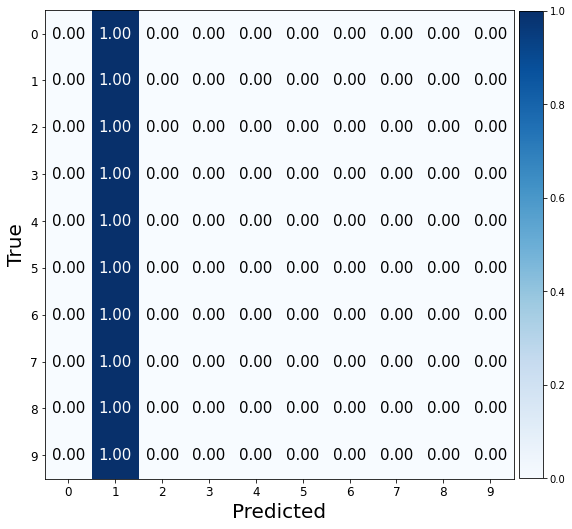

###################

ne: 150, hd:80, wd:0.01, lr: 0.1, bs:512 
Valid Evaluation loss: 2.9288034439086914. f1:0.09201384401944103 acc: 0.1574999988079071 


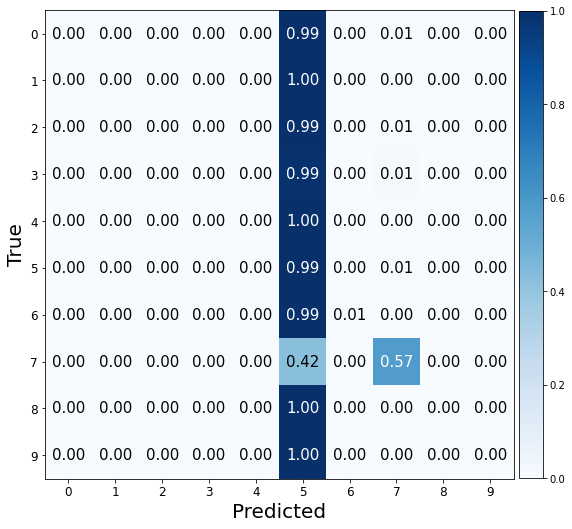

###################

ne: 150, hd:100, wd:0.01, lr: 0.1, bs:512 
Valid Evaluation loss: 2.1292777061462402. f1:0.11826092484874176 acc: 0.19200000166893005 


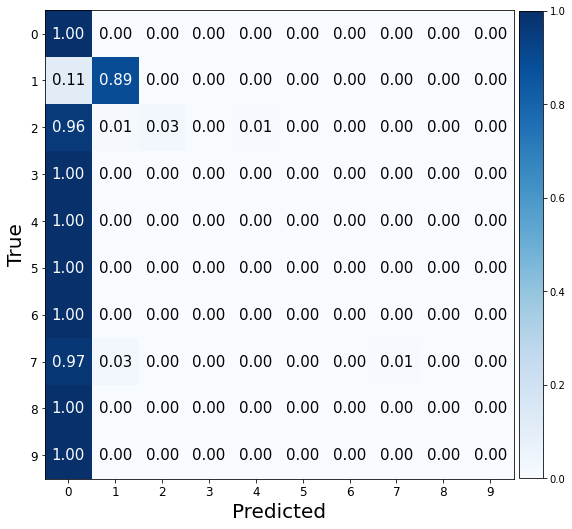

###################

ne: 150, hd:50, wd:0.1, lr: 0.1, bs:512 
Valid Evaluation loss: 2.3973004817962646. f1:0.1842142711916424 acc: 0.24950000643730164 


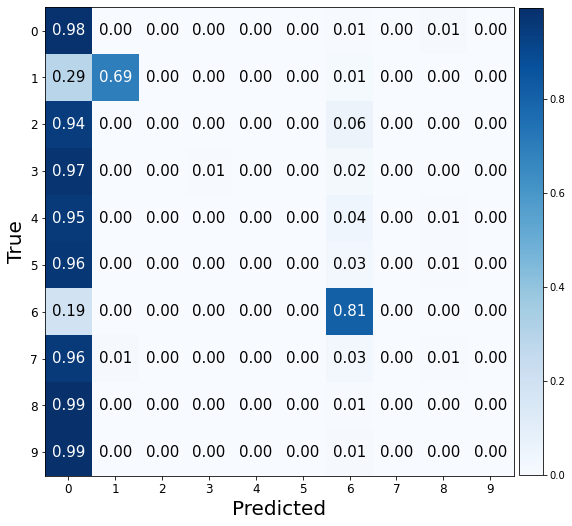

###################

ne: 150, hd:80, wd:0.1, lr: 0.1, bs:512 
Valid Evaluation loss: 2.255744218826294. f1:0.0839190451606559 acc: 0.15049999952316284 


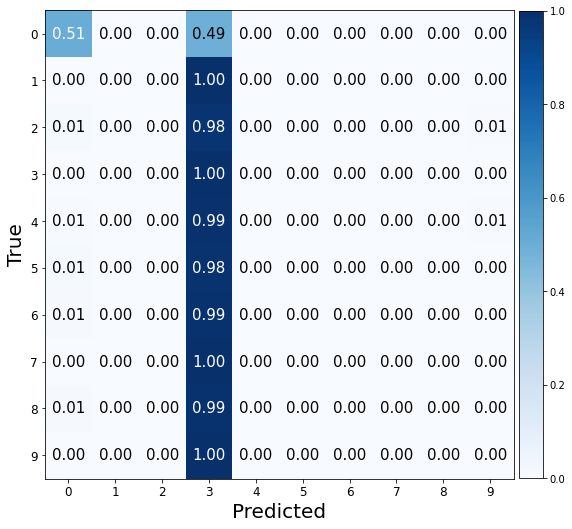

###################

ne: 150, hd:100, wd:0.1, lr: 0.1, bs:512 
Valid Evaluation loss: 1.969148874282837. f1:0.30225156421660376 acc: 0.3075000047683716 


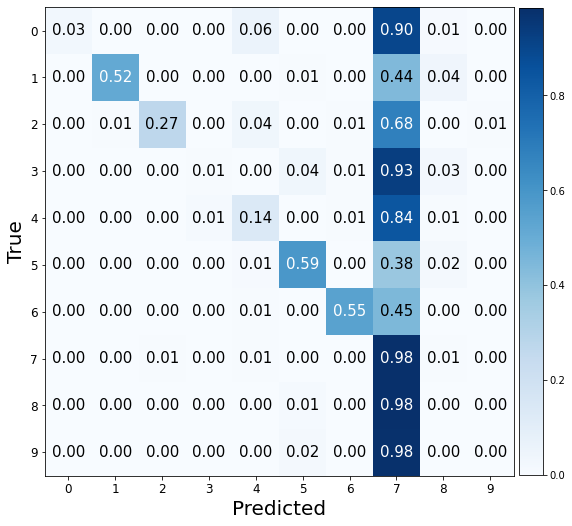

###################

ne: 150, hd:50, wd:0.001, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.673192024230957. f1:0.8684069624538167 acc: 0.8684999942779541 


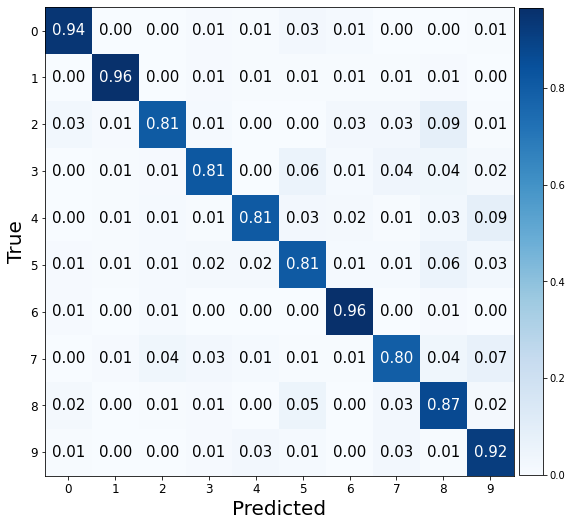

###################

ne: 150, hd:80, wd:0.001, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.6583002805709839. f1:0.874473182894534 acc: 0.8744999766349792 


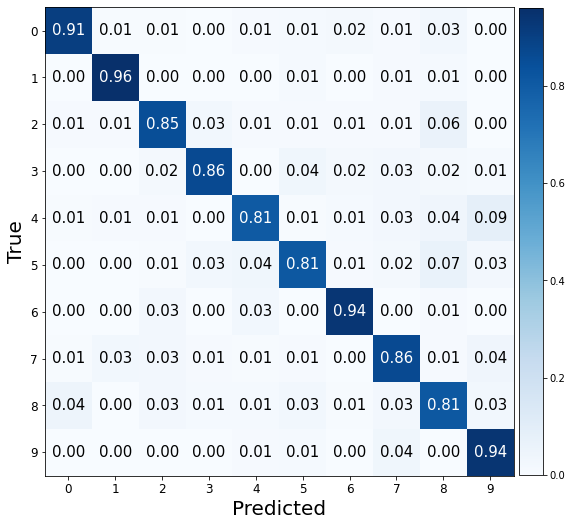

###################

ne: 150, hd:100, wd:0.001, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.6083104014396667. f1:0.8867085730723965 acc: 0.8870000243186951 


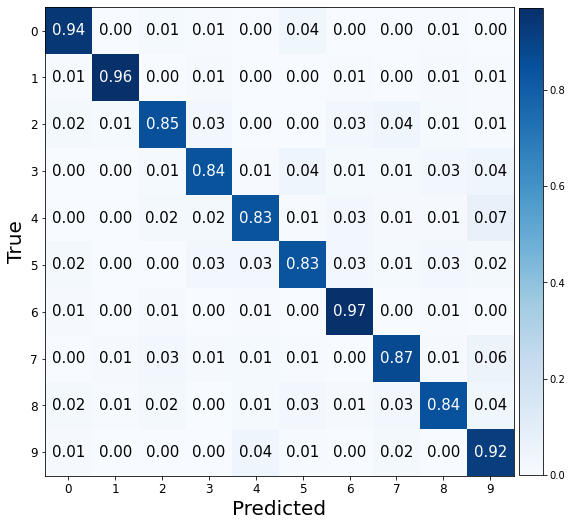

###################

ne: 150, hd:50, wd:0.01, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.7941628694534302. f1:0.8799750951144298 acc: 0.8799999952316284 


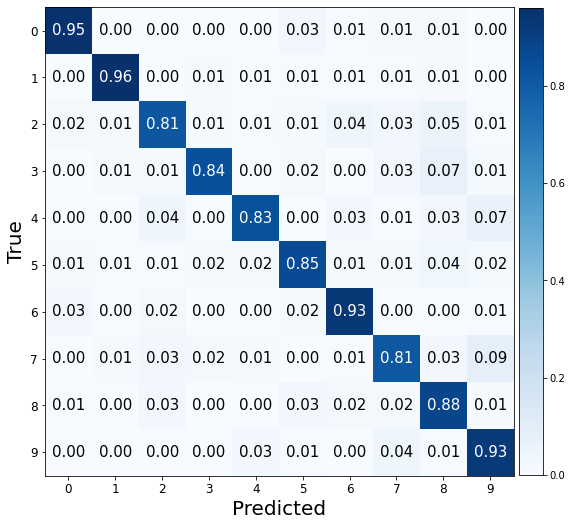

###################

ne: 150, hd:80, wd:0.01, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.584763765335083. f1:0.8956103069410727 acc: 0.8960000276565552 


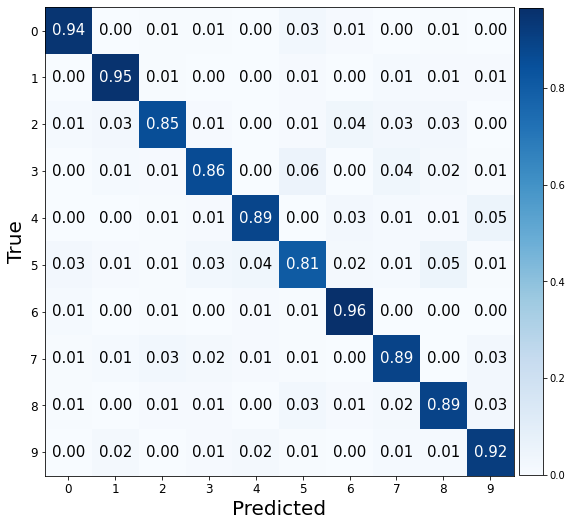

###################

ne: 150, hd:100, wd:0.01, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.6466923356056213. f1:0.883556616952594 acc: 0.8834999799728394 


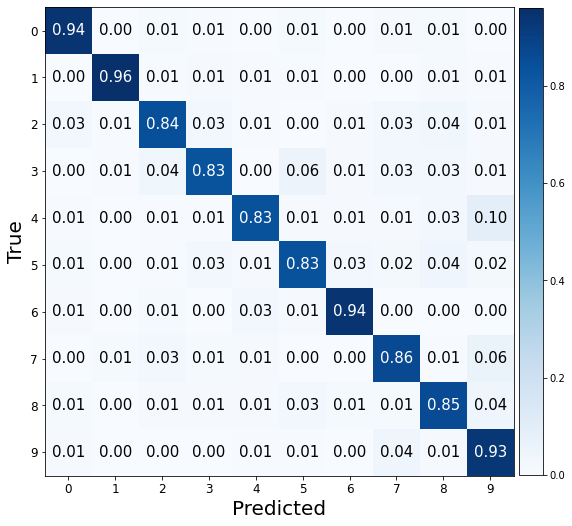

###################

ne: 150, hd:50, wd:0.1, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.5221204161643982. f1:0.8861139204072004 acc: 0.8865000009536743 


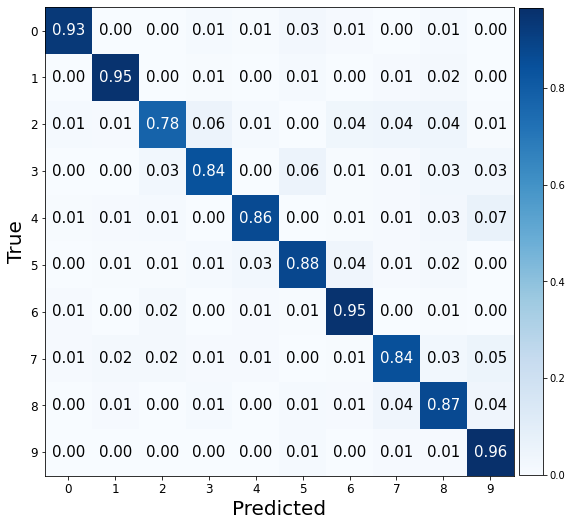

###################

ne: 150, hd:80, wd:0.1, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.5739798545837402. f1:0.8965178754296552 acc: 0.8964999914169312 


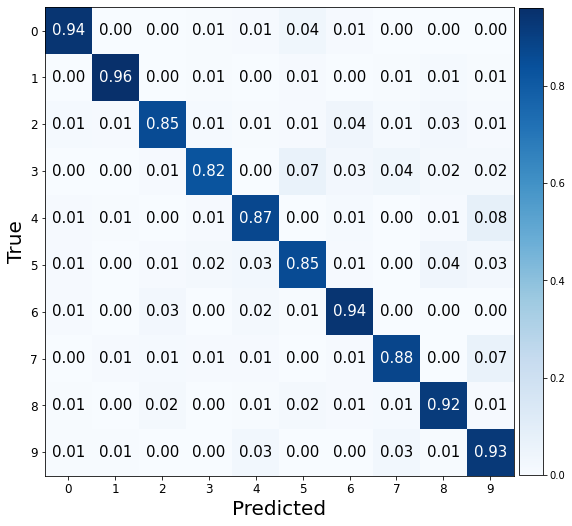

###################

ne: 150, hd:100, wd:0.1, lr: 0.001, bs:1024 
Valid Evaluation loss: 0.5407979488372803. f1:0.8856717200686305 acc: 0.8855000138282776 


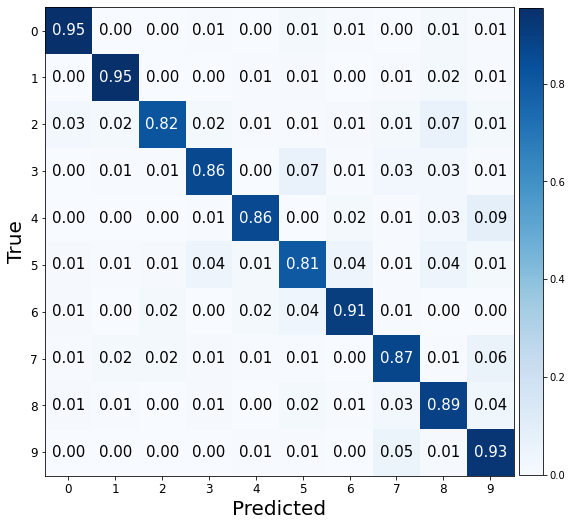

###################

ne: 150, hd:50, wd:0.001, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.3678910732269287. f1:0.6583224024536263 acc: 0.6694999933242798 


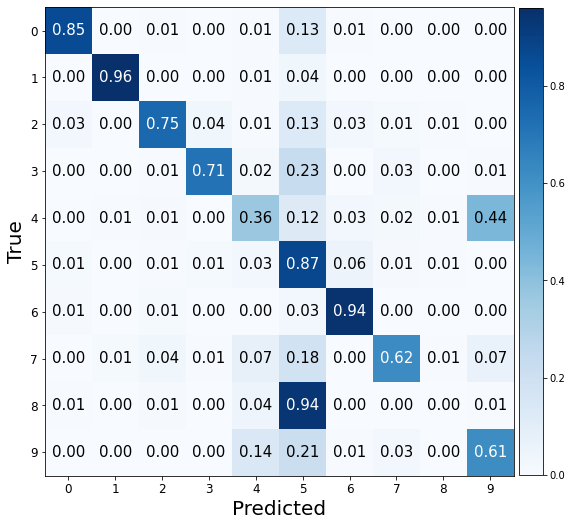

###################

ne: 150, hd:80, wd:0.001, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.817449688911438. f1:0.8075316409972478 acc: 0.8069999814033508 


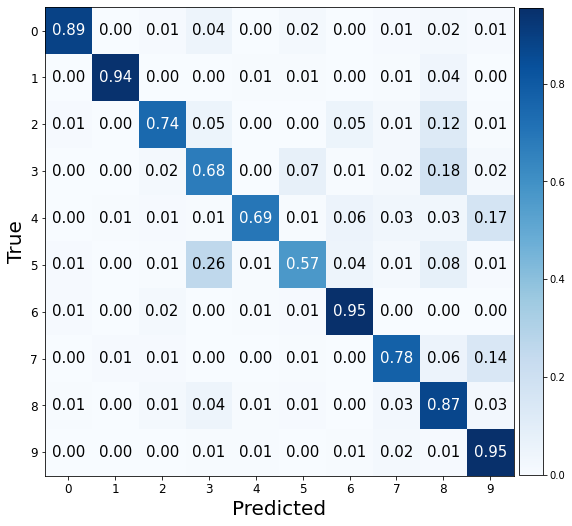

###################

ne: 150, hd:100, wd:0.001, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.3790265321731567. f1:0.5414222136544204 acc: 0.5690000057220459 


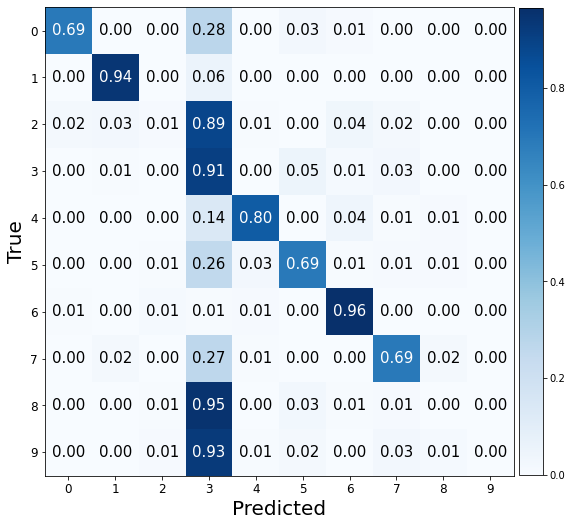

###################

ne: 150, hd:50, wd:0.01, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.1158140897750854. f1:0.6320368943319591 acc: 0.6460000276565552 


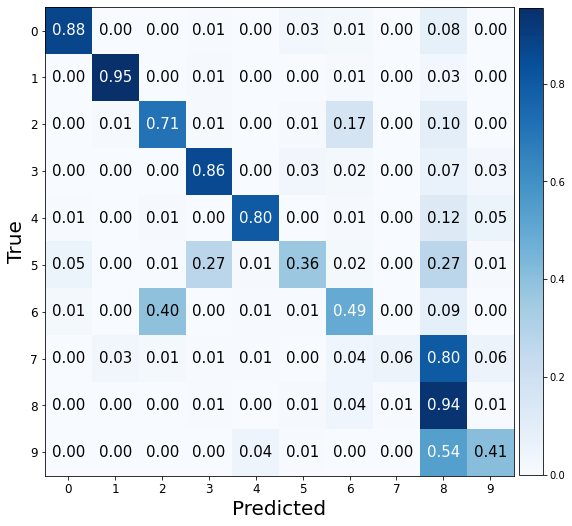

###################

ne: 150, hd:80, wd:0.01, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.9094761610031128. f1:0.8285622028092432 acc: 0.8270000219345093 


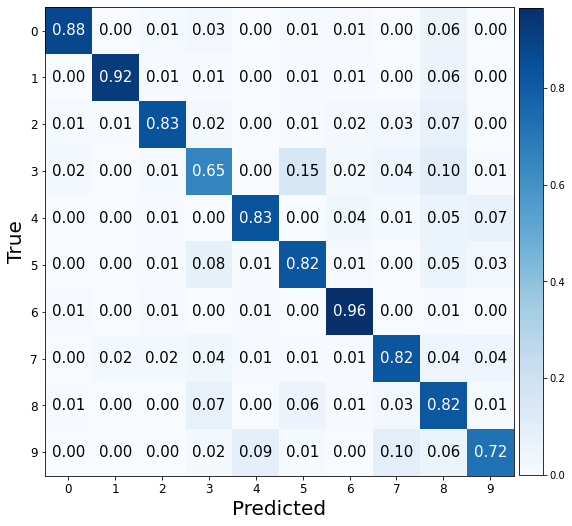

###################

ne: 150, hd:100, wd:0.01, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.8982269763946533. f1:0.7855068905146322 acc: 0.7839999794960022 


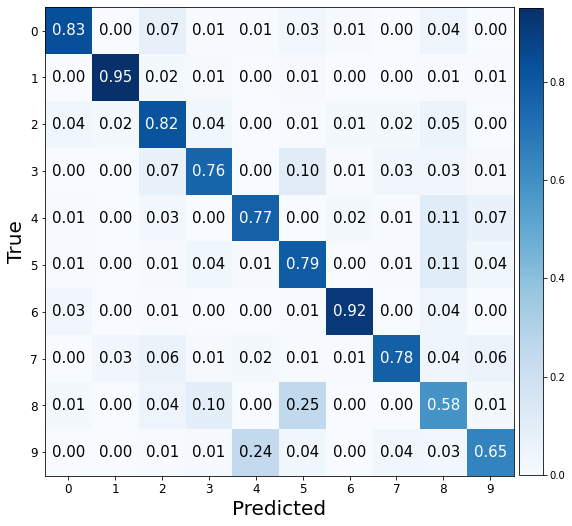

###################

ne: 150, hd:50, wd:0.1, lr: 0.01, bs:1024 
Valid Evaluation loss: 1.9807536602020264. f1:0.1967408731114848 acc: 0.2745000123977661 


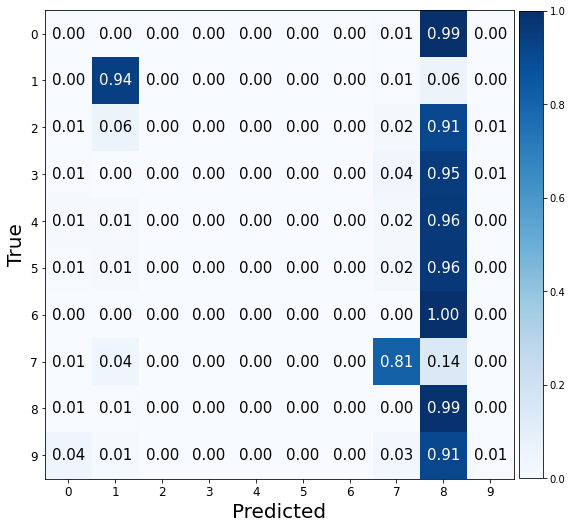

###################

ne: 150, hd:80, wd:0.1, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.8787230253219604. f1:0.7630498178046773 acc: 0.762499988079071 


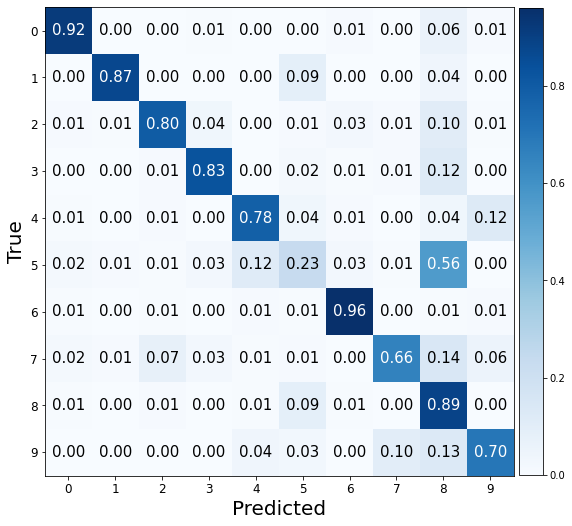

###################

ne: 150, hd:100, wd:0.1, lr: 0.01, bs:1024 
Valid Evaluation loss: 0.7156240940093994. f1:0.8710761763362094 acc: 0.8715000152587891 


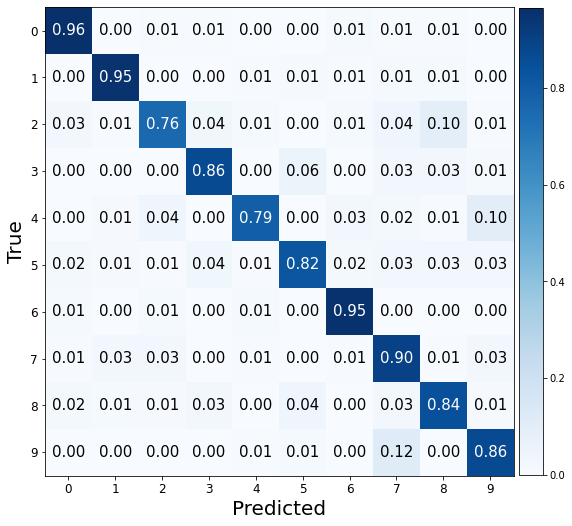

###################

ne: 150, hd:50, wd:0.001, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.3069145679473877. f1:0.018190086402910415 acc: 0.10000000149011612 


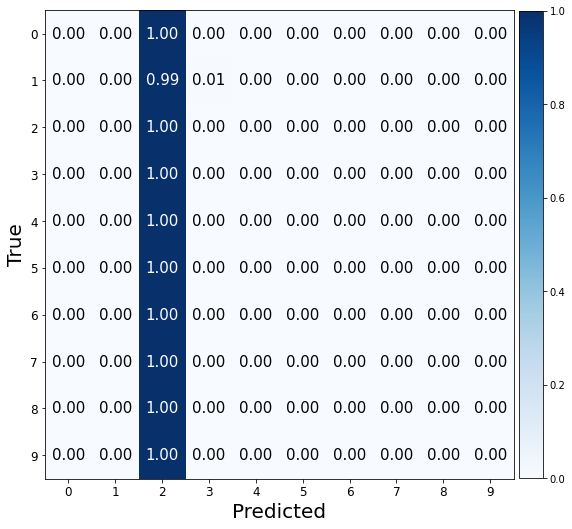

###################

ne: 150, hd:80, wd:0.001, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.910273790359497. f1:0.10569049735031763 acc: 0.1704999953508377 


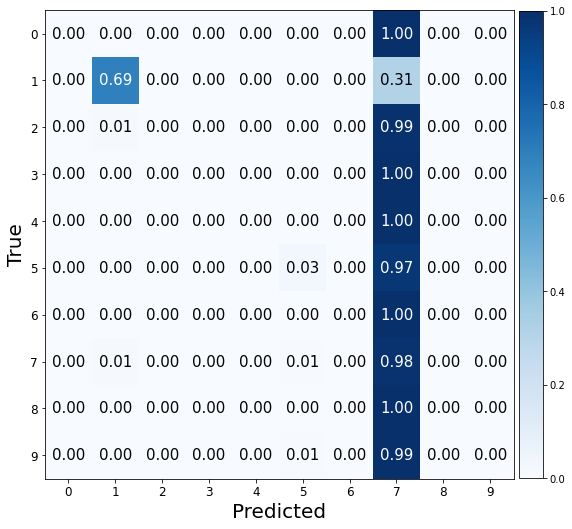

###################

ne: 150, hd:100, wd:0.001, lr: 0.1, bs:1024 
Valid Evaluation loss: 4.137820720672607. f1:0.18059280036724754 acc: 0.226500004529953 


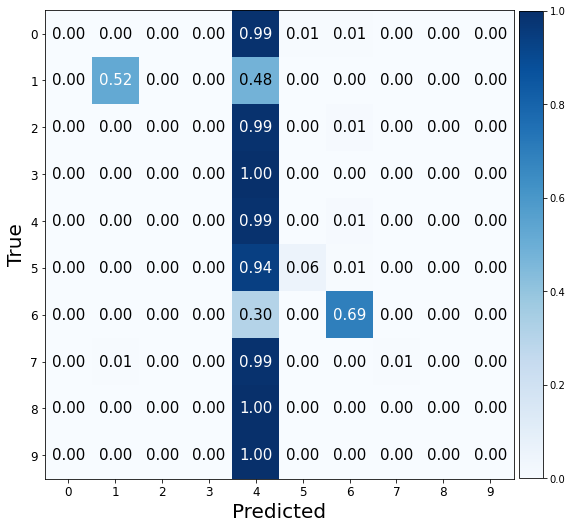

###################

ne: 150, hd:50, wd:0.01, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.2898192405700684. f1:0.17451974337144444 acc: 0.226500004529953 


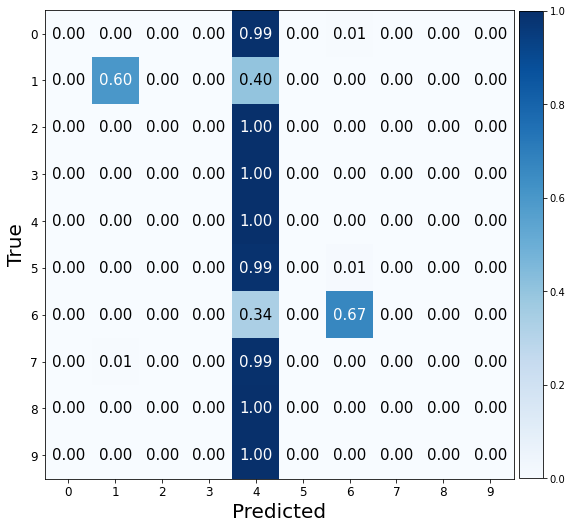

###################

ne: 150, hd:80, wd:0.01, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.2533936500549316. f1:0.15444508374888122 acc: 0.2094999998807907 


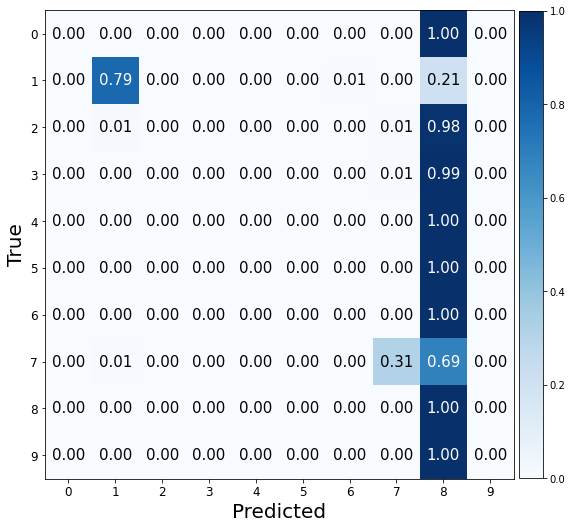

###################

ne: 150, hd:100, wd:0.01, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.3263256549835205. f1:0.10553239605471094 acc: 0.17649999260902405 


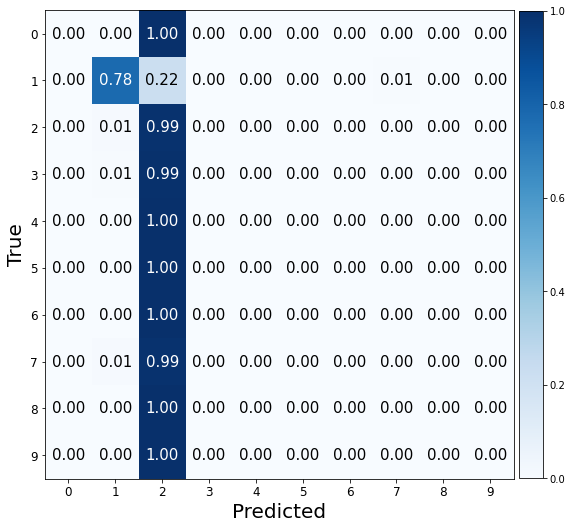

###################

ne: 150, hd:50, wd:0.1, lr: 0.1, bs:1024 
Valid Evaluation loss: 3.4611034393310547. f1:0.07302395774382192 acc: 0.16850000619888306 


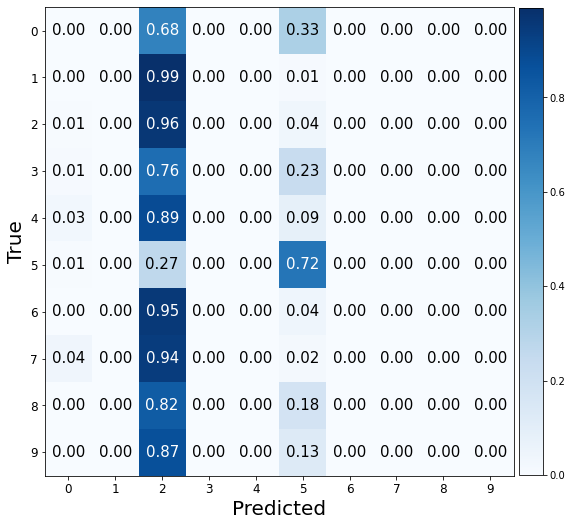

###################

ne: 150, hd:80, wd:0.1, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.1767139434814453. f1:0.15991644454716405 acc: 0.19499999284744263 


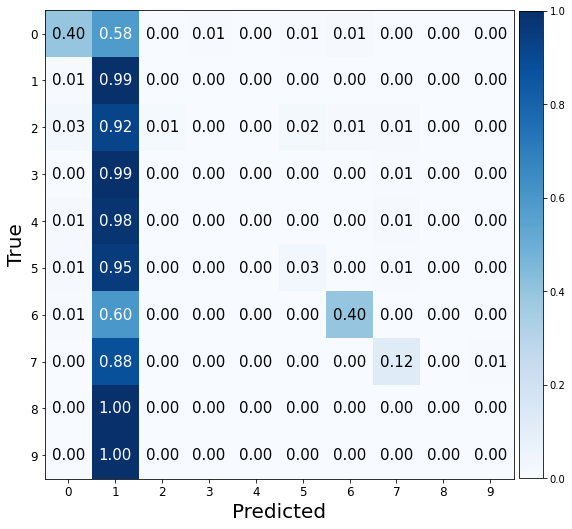

###################

ne: 150, hd:100, wd:0.1, lr: 0.1, bs:1024 
Valid Evaluation loss: 2.4478838443756104. f1:0.08012823586433745 acc: 0.1445000022649765 


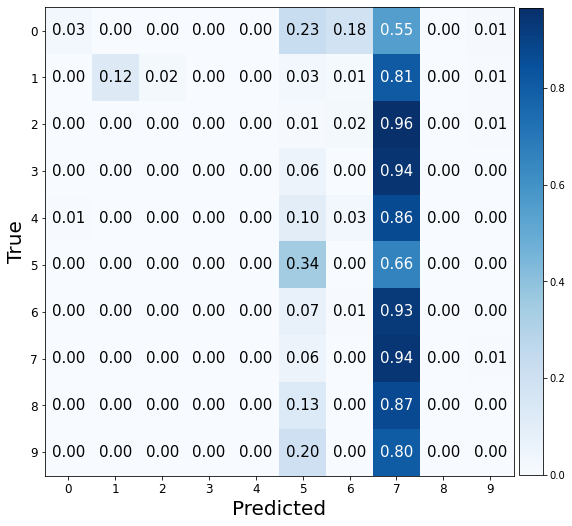

###################



In [ ]:
from torch.utils.data import DataLoader
from torch.utils.data import TensorDataset
from tqdm.notebook import tqdm


best = {'ne':0, 'hd':0, 'wd':0, 'lr':0, 'bs':0, 'f1':0}

bs_list = [256,512,1024]
lr_list = [0.001,0.01,0.1]
wd_list = [0.001,0.01,0.1]
hd_list = [50,80,100]
ne_list = [50,100,150]

pbar = tqdm(total=len(bs_list)*len(lr_list)*len(wd_list)*len(hd_list)*len(ne_list))

for ne in ne_list:
  for bs in bs_list:
    train_ds = TensorDataset(X_train, Y_train)
    train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True)

    for lr in lr_list:
      for wd in wd_list:
        for hd in hd_list:
          input_dim = 28*28
          out_dim = 10
          hidden = hd

          model = torch.nn.Sequential(
            torch.nn.Linear(input_dim, hidden),
            torch.nn.ReLU(),
            torch.nn.Linear(hidden, out_dim)
          )

          optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=wd)
          criterion = torch.nn.CrossEntropyLoss()

          print('ne: {}, hd:{}, wd:{}, lr: {}, bs:{} '.format(ne,hd,wd,lr,bs))
          f1 = train_valid(model,ne,optimizer,criterion)
          print('###################\n')

          if f1 > best['f1']:
            best['f1'] = f1
            best['ne'] = ne
            best['hd'] = hd
            best['wd'] = wd
            best['lr'] = lr
            best['bs'] = bs

          pbar.update()
pbar.close()

In [ ]:
print(best['f1'], best['ne'], best['hd'], best['wd'], best['lr'], best['bs'])

0.9011872038395525 150 100 0.1 0.001 512


ne: 150, hd:100, wd:0.1, lr: 0.1, bs:1024 
Valid Evaluation loss: 0.5202502608299255. f1:0.8939254345644523 acc: 0.8939999938011169 


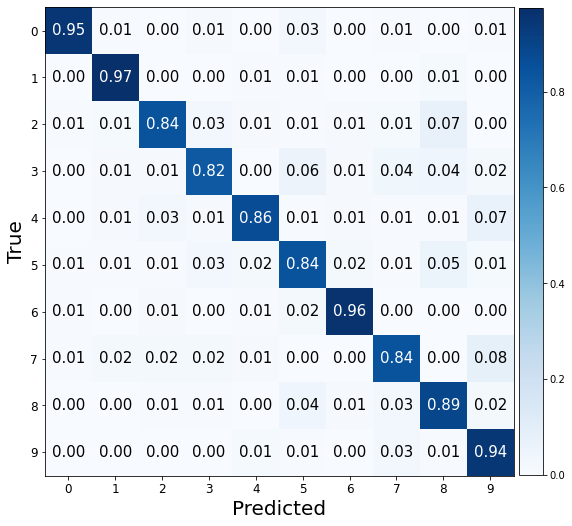

0.8939254345644523
###################



In [ ]:
train_ds = TensorDataset(X_train, Y_train)
train_dl = DataLoader(train_ds, batch_size=best['bs'], shuffle=True)

input_dim = 28*28
out_dim = 10
hidden = best['hd']

model = torch.nn.Sequential(
  torch.nn.Linear(input_dim, hidden),
  torch.nn.ReLU(),
  torch.nn.Linear(hidden, out_dim)
)

optimizer = torch.optim.Adam(model.parameters(), lr=best['lr'], weight_decay=best['wd'])
criterion = torch.nn.CrossEntropyLoss()

print('ne: {}, hd:{}, wd:{}, lr: {}, bs:{} '.format(ne,hd,wd,lr,bs))
f1 = train_valid(model,ne,optimizer,criterion)
print(f1)
print('###################\n')